# Détection de Posidonia oceanica par U-Net

## Objectif du notebook

Nous réalisons ici le pipeline complet et pédagogique pour la segmentation sémantique de la Posidonia oceanica par l'architecture **U-Net** (Ronneberger et al., 2015).

Ce notebook est conçu comme un **tutoriel auto-contenu** : chaque section
est indépendante et documentée. Il sert de référence méthodologique pour
les autres architectures du projet (FCN-VGG16, SegFormer).

## Méthodologie

- **Données** : 376 images training + 94 images testing
- **Split** : stratifié par taux de couverture (300 train + 76 val)
- **Évaluation** : single-split + K-fold k=5 stratifié pour validation finale
- **Comparaisons** : 3 fonctions de perte, 2-3 résolutions, mini-gridsearch

## Structure

0. Configuration globale et setup
1. Dataset Posidonia
2. Prétraitement et augmentation
3. Architecture U-Net
4. Fonctions de perte
5. Fonctions d'évaluation
6. Fonction d'entraînement

7. Expériences (single-split) : variation des fonctions de perte
  - 3 expés (CE, CE+Dice, CE+SEMEDA)
  - Choix de la meilleure loss
  - 3 configs : CE / CE+Dice / CE+SEMEDA
  - Scripts prêts pour les 3

8. Expériences (single-split) : variation de la résolution
  - Avec la meilleure loss : 2 résolutions supplémentaires
  - Choix de la meilleure résolution
  - 3 configs : minimal / standard / fort
  - Scripts prêts pour les 3

9. Expériences (single-split) : variation des prétraitements
  - Avec la meilleure loss et résolution : CLAHE, Expansion+RGB
  - Choix du meilleur prétraitement
  - 3 configs : 224x320 / 352x480 / 480x640
  - Scripts prêts pour les 3


10. Mini-GridSearch sur la meilleure configuration
  - Avec (meilleure loss + meilleure résolution + meilleur prétraitement)
  - 3 lr x 2 batch = 6 configs
  - 3 configs : none / clahe / expansion_rgb
  - Scripts prêts pour les 3

11. Validation finale en K-fold k=5 stratifié
  - Sur la configuration finale optimale


12. Synthèse U-Net
  - Tableau récapitulatif des expériences lancées
  - Analyse comparative


# 0. Configuration globale et setup

## 0.1 Imports

Toutes les librairies nécessaires sont importées ici

In [1]:
# === IMPORTS ===

# Standard library
import os
import sys
import gc
import json
import shutil
import datetime
from pathlib import Path

# Numerical & ML
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms

# Image processing
import cv2
from PIL import Image

# Scikit-learn (split + métriques)
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split
from sklearn.metrics import (
    roc_curve, auc,
    precision_recall_curve, average_precision_score,
    confusion_matrix
)

# Visualization
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Progress bars
from tqdm.auto import tqdm

# Reproductibilité
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# Affichage des versions
print("=== Environnement ===")
print(f"  PyTorch       : {torch.__version__}")
print(f"  NumPy         : {np.__version__}")
print(f"  CUDA          : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"  GPU           : {torch.cuda.get_device_name(0)}")
    print(f"  Mémoire GPU   : {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
print(f"  SEED          : {SEED}")

=== Environnement ===
  PyTorch       : 2.10.0+cu128
  NumPy         : 2.0.2
  CUDA          : True
  GPU           : NVIDIA RTX PRO 6000 Blackwell Server Edition
  Mémoire GPU   : 101.97 GB
  SEED          : 42


## 0.2 Paramètres globaux

Toutes les constantes du notebook sont définies ici. **Pour modifier
une configuration (par exemple changer la résolution), il suffit de
modifier les valeurs ici puis de relancer les cellules suivantes.**

In [2]:
# === PARAMÈTRES GLOBAUX ===

# --- Chemins du repertoire de travail ---
# Sur Colab :
DRIVE_ROOT = "/content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie"

# Sur PC local Windows je pourrai plus tôt prendre cette route :
# DRIVE_ROOT = r"C:\M2_USPN\Projet_Stage_M2\implémentations\version_5"

LOCAL_PATH      = os.path.join(DRIVE_ROOT, "Dataset")
SHARED_DIR      = os.path.join(DRIVE_ROOT, "shared")
ARCH_DIR        = os.path.join(DRIVE_ROOT, "unet")
RESULTS_DIR     = os.path.join(ARCH_DIR, "results")
SINGLESPLIT_DIR = os.path.join(RESULTS_DIR, "singlesplit")
KFOLD_DIR       = os.path.join(RESULTS_DIR, "kfold")
FIGURES_DIR     = os.path.join(RESULTS_DIR, "figures")

# CSV stratifiés (créés en amont dans Tutoriel_01_v5)
TRAIN_CSV       = os.path.join(LOCAL_PATH, "train_split_stratified.csv")
VAL_CSV         = os.path.join(LOCAL_PATH, "val_split_stratified.csv")

# --- Paramètres du dataset ---
IMG_H, IMG_W    = 352, 480     # résolution par défaut (multiple de 32)
N_CLASSES       = 2            # 0 = fond, 1 = posidonie
BATCH_SIZE      = 8            # à ajuster selon GPU disponible

# --- Paramètres d'entraînement par défaut ---
DEFAULT_LR      = 1e-4         # learning rate U-Net standard
DEFAULT_EPOCHS  = 100           # maximum d'époques (early stopping souvent avant)
DEFAULT_PATIENCE = 9           # patience pour early stopping
DEFAULT_WEIGHT_DECAY = 1e-4

# --- Métrique sur laquelle on se base pour choisir le meilleur seuil ---
DEFAULT_THRESHOLD_CRITERION = "recall_minus_fallout"  # Martin-Abadal 2018

# --- Device ---
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Affichage
print("=== Configuration ===")
print(f"  Drive root      : {DRIVE_ROOT}")
print(f"  Dataset path    : {LOCAL_PATH}")
print(f"  Image size      : {IMG_H} × {IMG_W}")
print(f"  Classes         : {N_CLASSES} (0=fond, 1=posidonie)")
print(f"  Batch size      : {BATCH_SIZE}")
print(f"  Device          : {DEVICE}")
print(f"  Default LR      : {DEFAULT_LR}")
print(f"  Default epochs  : {DEFAULT_EPOCHS}")
print(f"  Default patience: {DEFAULT_PATIENCE}")

=== Configuration ===
  Drive root      : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie
  Dataset path    : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/Dataset
  Image size      : 352 × 480
  Classes         : 2 (0=fond, 1=posidonie)
  Batch size      : 8
  Device          : cuda
  Default LR      : 0.0001
  Default epochs  : 100
  Default patience: 9


## 0.3 Setup Drive (Colab uniquement)

Cette cellule **doit être exécutée en premier sur chaque nouvelle session Colab**.
Elle :
1. Monte Google Drive
2. Crée la structure de dossiers si elle n'existe pas
3. Vérifie que tous les fichiers nécessaires sont présents

**Sur un environnement local**, je sauterai cette cellule.

In [3]:
# === SETUP DRIVE (à exécuter en début de session Colab) ===

# Détection automatique de Colab
try:
    from google.colab import drive
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    # Monter Drive si pas déjà monté
    if not os.path.exists("/content/drive/MyDrive"):
        drive.mount('/content/drive')
        print("Google Drive monté")
    else:
        print("Google Drive déjà monté")
else:
    print("Environnement local détecté (pas de Drive à monter)")

# Créer la structure de dossiers (no-op si existant)
for d in [SHARED_DIR, ARCH_DIR, RESULTS_DIR,
          SINGLESPLIT_DIR, KFOLD_DIR, FIGURES_DIR]:
    os.makedirs(d, exist_ok=True)

print("\n=== Structure des dossiers ===")
print(f"  shared/         : {SHARED_DIR}")
print(f"  unet/           : {ARCH_DIR}")
print(f"  unet/results/   : {RESULTS_DIR}")
print(f"    ├─ singlesplit/")
print(f"    ├─ kfold/")
print(f"    └─ figures/")

Mounted at /content/drive
Google Drive monté

=== Structure des dossiers ===
  shared/         : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/shared
  unet/           : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet
  unet/results/   : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results
    ├─ singlesplit/
    ├─ kfold/
    └─ figures/


## 0.4 Vérifications de l'environnement

Vérifications préalables : Dataset accessible, CSV stratifiés présents,
SEMEDA pré-entraîné disponible

In [4]:
# === VÉRIFICATIONS ===

print("=== Vérifications préalables ===\n")

# 1. Dataset
print("1. Dataset Posidonia :")
training_imgs = os.path.join(LOCAL_PATH, "training", "images")
testing_imgs  = os.path.join(LOCAL_PATH, "testing", "images")

for label, path in [("Training images", training_imgs), ("Testing images", testing_imgs)]:
    if os.path.exists(path):
        n = len([f for f in os.listdir(path) if f.lower().endswith(('.png', '.jpg'))])
        print(f"  {label}: {n} fichiers ({path})")
    else:
        print(f"  {label}: INTROUVABLE ({path})")

# 2. CSV stratifiés
print("\n2. CSV stratifiés :")
for label, path in [("Train CSV", TRAIN_CSV), ("Val CSV", VAL_CSV)]:
    if os.path.exists(path):
        df = pd.read_csv(path)
        print(f"   {label}: {len(df)} lignes ({path})")
    else:
        print(f"   {label}: INTROUVABLE ({path})")

# 3. SEMEDA pré-entraîné : bien qu'il ne sera pas utile pour les premières expériementations, on le charge tout de mêmes
print("\n3. SEMEDA pré-entraîné:")
semeda_path = os.path.join(SHARED_DIR, "semeda_net_pretrained.pth")
if os.path.exists(semeda_path):
    size_mb = os.path.getsize(semeda_path) / (1024*1024)
    print(f"   Disponible : {semeda_path} ({size_mb:.2f} MB)")
else:
    print(f"   Non trouvé : {semeda_path}")
    print(f"     SEMEDA sera pré-entraîné automatiquement quand nécessaire")

# 4. Espace disque
if IN_COLAB:
    import shutil as sh
    stat = sh.disk_usage('/content')
    print(f"\n4. Espace disque Colab :")
    print(f"   Total : {stat.total/1e9:.1f} GB")
    print(f"   Libre : {stat.free/1e9:.1f} GB")

print("\n=== Vérifications terminées ===")

=== Vérifications préalables ===

1. Dataset Posidonia :
  Training images: 376 fichiers (/content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/Dataset/training/images)
  Testing images: 94 fichiers (/content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/Dataset/testing/images)

2. CSV stratifiés :
   Train CSV: 300 lignes (/content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/Dataset/train_split_stratified.csv)
   Val CSV: 76 lignes (/content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/Dataset/val_split_stratified.csv)

3. SEMEDA pré-entraîné:
   Disponible : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/shared/semeda_net_pretrained.pth (0.34 MB)

4. Espace disque Colab :
   Total : 253.1 GB
   Libre : 202.2 GB

=== Vérifications terminées ===


# 1. Dataset Posidonia

Cette section définit les classes Dataset PyTorch pour charger les images
et leurs masques de segmentation.

**Deux modes de chargement** :
- `PosidoniaDatasetFromCSV` : charge depuis les CSV stratifiés (training/val splits)
- `PosidoniaDataset` : charge directement depuis un dossier (testing)

**Caractéristiques** :
- Conversion automatique masques RGB (rouge = posidonie) -> masques binaires {0, 1}
- Conversion automatique masques grayscale (testing) -> masques binaires {0, 1}
- Resize uniforme à `(IMG_H, IMG_W)` avec interpolation adaptée (bilinéaire pour images, nearest pour masques)
- Support optionnel de l'augmentation et du prétraitement

## 1.1 Fonctions utilitaires de conversion des masques

Le dataset Posidonia a deux formats de masques :
- **Training** : RGB avec posidonie en rouge `(255, 0, 0)`
- **Testing** : Grayscale avec différentes valeurs représentant les classes

Ces fonctions standardisent les deux formats vers un format binaire commun :
`0` = fond, `1` = posidonie.

In [5]:
# === FONCTIONS DE CONVERSION DES MASQUES ===

def rgb_mask_to_class(mask_pil, red_threshold=200, low_threshold=50):
    """
    Convertit un masque RGB (training) en masque binaire {0, 1}.

    Le pixel est posidonie si :
        R > red_threshold AND G < low_threshold AND B < low_threshold

    Args:
        mask_pil : PIL Image RGB
        red_threshold : seuil minimum pour le canal R (rouge)
        low_threshold : seuil maximum pour G et B

    Returns:
        np.ndarray (H, W) avec valeurs 0 ou 1
    """
    mask_np = np.array(mask_pil)
    is_posidonie = (
        (mask_np[:, :, 0] > red_threshold) &
        (mask_np[:, :, 1] < low_threshold) &
        (mask_np[:, :, 2] < low_threshold)
    )
    return is_posidonie.astype(np.uint8)


def grayscale_mask_to_class(mask_pil, threshold=127):
    """
    Convertit un masque grayscale (testing) en masque binaire {0, 1}.

    Args:
        mask_pil : PIL Image grayscale (ou RGB qui sera converti)
        threshold : seuil de binarisation

    Returns:
        np.ndarray (H, W) avec valeurs 0 ou 1
    """
    if mask_pil.mode != 'L':
        mask_pil = mask_pil.convert('L')
    mask_np = np.array(mask_pil)
    return (mask_np > threshold).astype(np.uint8)


# Test rapide sur des données synthétiques
test_rgb = Image.fromarray(np.array([
    [[255, 0, 0], [0, 0, 0]],
    [[200, 100, 100], [255, 10, 10]],
], dtype=np.uint8))
test_gray = Image.fromarray(np.array([
    [255, 0],
    [128, 200],
], dtype=np.uint8))

print("=== Test des fonctions de conversion ===")
print(f"RGB test -> {rgb_mask_to_class(test_rgb)}")
print(f"Grayscale test -> {grayscale_mask_to_class(test_gray)}")
print(" Fonctions opérationnelles")

=== Test des fonctions de conversion ===
RGB test -> [[1 0]
 [0 1]]
Grayscale test -> [[1 0]
 [1 1]]
 Fonctions opérationnelles


## Fonctions utilitaires pour le chargement

Ces fonctions détectent automatiquement :
- L'**extension** dominante des fichiers dans un dossier
- Le **suffixe** des noms de masques par rapport aux images (par exemple `_gt`)

Cela rend les classes Dataset plus robustes face aux différentes conventions
de nommage.

In [6]:
# === FONCTIONS UTILITAIRES POUR LE CHARGEMENT DES DONNÉES ===

from collections import Counter


def detect_extension(file_list, label="fichier"):
    """
    Détecte l'extension dominante dans une liste de fichiers.

    Args:
        file_list : liste de noms de fichiers
        label : étiquette pour le message d'erreur

    Returns:
        str : extension la plus fréquente (avec le point), ex: '.png'
    """
    extensions = [os.path.splitext(f)[1].lower() for f in file_list]
    if not extensions:
        raise FileNotFoundError(f"Aucun fichier {label} trouvé !")
    return Counter(extensions).most_common(1)[0][0]


def detect_mask_suffix(img_files, mask_files):
    """
    Détecte si les masques ont un suffixe par rapport aux images.

    Exemple :
        image  : valldemossa_PO022.png
        masque : valldemossa_PO022_gt.png
        -> suffixe détecté : "_gt"

    Stratégie :
    1. Si certains noms correspondent directement -> pas de suffixe ("")
    2. Sinon, on teste des suffixes communs : _gt, _mask, _label, _seg
    3. En dernier recours, devinette à partir d'un fichier exemple

    Args:
        img_files : liste des noms de fichiers images
        mask_files : liste des noms de fichiers masques

    Returns:
        str : le suffixe détecté (ex: "_gt"), ou "" si pas de suffixe
    """
    if not img_files or not mask_files:
        return ""

    # Prendre les noms sans extension
    img_basenames  = set(os.path.splitext(f)[0] for f in img_files)
    mask_basenames = set(os.path.splitext(f)[0] for f in mask_files)

    # Test 1 : correspondance directe (pas de suffixe)
    if len(img_basenames & mask_basenames) > 0:
        return ""

    # Test 2 : suffixes communs
    common_suffixes = ["_gt", "_mask", "_label", "_seg"]
    for suffix in common_suffixes:
        mask_without_suffix = set(
            m[:-len(suffix)] for m in mask_basenames if m.endswith(suffix)
        )
        if len(mask_without_suffix & img_basenames) > 0:
            return suffix

    # Test 3 : devinette à partir d'un fichier exemple
    sample_mask = next(iter(mask_basenames))
    for img_name in img_basenames:
        if sample_mask.startswith(img_name) and len(sample_mask) > len(img_name):
            return sample_mask[len(img_name):]

    return ""


# Test rapide
print("=== Test des fonctions utilitaires ===")

# Test detect_extension
test_files = ['image1.png', 'image2.png', 'image3.jpg', 'image4.png']
ext = detect_extension(test_files, "test")
print(f"  detect_extension(['png', 'png', 'jpg', 'png']) -> '{ext}' (attendu : '.png')")

# Test detect_mask_suffix
test_imgs = ['palma_001.png', 'palma_002.png', 'palma_003.png']
test_masks = ['palma_001_gt.png', 'palma_002_gt.png', 'palma_003_gt.png']
suffix = detect_mask_suffix(test_imgs, test_masks)
print(f"  detect_mask_suffix avec suffixe '_gt' -> '{suffix}' (attendu : '_gt')")

# Test sans suffixe
test_masks_no_suffix = ['palma_001.png', 'palma_002.png', 'palma_003.png']
suffix = detect_mask_suffix(test_imgs, test_masks_no_suffix)
print(f"  detect_mask_suffix sans suffixe -> '{suffix}' (attendu : '')")

print("\n Fonctions utilitaires opérationnelles")

=== Test des fonctions utilitaires ===
  detect_extension(['png', 'png', 'jpg', 'png']) -> '.png' (attendu : '.png')
  detect_mask_suffix avec suffixe '_gt' -> '_gt' (attendu : '_gt')
  detect_mask_suffix sans suffixe -> '' (attendu : '')

 Fonctions utilitaires opérationnelles


## 1.2 Classe PosidoniaDatasetFromCSV

Charge les images training à partir d'un CSV stratifié.
Utilisé pour les splits `train_split_stratified.csv` et `val_split_stratified.csv`.

**Paramètres** :
- `csv_path` : chemin vers le CSV (colonne 'name' avec les noms sans extension)
- `root_path` : chemin vers le dossier Dataset/
- `split` : "training" (utilise le dossier training/)
- `img_h, img_w` : taille de redimensionnement
- `augment` : applique augmentations (à utiliser en training uniquement)
- `preprocess` : None ou 'clahe' (prétraitement optionnel)

In [7]:
# === CLASSE DATASET POUR LES CSV STRATIFIÉS ===

class PosidoniaDatasetFromCSV(Dataset):
    """
    Dataset Posidonia chargé depuis un CSV.

    Le CSV doit contenir au minimum une colonne 'name' avec les noms
    de fichiers (sans extension). Les images sont cherchées dans
    {root_path}/{split}/images/ et les masques dans {root_path}/{split}/gt_images/.

    Le masque peut avoir un suffixe (par exemple "_gt") : la classe le détecte
    automatiquement en analysant le premier fichier du dossier gt_images/.
    """

    def __init__(self, csv_path, root_path, split="training",
                 img_h=IMG_H, img_w=IMG_W,
                 augment=False, preprocess=None):
        # Chargement du CSV
        self.df = pd.read_csv(csv_path)
        self.root_path = root_path
        self.split = split
        self.img_h = img_h
        self.img_w = img_w
        self.augment = augment
        self.preprocess = preprocess

        # Chemins des dossiers
        self.img_dir  = os.path.join(root_path, split, "images")
        self.mask_dir = os.path.join(root_path, split, "gt_images")

        # Détection automatique des extensions
        sample_files = os.listdir(self.img_dir)
        self.img_ext  = self._detect_extension(sample_files, "image")
        sample_masks  = os.listdir(self.mask_dir)
        self.mask_ext = self._detect_extension(sample_masks, "mask")

        # === NOUVEAU : détection automatique du suffixe des masques ===
        self.mask_suffix = self._detect_mask_suffix(sample_files, sample_masks)

        # Transformations PyTorch
        self.resize_img  = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.BILINEAR)
        self.resize_mask = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.NEAREST)
        self.to_tensor   = transforms.ToTensor()

        # Affichage informatif (utile pour debug)
        print(f"  [{split}] Extensions détectées : image={self.img_ext}, mask={self.mask_ext}")
        if self.mask_suffix:
            print(f"  [{split}] Suffixe des masques détecté : '{self.mask_suffix}'")

    @staticmethod
    def _detect_extension(file_list, label):
        """Détecte l'extension dominante dans une liste de fichiers."""
        extensions = [os.path.splitext(f)[1].lower() for f in file_list]
        if not extensions:
            raise FileNotFoundError(f"Aucun fichier {label} trouvé !")
        from collections import Counter
        ext = Counter(extensions).most_common(1)[0][0]
        return ext

    @staticmethod
    def _detect_mask_suffix(img_files, mask_files):
        """
        Détecte si les masques ont un suffixe par rapport aux images.

        Exemple :
            image  : valldemossa_PO022.png
            masque : valldemossa_PO022_gt.png
            -> suffixe détecté : "_gt"

        Returns:
            str : le suffixe détecté (ex: "_gt"), ou "" si pas de suffixe
        """
        if not img_files or not mask_files:
            return ""

        # Prendre les noms sans extension
        img_basenames  = set(os.path.splitext(f)[0] for f in img_files)
        mask_basenames = set(os.path.splitext(f)[0] for f in mask_files)

        # Tester si certains masques correspondent directement (pas de suffixe)
        direct_matches = img_basenames & mask_basenames
        if len(direct_matches) > 0:
            return ""

        # Sinon, tester des suffixes communs
        common_suffixes = ["_gt", "_mask", "_label", "_seg"]
        for suffix in common_suffixes:
            # Vérifier si des masques se terminent par ce suffixe +
            # si on retrouve les bons noms d'images en l'enlevant
            mask_without_suffix = set(
                m[:-len(suffix)] for m in mask_basenames if m.endswith(suffix)
            )
            if len(mask_without_suffix & img_basenames) > 0:
                return suffix

        # Sinon, prendre un masque au hasard et essayer de deviner
        sample_mask = next(iter(mask_basenames))
        for img_name in img_basenames:
            if sample_mask.startswith(img_name) and len(sample_mask) > len(img_name):
                return sample_mask[len(img_name):]

        return ""

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # Récupérer le nom du fichier
        name = self.df.iloc[idx]['name']

        # Chemins (avec gestion du suffixe pour le masque)
        img_path  = os.path.join(self.img_dir,  name + self.img_ext)
        mask_path = os.path.join(self.mask_dir, name + self.mask_suffix + self.mask_ext)

        # Chargement
        img  = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        # Redimensionnement
        img  = self.resize_img(img)
        mask = self.resize_mask(mask)

        # === Augmentation (avant prétraitement pour cohérence) ===
        if self.augment and self.split == "training":
            # Flips géométriques (cohérents image + masque)
            if np.random.rand() < 0.5:
                img  = transforms.functional.hflip(img)
                mask = transforms.functional.hflip(mask)
            if np.random.rand() < 0.3:
                img  = transforms.functional.vflip(img)
                mask = transforms.functional.vflip(mask)

            # Augmentation photométrique (image uniquement)
            if self.preprocess == "clahe":
                img = transforms.ColorJitter(brightness=0.2)(img)
            else:
                img = transforms.ColorJitter(brightness=0.3, contrast=0.3)(img)

          # === Prétraitement (après augmentation) ===
          # NOTE : pour l'instant, seul CLAHE est géré ici car la fonction `apply_clahe`
          # sera définie en Section 2. Les autres méthodes (Expansion+RGB, homomorphique,
          # ondelettes, Bazeille, etc.) seront également ajoutées en Section 2 via un
          # REGISTRY pattern, qui remplacera ces lignes if/elif par un simple appel
          # générique : img = apply_preprocess(img, self.preprocess)
        if self.preprocess == "clahe":
            img_np = np.array(img)
            img_np = apply_clahe(img_np) # Cette fonction sera définie à la section 2 dans laquelle nous allons définir les fonctions de pré-traitement
            img = Image.fromarray(img_np)

        # === Conversion en tenseurs ===
        if self.split == "training":
            mask_np = rgb_mask_to_class(mask)
        else:
            mask_np = grayscale_mask_to_class(mask)

        img_tensor  = self.to_tensor(img)
        mask_tensor = torch.from_numpy(mask_np).long()

        return img_tensor, mask_tensor


print(" Classe PosidoniaDatasetFromCSV définie (avec détection automatique du suffixe)")

 Classe PosidoniaDatasetFromCSV définie (avec détection automatique du suffixe)


## 1.3 Classe PosidoniaDataset (pour testing)

Charge directement depuis le dossier `testing/`, sans CSV.
Utilisé pour le set de test externe (94 images).

In [8]:
# === CLASSE DATASET POUR LE TESTING ===

class PosidoniaDataset(Dataset):
    """
    Dataset Posidonia chargé directement depuis un dossier.
    Conçu principalement pour le testing set.

    Détecte automatiquement le suffixe des masques (par exemple "_gt").
    """

    def __init__(self, root_path, split="testing",
                 img_h=IMG_H, img_w=IMG_W,
                 augment=False, preprocess=None):
        self.root_path = root_path
        self.split = split
        self.img_h = img_h
        self.img_w = img_w
        self.augment = augment
        self.preprocess = preprocess

        # Chemins
        self.img_dir  = os.path.join(root_path, split, "images")
        self.mask_dir = os.path.join(root_path, split, "gt_images")

        # Liste des fichiers
        self.image_files = sorted([
            f for f in os.listdir(self.img_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])

        # Détection automatique du suffixe des masques
        mask_files = os.listdir(self.mask_dir)
        self.mask_suffix = PosidoniaDatasetFromCSV._detect_mask_suffix(
            self.image_files, mask_files
        )

        # Détection de l'extension des masques
        mask_extensions = [os.path.splitext(f)[1].lower() for f in mask_files]
        from collections import Counter
        self.mask_ext = Counter(mask_extensions).most_common(1)[0][0] if mask_extensions else '.png'

        # Transformations
        self.resize_img  = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.BILINEAR)
        self.resize_mask = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.NEAREST)
        self.to_tensor   = transforms.ToTensor()

        print(f"  [{split}] Suffixe des masques : '{self.mask_suffix}' (extension : {self.mask_ext})")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
      img_name = self.image_files[idx]
      img_path = os.path.join(self.img_dir, img_name)

      base_name = os.path.splitext(img_name)[0]
      mask_path = os.path.join(self.mask_dir, base_name + self.mask_suffix + self.mask_ext)

      if not os.path.exists(mask_path):
          raise FileNotFoundError(
              f"Masque introuvable : {mask_path}\n"
              f"   (image source : {img_name})\n"
              f"   Suffixe détecté : '{self.mask_suffix}'\n"
              f"   Extension détectée : {self.mask_ext}"
          )

      img  = Image.open(img_path).convert("RGB")
      mask = Image.open(mask_path)

      img  = self.resize_img(img)
      mask = self.resize_mask(mask)

      # === Prétraitement (après augmentation) ===
      # NOTE : pour l'instant, seul CLAHE est géré ici car la fonction `apply_clahe`
      # sera définie en Section 2. Les autres méthodes (Expansion+RGB, homomorphique,
      # ondelettes, Bazeille, etc.) seront également ajoutées en Section 2 via un
      # REGISTRY pattern, qui remplacera ces lignes if/elif par un simple appel
      # générique : img = apply_preprocess(img, self.preprocess)
      if self.preprocess == "clahe":
          img_np = np.array(img)
          img_np = apply_clahe(img_np)
          img = Image.fromarray(img_np)
      # === Conversion masque ===
      # Conversion masque (testing : toujours grayscale)
      mask_np = grayscale_mask_to_class(mask)

      img_tensor  = self.to_tensor(img)
      mask_tensor = torch.from_numpy(mask_np).long()

      return img_tensor, mask_tensor

print(" Classe PosidoniaDataset définie (avec détection automatique du suffixe)")

 Classe PosidoniaDataset définie (avec détection automatique du suffixe)


## 1.4 Test de chargement des datasets

Vérification que les 3 datasets se chargent correctement et ont les bonnes tailles.

In [9]:
# === TEST DE CHARGEMENT DES DATASETS ===

print("=== Chargement des datasets ===\n")

# 1. Training (depuis CSV stratifié)
train_ds = PosidoniaDatasetFromCSV(
    csv_path=TRAIN_CSV,
    root_path=LOCAL_PATH,
    split="training",
    augment=False,           # désactivé pour le test, sera réactivé pour entraînement
    preprocess=None,
)

# 2. Validation (depuis CSV stratifié)
val_ds = PosidoniaDatasetFromCSV(
    csv_path=VAL_CSV,
    root_path=LOCAL_PATH,
    split="training",
    augment=False,
    preprocess=None,
)

# 3. Testing (depuis dossier direct)
test_ds = PosidoniaDataset(
    root_path=LOCAL_PATH,
    split="testing",
    augment=False,
    preprocess=None,
)

# Affichage des tailles
print(f"  Train : {len(train_ds):3d} images (attendu : 300)")
print(f"  Val   : {len(val_ds):3d} images (attendu :  76)")
print(f"  Test  : {len(test_ds):3d} images (attendu :  94)")

# Vérification d'un échantillon
print(f"\n=== Vérification d'un échantillon ===")
img, mask = train_ds[0]
print(f"  Image shape : {img.shape}     (attendu : torch.Size([3, {IMG_H}, {IMG_W}]))")
print(f"  Image dtype : {img.dtype}     (attendu : torch.float32)")
print(f"  Image range : [{img.min():.3f}, {img.max():.3f}]  (attendu : [0, 1])")
print(f"  Mask shape  : {mask.shape}    (attendu : torch.Size([{IMG_H}, {IMG_W}]))")
print(f"  Mask dtype  : {mask.dtype}    (attendu : torch.int64)")
print(f"  Mask valeurs uniques : {torch.unique(mask).tolist()}  (attendu : [0, 1])")

# Vérification testing aussi
print(f"\n=== Vérification testing ===")
img_t, mask_t = test_ds[0]
print(f"  Image shape : {img_t.shape}")
print(f"  Mask shape  : {mask_t.shape}")
print(f"  Mask valeurs uniques : {torch.unique(mask_t).tolist()}")

print("\n Tous les datasets se chargent correctement")

=== Chargement des datasets ===

  [training] Extensions détectées : image=.png, mask=.png
  [training] Suffixe des masques détecté : '_gt'
  [training] Extensions détectées : image=.png, mask=.png
  [training] Suffixe des masques détecté : '_gt'
  [testing] Suffixe des masques : '_gt' (extension : .png)
  Train : 300 images (attendu : 300)
  Val   :  76 images (attendu :  76)
  Test  :  94 images (attendu :  94)

=== Vérification d'un échantillon ===
  Image shape : torch.Size([3, 352, 480])     (attendu : torch.Size([3, 352, 480]))
  Image dtype : torch.float32     (attendu : torch.float32)
  Image range : [0.020, 1.000]  (attendu : [0, 1])
  Mask shape  : torch.Size([352, 480])    (attendu : torch.Size([352, 480]))
  Mask dtype  : torch.int64    (attendu : torch.int64)
  Mask valeurs uniques : [0, 1]  (attendu : [0, 1])

=== Vérification testing ===
  Image shape : torch.Size([3, 352, 480])
  Mask shape  : torch.Size([352, 480])
  Mask valeurs uniques : [0, 1]

 Tous les datasets se

## 1.5 Visualisation d'échantillons

Affichage d'images et de leurs masques pour vérifier visuellement que tout est cohérent.

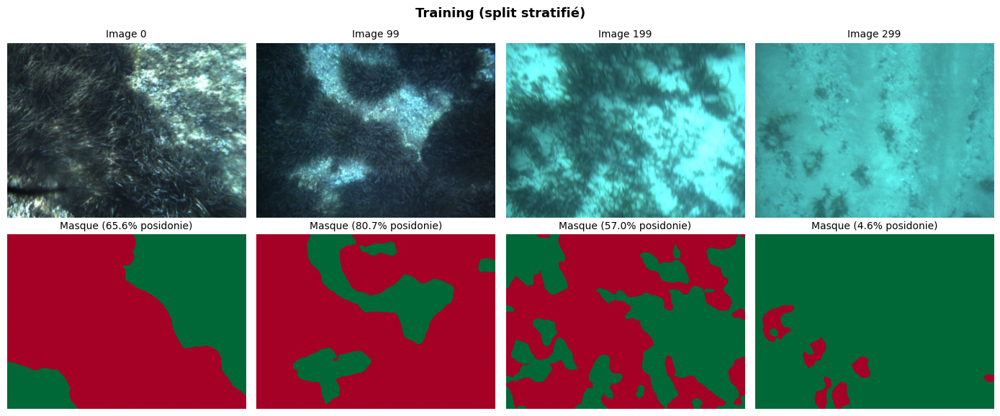

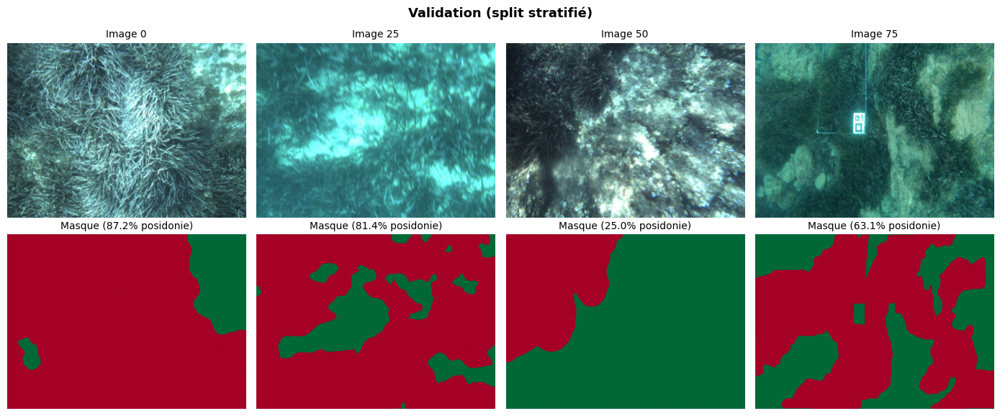

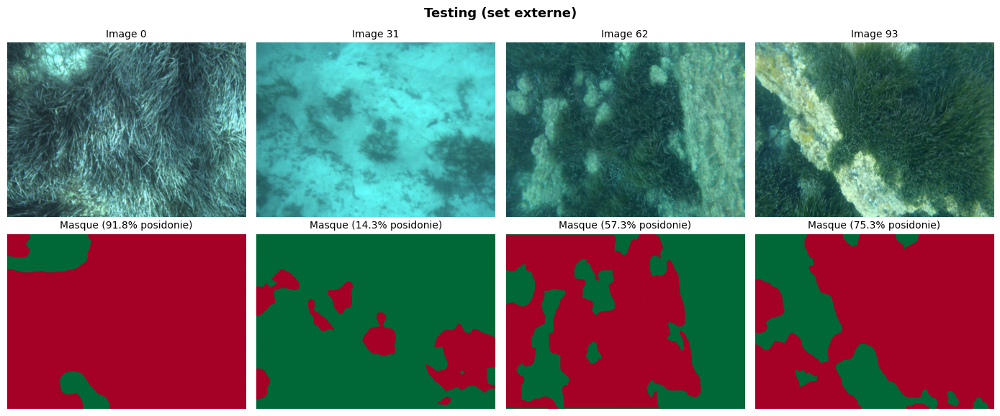

In [10]:
# === VISUALISATION D'ÉCHANTILLONS ===

def visualize_dataset_samples(dataset, n_samples=4, title="Échantillons"):
    """Affiche n_samples paires (image, masque) du dataset."""
    fig, axes = plt.subplots(2, n_samples, figsize=(n_samples * 3.5, 6))

    # Sélection d'indices variés
    n_total = len(dataset)
    indices = np.linspace(0, n_total - 1, n_samples).astype(int)

    for col, idx in enumerate(indices):
        img, mask = dataset[idx]

        # Image : (3, H, W) → (H, W, 3) pour matplotlib
        img_np = img.permute(1, 2, 0).numpy()
        mask_np = mask.numpy()

        # Calcul du taux de couverture
        coverage = mask_np.mean() * 100

        # Affichage image
        axes[0, col].imshow(img_np)
        axes[0, col].set_title(f"Image {idx}", fontsize=10)
        axes[0, col].axis('off')

        # Affichage masque
        axes[1, col].imshow(mask_np, cmap='RdYlGn_r', vmin=0, vmax=1)
        axes[1, col].set_title(f"Masque ({coverage:.1f}% posidonie)", fontsize=10)
        axes[1, col].axis('off')

    fig.suptitle(title, fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.show()
    return fig

# Visualisation des 3 datasets
fig_train = visualize_dataset_samples(train_ds, n_samples=4, title="Training (split stratifié)")
fig_val   = visualize_dataset_samples(val_ds,   n_samples=4, title="Validation (split stratifié)")
fig_test  = visualize_dataset_samples(test_ds,  n_samples=4, title="Testing (set externe)")

Confirmation des hypothèses concernant la binarisation des couleurs qu'on s'est fixé dans le script plus haut

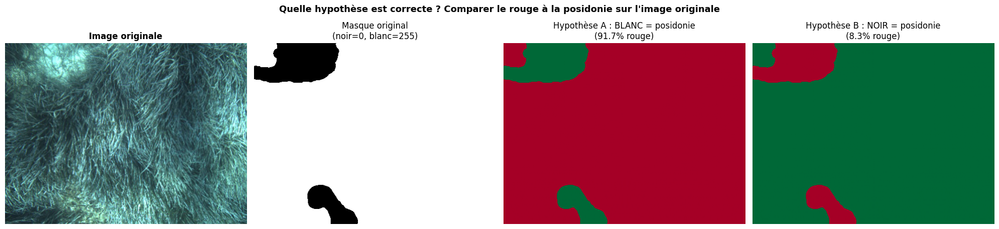

In [11]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os

# Image qu'on analyse
img_name_base = "calablava_000063"  # ajustez selon votre cas
img_path = os.path.join(LOCAL_PATH, "testing", "images", img_name_base + ".png")
mask_path = os.path.join(LOCAL_PATH, "testing", "gt_images", img_name_base + "_gt.png")

# Chargement
img = np.array(Image.open(img_path).convert("RGB"))
mask_original = np.array(Image.open(mask_path))

# Visualisation
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(img)
axes[0].set_title("Image originale", fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(mask_original, cmap='gray')
axes[1].set_title(f"Masque original\n(noir=0, blanc=255)", fontsize=12)
axes[1].axis('off')

# Hypothèse A : blanc = posidonie
mask_A = (mask_original > 127).astype(np.uint8)
axes[2].imshow(mask_A, cmap='RdYlGn_r', vmin=0, vmax=1)
axes[2].set_title(f"Hypothèse A : BLANC = posidonie\n({mask_A.mean()*100:.1f}% rouge)", fontsize=12)
axes[2].axis('off')

# Hypothèse B : noir = posidonie
mask_B = (mask_original < 127).astype(np.uint8)
axes[3].imshow(mask_B, cmap='RdYlGn_r', vmin=0, vmax=1)
axes[3].set_title(f"Hypothèse B : NOIR = posidonie\n({mask_B.mean()*100:.1f}% rouge)", fontsize=12)
axes[3].axis('off')

plt.suptitle(f"Quelle hypothèse est correcte ? Comparer le rouge à la posidonie sur l'image originale",
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

Notre hypothèse est bonne (la A). Nous allons donc continuer

## 1.6 Statistiques de distribution

Calcul de la distribution des taux de couverture de posidonie dans chaque dataset. Pour vérifier que la stratification est respectée.

=== Calcul des statistiques de couverture ===

  Calcul des taux de couverture pour Train...


  0%|          | 0/300 [00:00<?, ?it/s]

  Calcul des taux de couverture pour Val...


  0%|          | 0/76 [00:00<?, ?it/s]

  Calcul des taux de couverture pour Test...


  0%|          | 0/94 [00:00<?, ?it/s]


=== Résumé des distributions ===

Dataset      N     Moy.      Std      Min      Max    Médiane
------------------------------------------------------------
Train      300   43.51%   29.03%    0.00%  100.00%     45.72%
Val         76   44.17%   29.01%    0.00%  100.00%     45.99%
Test        94   44.76%   30.33%    0.00%  100.00%     45.55%


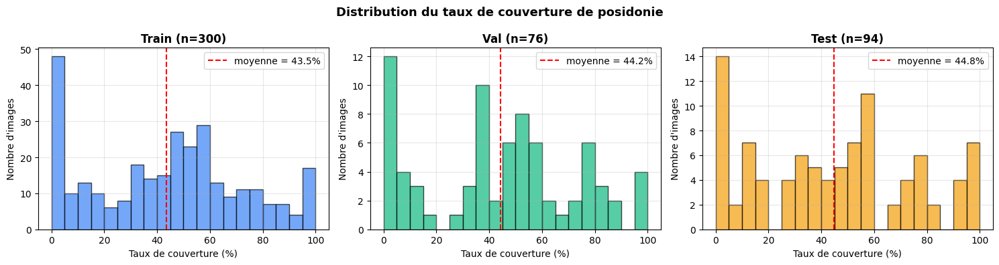


 Les distributions sont cohérentes entre train, val et test


In [10]:
# === STATISTIQUES DE DISTRIBUTION ===

def compute_coverage_stats(dataset, name):
    """Calcule et affiche les statistiques de couverture du dataset."""
    coverages = []
    print(f"  Calcul des taux de couverture pour {name}...")
    for i in tqdm(range(len(dataset)), leave=False):
        _, mask = dataset[i]
        coverages.append(mask.float().mean().item())

    coverages = np.array(coverages)
    return {
        'name': name,
        'n': len(coverages),
        'mean': coverages.mean(),
        'std': coverages.std(),
        'min': coverages.min(),
        'max': coverages.max(),
        'median': np.median(coverages),
        'values': coverages,
    }


print("=== Calcul des statistiques de couverture ===\n")
stats_train = compute_coverage_stats(train_ds, "Train")
stats_val   = compute_coverage_stats(val_ds, "Val")
stats_test  = compute_coverage_stats(test_ds, "Test")

# Affichage tabulaire
print("\n=== Résumé des distributions ===\n")
print(f"{'Dataset':<8} {'N':>5} {'Moy.':>8} {'Std':>8} {'Min':>8} {'Max':>8} {'Médiane':>10}")
print("-" * 60)
for s in [stats_train, stats_val, stats_test]:
    print(f"{s['name']:<8} {s['n']:>5} "
          f"{s['mean']*100:>7.2f}% {s['std']*100:>7.2f}% "
          f"{s['min']*100:>7.2f}% {s['max']*100:>7.2f}% "
          f"{s['median']*100:>9.2f}%")

# Visualisation des distributions
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, s, color in zip(axes,
                          [stats_train, stats_val, stats_test],
                          ['#3b82f6', '#10b981', '#f59e0b']):
    ax.hist(s['values'] * 100, bins=20, color=color, alpha=0.7, edgecolor='black')
    ax.axvline(s['mean'] * 100, color='red', linestyle='--', label=f"moyenne = {s['mean']*100:.1f}%")
    ax.set_title(f"{s['name']} (n={s['n']})", fontsize=12, fontweight='bold')
    ax.set_xlabel("Taux de couverture (%)")
    ax.set_ylabel("Nombre d'images")
    ax.legend()
    ax.grid(alpha=0.3)

plt.suptitle("Distribution du taux de couverture de posidonie", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n Les distributions sont cohérentes entre train, val et test")

# 2. Prétraitement et augmentation

## 2.1 Pourquoi prétraiter les images sous-marines ?

Les images sous-marines présentent plusieurs **dégradations spécifiques** au milieu aquatique :

| Phénomène | Effet visuel | Origine |
|---|---|---|
| **Atténuation sélective** | Disparition du rouge avec la profondeur | Absorption de l'eau, fonction de la longueur d'onde |
| **Diffusion (scattering)** | Voile de diffusion, perte de contraste | Particules en suspension |
| **Illumination non-uniforme** | Zones sombres et claires alternées | Source lumineuse ponctuelle (soleil ou projecteur) |
| **Dominante bleu-vert** | Couleurs naturelles non perçues | Atténuation différentielle des canaux R/G/B |

**Approches de prétraitement étudiées dans la littérature** :
- Égalisation locale du contraste (CLAHE) - Pizer 1987
- Filtre homomorphique - correction d'illumination
- Débruitage par ondelettes - Donoho 1995
- Filtre anisotropique - Perona-Malik 1990
- Expansion dynamique + égalisation RGB
- Pipelines composites - Bazeille et al. 2006

**Démarche dans ce notebook** : implémenter un système **modulaire** (registry) qui permet d'ajouter facilement de nouvelles méthodes. Pour démarrer, on implémente CLAHE et Expansion+RGB.

## 2.2 Implémentation des méthodes de prétraitement

### 2.2.1 CLAHE (Contrast Limited Adaptive Histogram Equalization)

**Principe** : Égalise l'histogramme **localement** sur des tuiles (par exemple 8x8),
avec une **limite de contraste** pour éviter d'amplifier le bruit.

**Application sur le canal L de l'espace LAB** :
- Permet de rehausser le contraste sans altérer les couleurs
- L = Lightness (luminance perceptuelle)
- A, B = composantes chromatiques (préservées)

**Effet attendu** : contraste local fortement augmenté, structures plus visibles.

In [11]:
# === CLAHE ===

def apply_clahe(img_rgb, clip_limit=3.0, tile_grid_size=(8, 8)):
    """
    Égalisation locale du contraste (CLAHE) sur le canal L de LAB.

    Args:
        img_rgb : np.ndarray [H, W, 3] uint8 RGB
        clip_limit : seuil de limitation du contraste (default 3.0)
        tile_grid_size : taille de la grille de tuiles (default 8×8)

    Returns:
        np.ndarray [H, W, 3] uint8 RGB avec contraste local rehaussé

    Référence : Pizer et al. (1987), Zuiderveld (1994).
    """
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)


# Test rapide
print("=== Test apply_clahe ===")
test_img = np.random.randint(0, 255, (100, 100, 3), dtype=np.uint8)
result = apply_clahe(test_img)
print(f"  Input shape  : {test_img.shape}, dtype : {test_img.dtype}")
print(f"  Output shape : {result.shape}, dtype : {result.dtype}")
print(f"  apply_clahe opérationnelle")

=== Test apply_clahe ===
  Input shape  : (100, 100, 3), dtype : uint8
  Output shape : (100, 100, 3), dtype : uint8
  apply_clahe opérationnelle


### 2.2.2 Expansion dynamique + égalisation des moyennes RGB

**Principe** en deux étapes :

1. **Expansion dynamique** : pour chaque canal R/G/B, on étire les valeurs entre
   les percentiles `[low, high]` (typiquement [1, 99]) vers la plage complète [0, 255].
   -> Utilise toute la plage dynamique disponible.

2. **Égalisation des moyennes RGB** : on ajuste chaque canal pour qu'il ait la
   même moyenne globale.
   -> Atténue la dominante de couleur (bleu-vert en sous-marin).

**Effet attendu** : transformation visuelle radicale, dominante bleue supprimée,
le sable apparaît presque blanc.

**Référence** : étape 4 du pipeline de Bazeille et al. (2006).

In [12]:
# === EXPANSION DYNAMIQUE + ÉGALISATION RGB ===

def dynamic_expansion_rgb_eq(img_rgb, percentile_low=1, percentile_high=99):
    """
    Expansion dynamique par canal + égalisation des moyennes RGB.

    Étape 1 : étire chaque canal entre [percentile_low, percentile_high] vers [0, 255]
    Étape 2 : ajuste chaque canal pour avoir la même moyenne (supprime dominante couleur)

    Args:
        img_rgb : np.ndarray [H, W, 3] uint8 RGB
        percentile_low : percentile bas pour l'étirement (default 1)
        percentile_high : percentile haut pour l'étirement (default 99)

    Returns:
        np.ndarray [H, W, 3] uint8 RGB avec contraste maximisé et couleur neutralisée

    Référence : Bazeille et al. (2006).
    """
    img_out = img_rgb.astype(np.float32).copy()

    # === Étape 1 : expansion dynamique par canal ===
    for ch in range(3):
        low = np.percentile(img_out[:, :, ch], percentile_low)
        high = np.percentile(img_out[:, :, ch], percentile_high)
        if high > low:
            img_out[:, :, ch] = (img_out[:, :, ch] - low) / (high - low) * 255
            img_out[:, :, ch] = np.clip(img_out[:, :, ch], 0, 255)

    # === Étape 2 : égalisation des moyennes RGB ===
    target_mean = img_out.mean()  # moyenne globale = cible commune
    for ch in range(3):
        ch_mean = img_out[:, :, ch].mean()
        if ch_mean > 0:
            img_out[:, :, ch] *= (target_mean / ch_mean)

    img_out = np.clip(img_out, 0, 255)
    return img_out.astype(np.uint8)


# Test rapide
print("=== Test dynamic_expansion_rgb_eq ===")
# Image avec dominante bleue artificielle
test_img = np.zeros((100, 100, 3), dtype=np.uint8)
test_img[:, :, 0] = 50   # R faible
test_img[:, :, 1] = 100  # G moyen
test_img[:, :, 2] = 200  # B fort (dominante bleue)
result = dynamic_expansion_rgb_eq(test_img)
print(f"  Moyennes avant : R={test_img[..., 0].mean():.1f}, G={test_img[..., 1].mean():.1f}, B={test_img[..., 2].mean():.1f}")
print(f"  Moyennes après : R={result[..., 0].mean():.1f}, G={result[..., 1].mean():.1f}, B={result[..., 2].mean():.1f}")
print(f"  Les canaux convergent vers une moyenne commune (couleur neutralisée)")

=== Test dynamic_expansion_rgb_eq ===
  Moyennes avant : R=50.0, G=100.0, B=200.0
  Moyennes après : R=116.0, G=116.0, B=116.0
  Les canaux convergent vers une moyenne commune (couleur neutralisée)


## 2.3 Registry des méthodes de prétraitement

Pour rendre le pipeline **extensible**, on utilise un **dictionnaire-registry**
qui mappe les noms de méthodes vers leurs fonctions.

**Avantages** :
- Ajouter une méthode = ajouter une ligne dans le registry
- Détection automatique des noms invalides (typos)
- Code des classes Dataset ne change jamais

**Convention de signature** :
```python
def ma_methode(img_rgb: np.ndarray) -> np.ndarray:
    """Reçoit RGB uint8 [H, W, 3], retourne RGB uint8 [H, W, 3]."""
    ...
```

In [13]:
# === REGISTRY DES MÉTHODES DE PRÉTRAITEMENT ===

PREPROCESS_REGISTRY = {
    "none":          lambda img: img,              # identité (aucun prétraitement)
    "clahe":         apply_clahe,
    "expansion_rgb": dynamic_expansion_rgb_eq,
    # ┌────────────────────────────────────────────────────────────────┐
    # │ POUR AJOUTER UNE NOUVELLE MÉTHODE DE PRÉTRAITEMENT :            │
    # │                                                                 │
    # │ 1. Définir la fonction au-dessus, avec la signature standard :  │
    # │    def ma_methode(img_rgb):                                     │
    # │        ...                                                      │
    # │        return img_processed  # même shape, même dtype           │
    # │                                                                 │
    # │ 2. Ajouter ici une entrée dans le registry :                    │
    # │    "ma_methode": ma_methode,                                    │
    # │                                                                 │
    # │ 3. C'est tout ! Aucune autre modification nécessaire.           │
    # └────────────────────────────────────────────────────────────────┘
    # Méthodes prévues :
    # "homomorphic":  homomorphic_filter,
    # "wavelet":      wavelet_denoise,
    # "anisotropic":  anisotropic_filter,
    # "bazeille":     bazeille_pipeline,
}


def apply_preprocess(img_pil, preprocess_name):
    """
    Applique un prétraitement à une image PIL via le registry.

    Gère la conversion PIL ↔ numpy en interne.

    Args:
        img_pil : PIL.Image (entrée)
        preprocess_name : str ou None, nom de la méthode dans le registry

    Returns:
        PIL.Image (prétraitée si nom valide, identique si None ou "none")

    Raises:
        ValueError : si preprocess_name n'est pas dans le registry
    """
    if preprocess_name is None or preprocess_name == "none":
        return img_pil

    if preprocess_name not in PREPROCESS_REGISTRY:
        available = list(PREPROCESS_REGISTRY.keys())
        raise ValueError(
            f"Prétraitement '{preprocess_name}' inconnu. "
            f"Méthodes disponibles : {available}"
        )

    preprocess_fn = PREPROCESS_REGISTRY[preprocess_name]
    img_np = np.array(img_pil)
    img_np = preprocess_fn(img_np)
    return Image.fromarray(img_np)


# Affichage du registry
print("=== Registry des prétraitements ===")
for name in PREPROCESS_REGISTRY.keys():
    print(f"  - '{name}'")
print(f"\n {len(PREPROCESS_REGISTRY)} méthodes disponibles")

# Test que la validation marche
print("\n=== Test de la validation ===")
test_pil = Image.fromarray(np.random.randint(0, 255, (50, 50, 3), dtype=np.uint8))
try:
    apply_preprocess(test_pil, "typo_inexistant")
    print("  La validation devrait avoir échoué")
except ValueError as e:
    print(f"  Validation OK : {e}")

=== Registry des prétraitements ===
  - 'none'
  - 'clahe'
  - 'expansion_rgb'

 3 méthodes disponibles

=== Test de la validation ===
  Validation OK : Prétraitement 'typo_inexistant' inconnu. Méthodes disponibles : ['none', 'clahe', 'expansion_rgb']


## 2.4 Mise à jour des classes Dataset pour utiliser le registry

On **redéfinit** maintenant les classes `PosidoniaDatasetFromCSV` et `PosidoniaDataset`
pour utiliser `apply_preprocess` au lieu du `if self.preprocess == "clahe"` codé en dur.

**Avantage** : ces nouvelles versions des classes supportent **tous** les prétraitements
du registry, sans modification du code.

In [14]:
# === MISE À JOUR DE PosidoniaDatasetFromCSV ===
# Cette version utilise le registry et est extensible.

class PosidoniaDatasetFromCSV(Dataset):
    """
    Dataset Posidonia chargé depuis un CSV.

    Version avec registry extensible pour le prétraitement.

    Prétraitement (paramètre `preprocess`) : voir PREPROCESS_REGISTRY pour
    la liste des méthodes disponibles. Pour ajouter une nouvelle méthode,
    voir le commentaire dans la définition du registry.
    """

    def __init__(self, csv_path, root_path, split="training",
                 img_h=IMG_H, img_w=IMG_W,
                 augment=False, preprocess=None):
        # Validation du paramètre preprocess via le registry
        if preprocess is not None and preprocess != "none":
            if preprocess not in PREPROCESS_REGISTRY:
                available = list(PREPROCESS_REGISTRY.keys())
                raise ValueError(
                    f"Prétraitement '{preprocess}' inconnu. "
                    f"Méthodes disponibles : {available}"
                )

        self.df = pd.read_csv(csv_path)
        self.root_path = root_path
        self.split = split
        self.img_h = img_h
        self.img_w = img_w
        self.augment = augment
        self.preprocess = preprocess

        # Chemins
        self.img_dir  = os.path.join(root_path, split, "images")
        self.mask_dir = os.path.join(root_path, split, "gt_images")

        # Détection automatique des extensions et suffixe
        img_files  = os.listdir(self.img_dir)
        mask_files = os.listdir(self.mask_dir)
        self.img_ext     = detect_extension(img_files,  "image")
        self.mask_ext    = detect_extension(mask_files, "mask")
        self.mask_suffix = detect_mask_suffix(img_files, mask_files)

        # Transformations
        self.resize_img  = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.BILINEAR)
        self.resize_mask = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.NEAREST)
        self.to_tensor   = transforms.ToTensor()

        print(f"  [{split}/CSV] image_ext={self.img_ext}, mask_ext={self.mask_ext}, "
              f"mask_suffix='{self.mask_suffix}', preprocess={self.preprocess}")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        name = self.df.iloc[idx]['name']
        img_path  = os.path.join(self.img_dir,  name + self.img_ext)
        mask_path = os.path.join(self.mask_dir, name + self.mask_suffix + self.mask_ext)

        img  = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        img  = self.resize_img(img)
        mask = self.resize_mask(mask)

        # === Augmentation (avant prétraitement) ===
        if self.augment and self.split == "training":
            # Flips géométriques (cohérents image + masque)
            if np.random.rand() < 0.5:
                img  = transforms.functional.hflip(img)
                mask = transforms.functional.hflip(mask)
            if np.random.rand() < 0.3:
                img  = transforms.functional.vflip(img)
                mask = transforms.functional.vflip(mask)

            # Augmentation photométrique : douce si prétraitement actif
            if self.preprocess and self.preprocess != "none":
                img = transforms.ColorJitter(brightness=0.2)(img)
            else:
                img = transforms.ColorJitter(brightness=0.3, contrast=0.3)(img)

        # === Prétraitement via le registry (extensible) ===
        img = apply_preprocess(img, self.preprocess)

        # === Conversion masque selon le format ===
        if self.split == "training":
            mask_np = rgb_mask_to_class(mask)
        else:
            mask_np = grayscale_mask_to_class(mask)

        img_tensor  = self.to_tensor(img)
        mask_tensor = torch.from_numpy(mask_np).long()

        return img_tensor, mask_tensor


print(" PosidoniaDatasetFromCSV redéfinie avec registry extensible")

 PosidoniaDatasetFromCSV redéfinie avec registry extensible


In [15]:
# === MISE À JOUR DE PosidoniaDataset ===

class PosidoniaDataset(Dataset):
    """
    Dataset Posidonia chargé directement depuis un dossier (sans CSV).
    Conçu pour le testing.

    Version avec registry extensible pour le prétraitement.
    """

    def __init__(self, root_path, split="testing",
                 img_h=IMG_H, img_w=IMG_W,
                 augment=False, preprocess=None):
        # Validation du paramètre preprocess
        if preprocess is not None and preprocess != "none":
            if preprocess not in PREPROCESS_REGISTRY:
                available = list(PREPROCESS_REGISTRY.keys())
                raise ValueError(
                    f"Prétraitement '{preprocess}' inconnu. "
                    f"Méthodes disponibles : {available}"
                )

        self.root_path = root_path
        self.split = split
        self.img_h = img_h
        self.img_w = img_w
        self.augment = augment
        self.preprocess = preprocess

        # Chemins
        self.img_dir  = os.path.join(root_path, split, "images")
        self.mask_dir = os.path.join(root_path, split, "gt_images")

        # Liste des images
        self.image_files = sorted([
            f for f in os.listdir(self.img_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])

        # Détection automatique du suffixe
        mask_files = os.listdir(self.mask_dir)
        self.mask_ext    = detect_extension(mask_files, "mask")
        self.mask_suffix = detect_mask_suffix(self.image_files, mask_files)

        # Transformations
        self.resize_img  = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.BILINEAR)
        self.resize_mask = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.NEAREST)
        self.to_tensor   = transforms.ToTensor()

        print(f"  [{split}/dir] mask_ext={self.mask_ext}, mask_suffix='{self.mask_suffix}', "
              f"preprocess={self.preprocess}")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.img_dir, img_name)

        base_name = os.path.splitext(img_name)[0]
        mask_path = os.path.join(self.mask_dir, base_name + self.mask_suffix + self.mask_ext)

        if not os.path.exists(mask_path):
            raise FileNotFoundError(
                f"Masque introuvable : {mask_path}\n"
                f"   (image source : {img_name})\n"
                f"   Suffixe détecté : '{self.mask_suffix}'"
            )

        img  = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        img  = self.resize_img(img)
        mask = self.resize_mask(mask)

        # === Prétraitement via le registry (extensible) ===
        img = apply_preprocess(img, self.preprocess)

        # === Conversion masque (testing : toujours grayscale) ===
        mask_np = grayscale_mask_to_class(mask)

        img_tensor  = self.to_tensor(img)
        mask_tensor = torch.from_numpy(mask_np).long()

        return img_tensor, mask_tensor


print(" PosidoniaDataset redéfinie avec registry extensible")

 PosidoniaDataset redéfinie avec registry extensible


## 2.5 Stratégies d'augmentation

L'augmentation de données génère de la variation artificielle pour améliorer
la **généralisation** du modèle. On définit **trois stratégies** comparables
en intensité.

### Principes

1. **Augmentations géométriques** (flips, rotations) : appliquées de manière
   **cohérente** à l'image ET au masque.
2. **Augmentations photométriques** (brightness, contrast, saturation, hue) :
   appliquées **uniquement à l'image** (le masque ne change pas).
3. **Ordre des opérations** : augmentation **avant** prétraitement pour éviter
   les conflits (par exemple jitter de contraste avant CLAHE).

### Stratégies définies

| Stratégie | Flips H/V | Photométrique | Autres |
|---|---|---|---|
| **minimal** | H (50%) | aucun | aucun |
| **standard** | H (50%) + V (30%) | brightness ± 0.3, contrast ± 0.3 | aucun |
| **fort** | H (50%) + V (30%) | brightness ± 0.3, contrast ± 0.3, saturation ± 0.2 | rotation ± 10° |

**Note** : la stratégie "standard" suit la méthodologie de Martin-Abadal et al. (2018).

In [16]:
# === STRATÉGIES D'AUGMENTATION ===

# Probabilités fixées (pas de paramètres pour rester simple)
AUG_STRATEGIES = {
    "minimal": {
        "hflip_prob": 0.5,
        "vflip_prob": 0.0,
        "rotation_deg": 0,
        "brightness": 0.0,
        "contrast": 0.0,
        "saturation": 0.0,
    },
    "standard": {
        "hflip_prob": 0.5,
        "vflip_prob": 0.3,
        "rotation_deg": 0,
        "brightness": 0.3,
        "contrast": 0.3,
        "saturation": 0.0,
    },
    "fort": {
        "hflip_prob": 0.5,
        "vflip_prob": 0.3,
        "rotation_deg": 10,
        "brightness": 0.3,
        "contrast": 0.3,
        "saturation": 0.2,
    },
}


def apply_augmentation(img, mask, strategy="standard", preprocess=None):
    """
    Applique une stratégie d'augmentation à une paire (image, masque).

    Args:
        img : PIL.Image (RGB)
        mask : PIL.Image (le masque, sera transformé géométriquement de manière cohérente)
        strategy : nom de la stratégie dans AUG_STRATEGIES
        preprocess : nom du prétraitement à venir (pour adapter le jitter)

    Returns:
        (img_aug, mask_aug) : tuple de PIL.Image après augmentation
    """
    if strategy not in AUG_STRATEGIES:
        available = list(AUG_STRATEGIES.keys())
        raise ValueError(
            f"Stratégie '{strategy}' inconnue. Disponibles : {available}"
        )

    params = AUG_STRATEGIES[strategy]

    # === Augmentations géométriques (cohérentes image + masque) ===
    if params["hflip_prob"] > 0 and np.random.rand() < params["hflip_prob"]:
        img  = transforms.functional.hflip(img)
        mask = transforms.functional.hflip(mask)

    if params["vflip_prob"] > 0 and np.random.rand() < params["vflip_prob"]:
        img  = transforms.functional.vflip(img)
        mask = transforms.functional.vflip(mask)

    if params["rotation_deg"] > 0:
        angle = np.random.uniform(-params["rotation_deg"], params["rotation_deg"])
        img  = transforms.functional.rotate(img, angle, interpolation=transforms.InterpolationMode.BILINEAR)
        mask = transforms.functional.rotate(mask, angle, interpolation=transforms.InterpolationMode.NEAREST)

    # === Augmentations photométriques (image uniquement) ===
    # Si prétraitement actif, on réduit l'intensité pour éviter les conflits
    if preprocess and preprocess != "none":
        brightness = min(params["brightness"], 0.2)
        contrast = 0.0  # désactivé car peut conflituer avec CLAHE/expansion
        saturation = 0.0
    else:
        brightness = params["brightness"]
        contrast = params["contrast"]
        saturation = params["saturation"]

    if brightness > 0 or contrast > 0 or saturation > 0:
        jitter = transforms.ColorJitter(
            brightness=brightness,
            contrast=contrast,
            saturation=saturation,
        )
        img = jitter(img)

    return img, mask


# Test rapide
print("=== Test des stratégies d'augmentation ===")
for strategy in AUG_STRATEGIES.keys():
    print(f"\n  Stratégie '{strategy}' :")
    for key, val in AUG_STRATEGIES[strategy].items():
        print(f"    {key:<16} : {val}")

=== Test des stratégies d'augmentation ===

  Stratégie 'minimal' :
    hflip_prob       : 0.5
    vflip_prob       : 0.0
    rotation_deg     : 0
    brightness       : 0.0
    contrast         : 0.0
    saturation       : 0.0

  Stratégie 'standard' :
    hflip_prob       : 0.5
    vflip_prob       : 0.3
    rotation_deg     : 0
    brightness       : 0.3
    contrast         : 0.3
    saturation       : 0.0

  Stratégie 'fort' :
    hflip_prob       : 0.5
    vflip_prob       : 0.3
    rotation_deg     : 10
    brightness       : 0.3
    contrast         : 0.3
    saturation       : 0.2


### Intégration de la stratégie d'augmentation dans le Dataset

On met à jour `PosidoniaDatasetFromCSV` pour accepter un paramètre `aug_strategy`
qui choisit la stratégie d'augmentation à utiliser.

**Compatibilité descendante** : `augment=True` (ancien paramètre) utilise désormais
la stratégie "standard" par défaut.

In [17]:
# === MISE À JOUR FINALE DE PosidoniaDatasetFromCSV avec aug_strategy ===

class PosidoniaDatasetFromCSV(Dataset):
    """
    Dataset Posidonia avec registry de prétraitement et stratégies d'augmentation.

    Args:
        csv_path : chemin vers le CSV stratifié
        root_path : racine du dataset (contient training/ et testing/)
        split : "training" ou "testing"
        img_h, img_w : taille de redimensionnement
        augment : True/False (pour rétrocompatibilité)
        aug_strategy : nom de la stratégie d'augmentation ("minimal", "standard", "fort")
                       Utilisé uniquement si augment=True et split="training"
        preprocess : nom du prétraitement (voir PREPROCESS_REGISTRY)
    """

    def __init__(self, csv_path, root_path, split="training",
                 img_h=IMG_H, img_w=IMG_W,
                 augment=False, aug_strategy="standard", preprocess=None):
        # Validations
        if preprocess is not None and preprocess != "none":
            if preprocess not in PREPROCESS_REGISTRY:
                available = list(PREPROCESS_REGISTRY.keys())
                raise ValueError(f"Prétraitement '{preprocess}' inconnu. Disponibles : {available}")

        if augment and aug_strategy not in AUG_STRATEGIES:
            available = list(AUG_STRATEGIES.keys())
            raise ValueError(f"Stratégie '{aug_strategy}' inconnue. Disponibles : {available}")

        self.df = pd.read_csv(csv_path)
        self.root_path = root_path
        self.split = split
        self.img_h = img_h
        self.img_w = img_w
        self.augment = augment
        self.aug_strategy = aug_strategy
        self.preprocess = preprocess

        # Chemins et détection automatique
        self.img_dir  = os.path.join(root_path, split, "images")
        self.mask_dir = os.path.join(root_path, split, "gt_images")
        img_files  = os.listdir(self.img_dir)
        mask_files = os.listdir(self.mask_dir)
        self.img_ext     = detect_extension(img_files,  "image")
        self.mask_ext    = detect_extension(mask_files, "mask")
        self.mask_suffix = detect_mask_suffix(img_files, mask_files)

        # Transformations PyTorch
        self.resize_img  = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.BILINEAR)
        self.resize_mask = transforms.Resize((img_h, img_w),
                                               interpolation=transforms.InterpolationMode.NEAREST)
        self.to_tensor   = transforms.ToTensor()

        # Affichage
        aug_str = f"aug='{self.aug_strategy}'" if augment else "aug=False"
        print(f"  [{split}/CSV] preprocess={self.preprocess}, {aug_str}, "
              f"images={len(self.df)}")

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        name = self.df.iloc[idx]['name']
        img_path  = os.path.join(self.img_dir,  name + self.img_ext)
        mask_path = os.path.join(self.mask_dir, name + self.mask_suffix + self.mask_ext)

        img  = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        img  = self.resize_img(img)
        mask = self.resize_mask(mask)

        # === Augmentation (selon la stratégie) ===
        if self.augment and self.split == "training":
            img, mask = apply_augmentation(img, mask,
                                              strategy=self.aug_strategy,
                                              preprocess=self.preprocess)

        # === Prétraitement via le registry ===
        img = apply_preprocess(img, self.preprocess)

        # === Conversion masque ===
        if self.split == "training":
            mask_np = rgb_mask_to_class(mask)
        else:
            mask_np = grayscale_mask_to_class(mask)

        img_tensor  = self.to_tensor(img)
        mask_tensor = torch.from_numpy(mask_np).long()

        return img_tensor, mask_tensor


print(" PosidoniaDatasetFromCSV finalisée avec registry + stratégies d'augmentation")

 PosidoniaDatasetFromCSV finalisée avec registry + stratégies d'augmentation


## 2.6 Visualisations comparatives

Maintenant qu'on a tous les outils, on visualise :

1. **L'effet des méthodes de prétraitement** sur quelques images représentatives
2. **L'effet des stratégies d'augmentation** sur une même image (plusieurs tirages)

Ces visualisations seront utiles pour le rapport (compréhension visuelle des choix).

  [training/CSV] preprocess=None, aug=False, images=76


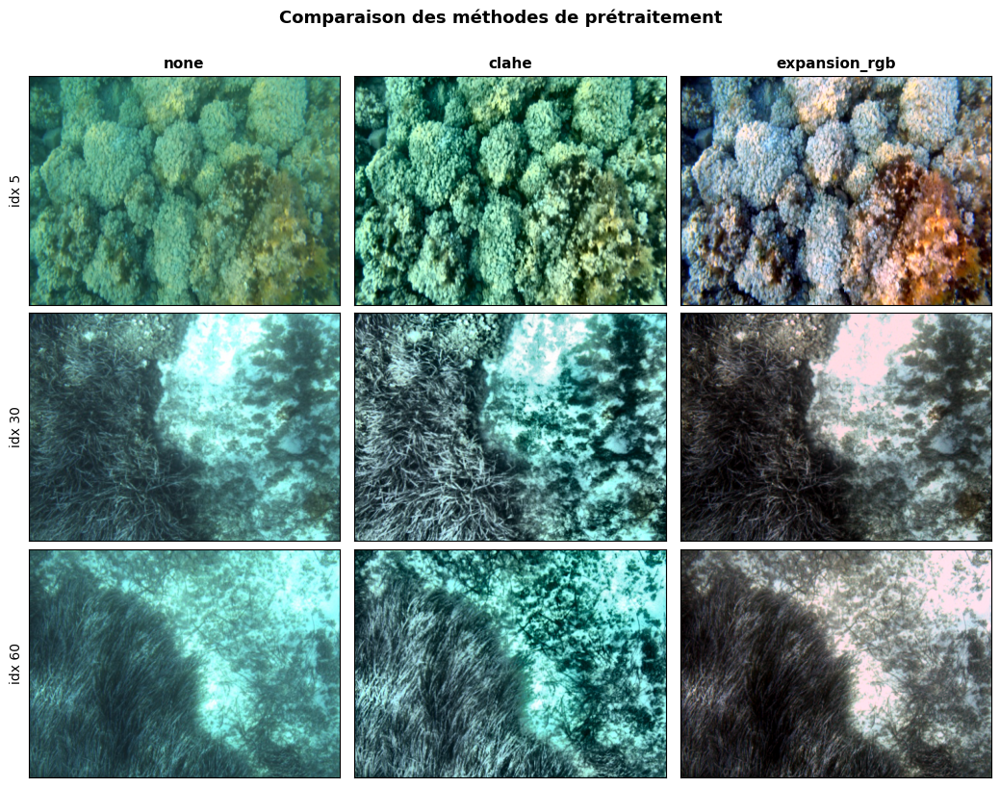

In [18]:
# === VISUALISATION DES MÉTHODES DE PRÉTRAITEMENT ===

def visualize_preprocessing_comparison(dataset, image_indices=None, n_samples=4):
    """
    Affiche une grille comparative des méthodes de prétraitement disponibles
    dans le registry.

    Args:
        dataset : dataset à utiliser (sans prétraitement)
        image_indices : liste d'indices d'images à visualiser. Si None, sélection auto.
        n_samples : nombre d'images si image_indices=None
    """
    if image_indices is None:
        image_indices = np.linspace(0, len(dataset) - 1, n_samples).astype(int)

    methods = list(PREPROCESS_REGISTRY.keys())
    n_methods = len(methods)
    n_images = len(image_indices)

    fig, axes = plt.subplots(n_images, n_methods,
                              figsize=(n_methods * 3.5, n_images * 2.7))

    if n_images == 1:
        axes = axes.reshape(1, -1)

    for row, idx in enumerate(image_indices):
        # Récupérer l'image RAW (sans prétraitement) via le dataset
        img_tensor, _ = dataset[idx]
        img_pil = transforms.functional.to_pil_image(img_tensor)

        for col, method in enumerate(methods):
            img_processed = apply_preprocess(img_pil, method)
            axes[row, col].imshow(np.array(img_processed))
            if row == 0:
                axes[row, col].set_title(method, fontsize=11, fontweight='bold')
            axes[row, col].set_xticks([])
            axes[row, col].set_yticks([])
            if col == 0:
                axes[row, col].set_ylabel(f"idx {idx}", fontsize=10)

    plt.suptitle("Comparaison des méthodes de prétraitement",
                  fontsize=13, fontweight='bold', y=1.005)
    plt.tight_layout()
    plt.show()


# Charger un dataset SANS prétraitement pour la visualisation
viz_ds = PosidoniaDatasetFromCSV(
    csv_path=VAL_CSV,
    root_path=LOCAL_PATH,
    split="training",
    augment=False,
    preprocess=None,
)

# Visualiser sur 3 images variées (faible/moyenne/forte couverture)
visualize_preprocessing_comparison(viz_ds, image_indices=[5, 30, 60])

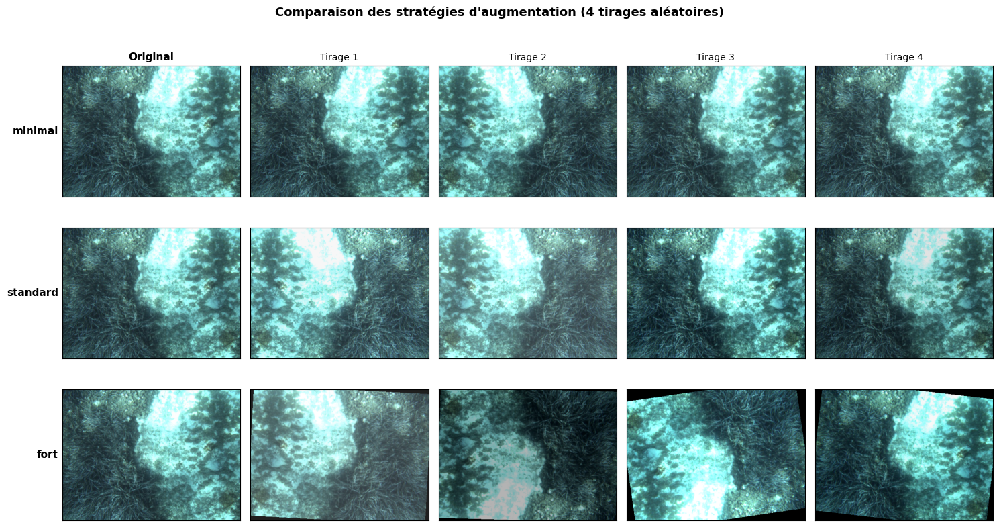

In [19]:
# === VISUALISATION DES STRATÉGIES D'AUGMENTATION ===

def visualize_augmentation_strategies(dataset, img_idx=0, n_examples=4):
    """
    Affiche l'effet de chaque stratégie d'augmentation sur une même image.
    Plusieurs tirages pour montrer la variabilité de l'augmentation.

    Args:
        dataset : dataset source (sans augmentation)
        img_idx : index de l'image à utiliser
        n_examples : nombre d'exemples par stratégie
    """
    strategies = list(AUG_STRATEGIES.keys())
    n_strategies = len(strategies)

    # +1 pour la colonne "original"
    fig, axes = plt.subplots(n_strategies, n_examples + 1,
                              figsize=((n_examples + 1) * 3, n_strategies * 2.7))

    # Image originale
    img_tensor, mask_tensor = dataset[img_idx]
    img_original_pil = transforms.functional.to_pil_image(img_tensor)
    mask_original_pil = Image.fromarray((mask_tensor.numpy() * 255).astype(np.uint8))

    for row, strategy in enumerate(strategies):
        # Colonne 0 : original
        axes[row, 0].imshow(np.array(img_original_pil))
        if row == 0:
            axes[row, 0].set_title("Original", fontsize=11, fontweight='bold')
        axes[row, 0].set_ylabel(strategy, fontsize=11, fontweight='bold', rotation=0,
                                  ha='right', va='center')
        axes[row, 0].set_xticks([])
        axes[row, 0].set_yticks([])

        # Colonnes suivantes : augmentations
        for col in range(1, n_examples + 1):
            img_aug, _ = apply_augmentation(img_original_pil, mask_original_pil,
                                              strategy=strategy)
            axes[row, col].imshow(np.array(img_aug))
            if row == 0:
                axes[row, col].set_title(f"Tirage {col}", fontsize=10)
            axes[row, col].set_xticks([])
            axes[row, col].set_yticks([])

    plt.suptitle("Comparaison des stratégies d'augmentation (4 tirages aléatoires)",
                  fontsize=13, fontweight='bold', y=1.005)
    plt.tight_layout()
    plt.show()


# Visualiser sur une image variée
visualize_augmentation_strategies(viz_ds, img_idx=30, n_examples=4)

## 2.7 Test rapide d'une combinaison

Chargeons un dataset avec une **vraie combinaison** (augmentation + prétraitement)
pour vérifier que tout fonctionne ensemble.

  [training/CSV] preprocess=None, aug=False, images=300
  [training/CSV] preprocess=clahe, aug='standard', images=300
  [training/CSV] preprocess=expansion_rgb, aug='standard', images=300

=== Visualisation des combinaisons aug + prétraitement ===
Image testée : index 0 du training set



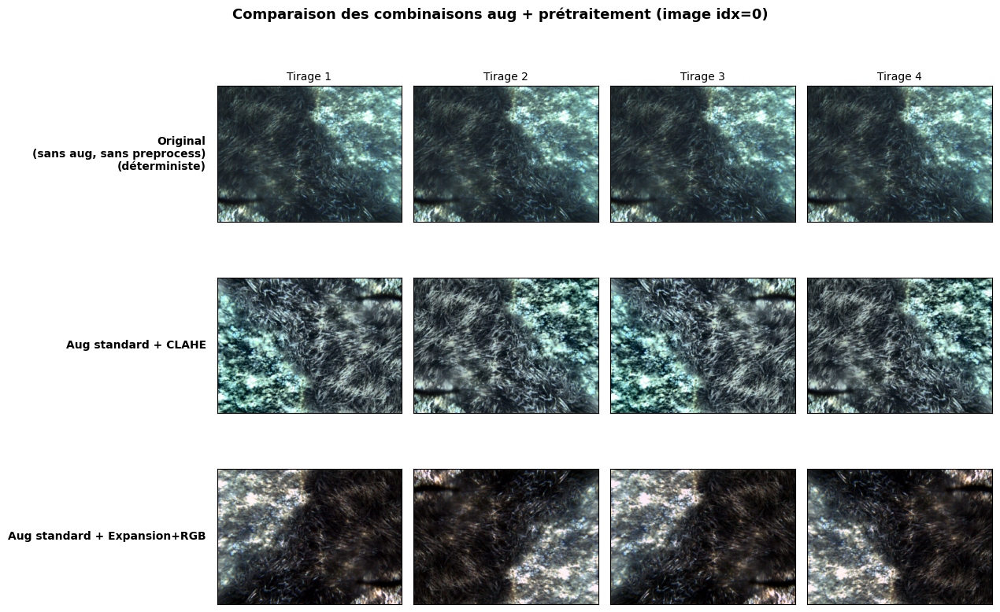


=== Observations attendues ===
   Original : 4 tirages identiques (déterministe, sans aug)
   Aug + CLAHE : variabilité (flips/jitter) + contraste local rehaussé
   Aug + Expansion+RGB : variabilité (flips/jitter) + dominante bleue supprimée

 Les deux combinaisons fonctionnent correctement

=== Section 2 terminée ===


In [20]:
# === TEST DES DEUX COMBINAISONS AUG + PRÉTRAITEMENT ===

TEST_IDX = 0  # index de l'image à utiliser

# Dataset SANS aug ni preprocess (pour l'image originale)
ds_original = PosidoniaDatasetFromCSV(
    csv_path=TRAIN_CSV,
    root_path=LOCAL_PATH,
    split="training",
    augment=False,
    preprocess=None,
)

# Combinaison 1 : aug standard + CLAHE
ds_combo_clahe = PosidoniaDatasetFromCSV(
    csv_path=TRAIN_CSV,
    root_path=LOCAL_PATH,
    split="training",
    augment=True,
    aug_strategy="standard",
    preprocess="clahe",
)

# Combinaison 2 : aug standard + Expansion+RGB
ds_combo_expansion = PosidoniaDatasetFromCSV(
    csv_path=TRAIN_CSV,
    root_path=LOCAL_PATH,
    split="training",
    augment=True,
    aug_strategy="standard",
    preprocess="expansion_rgb",
)

print(f"\n=== Visualisation des combinaisons aug + prétraitement ===")
print(f"Image testée : index {TEST_IDX} du training set\n")

# === Visualisation en grille 3 lignes × 4 colonnes ===
N_TIRAGES = 4

configurations = [
    ("Original\n(sans aug, sans preprocess)", ds_original,         False),
    ("Aug standard + CLAHE",                   ds_combo_clahe,      True),
    ("Aug standard + Expansion+RGB",            ds_combo_expansion,  True),
]

n_rows = len(configurations)
fig, axes = plt.subplots(n_rows, N_TIRAGES, figsize=(N_TIRAGES * 3.2, n_rows * 2.7))

for row, (title, ds, is_stochastic) in enumerate(configurations):
    for col in range(N_TIRAGES):
        img, mask = ds[TEST_IDX]
        img_np = img.permute(1, 2, 0).numpy()
        axes[row, col].imshow(img_np)

        # Titre uniquement sur la première ligne
        if row == 0:
            axes[row, col].set_title(f"Tirage {col + 1}", fontsize=10)

        # Étiquette à gauche (uniquement colonne 0)
        if col == 0:
            label_suffix = "" if is_stochastic else "\n(déterministe)"
            axes[row, col].set_ylabel(title + label_suffix, fontsize=10,
                                        rotation=0, ha='right', va='center',
                                        labelpad=10, fontweight='bold')

        axes[row, col].set_xticks([])
        axes[row, col].set_yticks([])

plt.suptitle(f"Comparaison des combinaisons aug + prétraitement (image idx={TEST_IDX})",
              fontsize=13, fontweight='bold', y=1.005)
plt.tight_layout()
plt.show()

print("\n=== Observations attendues ===")
print("   Original : 4 tirages identiques (déterministe, sans aug)")
print("   Aug + CLAHE : variabilité (flips/jitter) + contraste local rehaussé")
print("   Aug + Expansion+RGB : variabilité (flips/jitter) + dominante bleue supprimée")
print("\n Les deux combinaisons fonctionnent correctement")
print("\n=== Section 2 terminée ===")

# 3. Architecture U-Net

## 3.1 Théorie et intuition

**U-Net** est une architecture de réseau de neurones convolutionnels proposée
par Ronneberger, Fischer et Brox en 2015 pour la segmentation d'images biomédicales.

### Pourquoi U-Net pour la segmentation ?

Le défi de la segmentation est double :
1. **Compréhension globale** : reconnaître *quoi* est dans l'image (contexte, objets)
2. **Localisation précise** : déterminer *où exactement* chaque pixel appartient

Un réseau classique (type VGG, ResNet) excelle pour la classification (quoi),
mais perd la résolution spatiale au fil des couches (où). U-Net résout ce problème
avec une architecture **encodeur-décodeur** en forme de U :


### Les trois composants clés

**1. L'encodeur (chemin descendant)**
   - Compresse progressivement l'image (réduit la résolution)
   - Augmente le nombre de canaux (extrait des caractéristiques riches)
   - Permet au modèle de comprendre le contexte global

**2. Le décodeur (chemin remontant)**
   - Reconstruit progressivement la résolution
   - Réduit le nombre de canaux
   - Produit le masque de segmentation final

**3. Les skip connections (le secret de U-Net)**
   - Connectent l'encodeur au décodeur **à chaque niveau**
   - Préservent les détails spatiaux fins qui auraient été perdus
   - C'est ce qui fait que U-Net donne des segmentations **précises au pixel près**

### Notre implémentation

On va construire U-Net **depuis zéro** pour bien comprendre chaque composant.

**Caractéristiques de notre version** :
- 4 niveaux d'encodage (résolution divisée par 2 à chaque niveau)
- 4 niveaux de décodage symétriques
- 64 canaux au premier niveau, doublés à chaque descente (64 -> 128 -> 256 -> 512)
- 1024 canaux au bottleneck (le bas du U)
- Sortie : 2 canaux (probabilités fond / posidonie)

**Référence** : Ronneberger, O., Fischer, P., Brox, T. (2015).
*U-Net: Convolutional Networks for Biomedical Image Segmentation.* MICCAI.

## 3.2 Bloc de base : DoubleConv

Le composant **récurrent** dans U-Net est le bloc "double convolution" :

**Pourquoi deux convolutions successives ?**
- Une seule convolution 3×3 a un champ réceptif de 3×3 pixels
- Deux convolutions 3×3 successives : champ réceptif de 5×5 pixels
- Mais avec moins de paramètres qu'une seule convolution 5×5
- Permet d'extraire des caractéristiques plus complexes localement

**Pourquoi Batch Normalization (BN) ?**
- Stabilise l'entraînement
- Permet d'utiliser des learning rates plus grands
- Réduit la sensibilité à l'initialisation

**Pourquoi ReLU ?**
- Non-linéarité (sans elle, on n'aurait qu'une fonction linéaire)
- Calcul rapide (max(0, x))
- Évite le problème de "vanishing gradient" des sigmoid/tanh

In [21]:
# === BLOC DE BASE : DOUBLE CONVOLUTION ===

class DoubleConv(nn.Module):
    """
    Bloc de double convolution : (Conv → BN → ReLU) × 2

    Structure pédagogique standard de U-Net (Ronneberger 2015).

    Args:
        in_channels : nombre de canaux d'entrée
        out_channels : nombre de canaux de sortie
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            # Première convolution
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            # Deuxième convolution
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.double_conv(x)


# Test : créer un DoubleConv et vérifier les dimensions
print("=== Test DoubleConv ===")
test_block = DoubleConv(in_channels=3, out_channels=64)
test_input = torch.randn(2, 3, 352, 480)  # batch=2, RGB, 352×480
test_output = test_block(test_input)
print(f"  Entrée : {test_input.shape}")
print(f"  Sortie : {test_output.shape}")
print(f"  Attendu : torch.Size([2, 64, 352, 480])")
print(f"  DoubleConv opérationnel")

# Compter les paramètres
n_params = sum(p.numel() for p in test_block.parameters())
print(f"\n  Nombre de paramètres : {n_params:,}")

=== Test DoubleConv ===
  Entrée : torch.Size([2, 3, 352, 480])
  Sortie : torch.Size([2, 64, 352, 480])
  Attendu : torch.Size([2, 64, 352, 480])
  DoubleConv opérationnel

  Nombre de paramètres : 38,976


## 3.3 Blocs d'encodage (Down) et de décodage (Up)

### Bloc Down (encodeur)
- Le MaxPool divise la résolution par 2
- DoubleConv double le nombre de canaux

### Bloc Up (décodeur)
- L'upsample multiplie la résolution par 2
- On **concatène** avec la skip connection (pas une addition !)
- DoubleConv réduit le nombre de canaux à la sortie

**Pourquoi concatener et pas additionner ?**
- L'addition mélange les informations (perte)
- La concaténation préserve les deux flux : encodeur **et** décodeur
- Le DoubleConv qui suit apprend à les combiner intelligemment

In [22]:
# === BLOC D'ENCODAGE : DOWN ===

class Down(nn.Module):
    """
    Bloc d'encodage : MaxPool puis DoubleConv.

    Réduit la résolution spatiale par 2 et applique une double convolution.
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(kernel_size=2),
            DoubleConv(in_channels, out_channels),
        )

    def forward(self, x):
        return self.maxpool_conv(x)


# === BLOC DE DÉCODAGE : UP ===

class Up(nn.Module):
    """
    Bloc de décodage : Upsample, concaténation avec skip, puis DoubleConv.

    Args:
        in_channels : nombre de canaux d'entrée (avant concaténation)
        out_channels : nombre de canaux de sortie
        use_transpose : si True, utilise ConvTranspose2d (apprenable)
                        sinon, utilise un upsample bilinéaire (plus léger)
    """
    def __init__(self, in_channels, out_channels, use_transpose=True):
        super().__init__()

        if use_transpose:
            # Convolution transposée (apprenable, plus de paramètres)
            self.up = nn.ConvTranspose2d(
                in_channels, in_channels // 2,
                kernel_size=2, stride=2
            )
            self.conv = DoubleConv(in_channels, out_channels)
        else:
            # Upsample bilinéaire (pas d'apprentissage, plus léger)
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels + in_channels // 2, out_channels)

    def forward(self, x_decoder, x_skip):
        """
        Args:
            x_decoder : tenseur du décodeur (à upsampler)
            x_skip : tenseur de la skip connection (depuis l'encodeur)
        """
        # Upsampling
        x_decoder = self.up(x_decoder)

        # Si les dimensions ne matchent pas exactement (peut arriver à cause des arrondis), on pad
        diff_y = x_skip.size(2) - x_decoder.size(2)
        diff_x = x_skip.size(3) - x_decoder.size(3)
        x_decoder = F.pad(x_decoder, [diff_x // 2, diff_x - diff_x // 2,
                                        diff_y // 2, diff_y - diff_y // 2])

        # Concaténation des canaux (le secret de U-Net)
        x = torch.cat([x_skip, x_decoder], dim=1)

        # Double convolution
        return self.conv(x)


# Test des deux blocs
print("=== Test Down ===")
down = Down(64, 128)
x = torch.randn(2, 64, 352, 480)
y = down(x)
print(f"  Entrée : {x.shape}")
print(f"  Sortie : {y.shape} (attendu : [2, 128, 176, 240])")

print("\n=== Test Up ===")
up = Up(256, 128)
x_decoder = torch.randn(2, 256, 88, 120)  # depuis le bas du U
x_skip = torch.randn(2, 128, 176, 240)     # depuis l'encodeur (même niveau)
y = up(x_decoder, x_skip)
print(f"  x_decoder : {x_decoder.shape}")
print(f"  x_skip    : {x_skip.shape}")
print(f"  Sortie    : {y.shape} (attendu : [2, 128, 176, 240])")
print("\n Blocs Down et Up opérationnels")

=== Test Down ===
  Entrée : torch.Size([2, 64, 352, 480])
  Sortie : torch.Size([2, 128, 176, 240]) (attendu : [2, 128, 176, 240])

=== Test Up ===
  x_decoder : torch.Size([2, 256, 88, 120])
  x_skip    : torch.Size([2, 128, 176, 240])
  Sortie    : torch.Size([2, 128, 176, 240]) (attendu : [2, 128, 176, 240])

 Blocs Down et Up opérationnels


## 3.4 Architecture U-Net complète

Maintenant qu'on a les briques de base, on assemble l'architecture complète.

### Structure détaillée (pour image 352x480)



In [23]:
# === U-NET COMPLET ===

class UNet(nn.Module):
    """
    Architecture U-Net pour segmentation sémantique.

    Args:
        in_channels : nombre de canaux d'entrée (3 pour RGB)
        n_classes : nombre de classes de sortie (2 pour binaire fond/posidonie)
        base_channels : nombre de canaux au premier niveau (default 64)
        use_transpose : si True, utilise ConvTranspose2d pour l'upsampling

    Référence : Ronneberger, Fischer, Brox (2015).
    """
    def __init__(self, in_channels=3, n_classes=2, base_channels=64, use_transpose=True):
        super().__init__()

        self.in_channels = in_channels
        self.n_classes = n_classes
        self.base_channels = base_channels

        # === ENCODEUR ===
        self.enc1 = DoubleConv(in_channels, base_channels)         # 3 -> 64
        self.enc2 = Down(base_channels, base_channels * 2)          # 64 -> 128
        self.enc3 = Down(base_channels * 2, base_channels * 4)      # 128 -> 256
        self.enc4 = Down(base_channels * 4, base_channels * 8)      # 256 -> 512

        # === BOTTLENECK ===
        self.bottleneck = Down(base_channels * 8, base_channels * 16)  # 512 -> 1024

        # === DÉCODEUR ===
        self.dec4 = Up(base_channels * 16, base_channels * 8, use_transpose)  # 1024 -> 512
        self.dec3 = Up(base_channels * 8,  base_channels * 4, use_transpose)  # 512 -> 256
        self.dec2 = Up(base_channels * 4,  base_channels * 2, use_transpose)  # 256 -> 128
        self.dec1 = Up(base_channels * 2,  base_channels,     use_transpose)  # 128 -> 64

        # === SORTIE ===
        self.out_conv = nn.Conv2d(base_channels, n_classes, kernel_size=1)

    def forward(self, x):
        # Encodeur
        e1 = self.enc1(x)        #  64 × H × W
        e2 = self.enc2(e1)       # 128 × H/2 × W/2
        e3 = self.enc3(e2)       # 256 × H/4 × W/4
        e4 = self.enc4(e3)       # 512 × H/8 × W/8

        # Bottleneck
        b = self.bottleneck(e4)  # 1024 × H/16 × W/16

        # Décodeur (avec skip connections)
        d4 = self.dec4(b, e4)    # 512 × H/8 × W/8
        d3 = self.dec3(d4, e3)   # 256 × H/4 × W/4
        d2 = self.dec2(d3, e2)   # 128 × H/2 × W/2
        d1 = self.dec1(d2, e1)   #  64 × H × W

        # Sortie
        logits = self.out_conv(d1)  # n_classes × H × W

        return logits


# Test global de l'architecture
print("=== Test U-Net complet ===\n")
model = UNet(in_channels=3, n_classes=N_CLASSES, base_channels=64)
n_params = sum(p.numel() for p in model.parameters())
n_trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"  Nombre total de paramètres : {n_params:,}")
print(f"  Nombre de paramètres entraînables : {n_trainable:,}")

# Test forward pass
x = torch.randn(2, 3, IMG_H, IMG_W)
print(f"\n  Entrée  : {x.shape}")
y = model(x)
print(f"  Sortie  : {y.shape} (attendu : [2, {N_CLASSES}, {IMG_H}, {IMG_W}])")

# Vérification que la sortie est cohérente
assert y.shape == (2, N_CLASSES, IMG_H, IMG_W), "Dimensions de sortie incorrectes !"
print(f"\n U-Net opérationnel")

=== Test U-Net complet ===

  Nombre total de paramètres : 31,043,586
  Nombre de paramètres entraînables : 31,043,586

  Entrée  : torch.Size([2, 3, 352, 480])
  Sortie  : torch.Size([2, 2, 352, 480]) (attendu : [2, 2, 352, 480])

 U-Net opérationnel


## 3.5 Vérification avec un batch réel du dataset

Maintenant qu'on a notre U-Net, vérifions qu'il fonctionne avec **les vraies données**
du dataset (pas seulement avec des tenseurs aléatoires).

Cette étape **valide** que :
1. Le modèle accepte bien la sortie du DataLoader
2. Les dimensions sont cohérentes
3. La sortie est dans le bon format pour calculer la loss

In [26]:
# === TEST AVEC UN BATCH RÉEL ===

# Créer un dataset et un DataLoader
ds_test = PosidoniaDatasetFromCSV(
    csv_path=TRAIN_CSV,
    root_path=LOCAL_PATH,
    split="training",
    augment=False,
    preprocess=None,
)

loader_test = DataLoader(ds_test, batch_size=BATCH_SIZE, shuffle=False)

# Récupérer un batch
batch_images, batch_masks = next(iter(loader_test))

print(f"=== Batch réel ===")
print(f"  Batch images : {batch_images.shape}")
print(f"  Batch masks  : {batch_masks.shape}")
print(f"  Image dtype  : {batch_images.dtype}")
print(f"  Mask dtype   : {batch_masks.dtype}")
print(f"  Mask uniques : {torch.unique(batch_masks).tolist()}")

# Passer le batch dans le modèle
model = UNet(in_channels=3, n_classes=N_CLASSES, base_channels=64).to(DEVICE)
model.eval()  # mode évaluation (désactive dropout, etc.)

with torch.no_grad():
    batch_images_gpu = batch_images.to(DEVICE)
    logits = model(batch_images_gpu)

print(f"\n=== Sortie du modèle ===")
print(f"  Logits shape : {logits.shape}")
print(f"  Logits range : [{logits.min().item():.3f}, {logits.max().item():.3f}]")

# Obtenir les probabilités (softmax) et les prédictions (argmax)
probas = F.softmax(logits, dim=1)
predictions = logits.argmax(dim=1)

print(f"\n=== Probabilités et prédictions ===")
print(f"  Probas shape : {probas.shape}")
print(f"  Probas range : [{probas.min().item():.4f}, {probas.max().item():.4f}]")
print(f"  Predictions shape  : {predictions.shape}")
print(f"  Predictions uniques: {torch.unique(predictions).tolist()}")

# Calcul de la mémoire GPU utilisée (si CUDA)
if torch.cuda.is_available():
    mem_used = torch.cuda.memory_allocated() / 1e6
    print(f"\n  Mémoire GPU utilisée : {mem_used:.1f} MB")

print(f"\n U-Net fonctionne sur un batch réel")

  [training/CSV] preprocess=None, aug=False, images=300
=== Batch réel ===
  Batch images : torch.Size([8, 3, 352, 480])
  Batch masks  : torch.Size([8, 352, 480])
  Image dtype  : torch.float32
  Mask dtype   : torch.int64
  Mask uniques : [0, 1]

=== Sortie du modèle ===
  Logits shape : torch.Size([8, 2, 352, 480])
  Logits range : [0.081, 0.122]

=== Probabilités et prédictions ===
  Probas shape : torch.Size([8, 2, 352, 480])
  Probas range : [0.4917, 0.5083]
  Predictions shape  : torch.Size([8, 352, 480])
  Predictions uniques: [1]

  Mémoire GPU utilisée : 175.4 MB

 U-Net fonctionne sur un batch réel


## 3.6 Visualisation des prédictions (modèle non entraîné)

Avant l'entraînement, le modèle a des **poids aléatoires**. Ses prédictions seront
donc essentiellement du bruit. Mais c'est intéressant de visualiser pour :
1. **Confirmer** que le modèle produit des sorties de bonne forme
2. **Avoir une référence** pour comparer avec les prédictions après entraînement
3. **Vérifier** la chaîne complète : image -> modèle -> prédiction -> visualisation

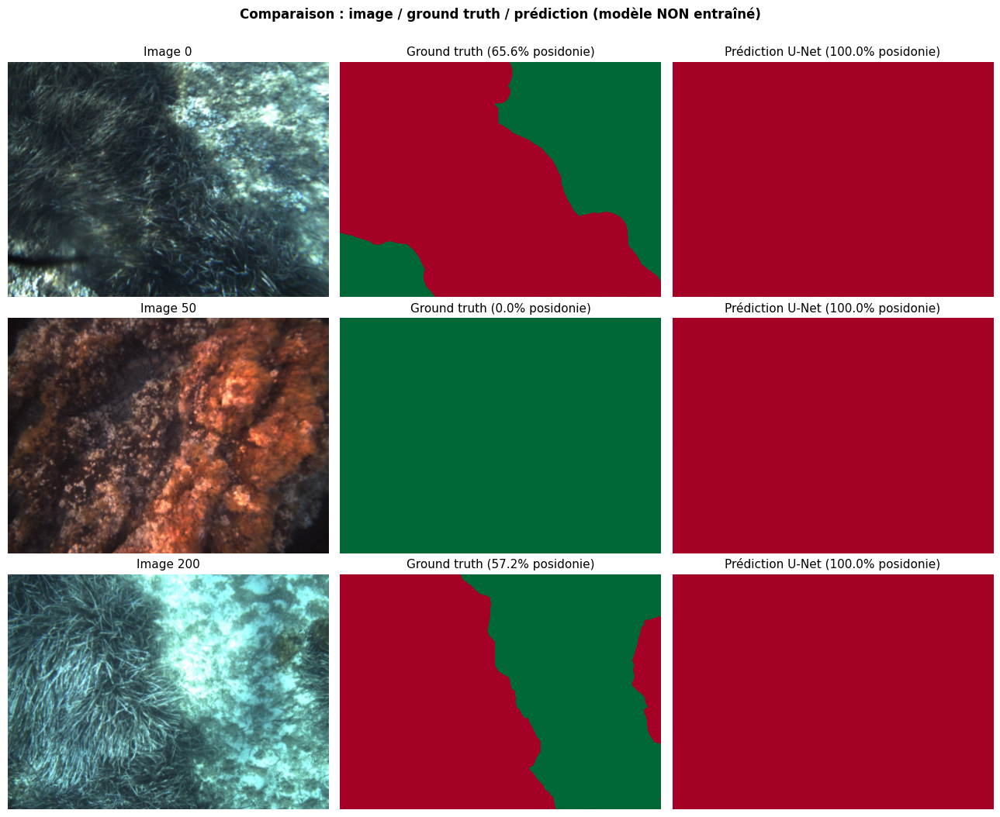


=== Note ===
Les prédictions sont aléatoires (modèle non entraîné).
Après entraînement, les prédictions devraient ressembler aux ground truth.


In [27]:
# === VISUALISATION : MODÈLE NON ENTRAÎNÉ ===

def visualize_predictions(model, dataset, indices=None, n_samples=3, device=DEVICE):
    """
    Affiche : image originale, masque ground truth, prédiction du modèle.

    Args:
        model : modèle PyTorch (en mode eval)
        dataset : dataset source
        indices : liste d'indices à visualiser (si None, sélection auto)
        n_samples : nombre d'échantillons à afficher
        device : device pour l'inférence
    """
    if indices is None:
        indices = np.linspace(0, len(dataset) - 1, n_samples).astype(int)

    model.eval()
    fig, axes = plt.subplots(len(indices), 3, figsize=(13, len(indices) * 3.5))

    if len(indices) == 1:
        axes = axes.reshape(1, -1)

    with torch.no_grad():
        for row, idx in enumerate(indices):
            img, mask = dataset[idx]

            # Prédiction
            img_batch = img.unsqueeze(0).to(device)
            logits = model(img_batch)
            pred = logits.argmax(dim=1).squeeze(0).cpu().numpy()

            # Image originale
            axes[row, 0].imshow(img.permute(1, 2, 0).numpy())
            axes[row, 0].set_title(f"Image {idx}", fontsize=11)
            axes[row, 0].axis('off')

            # Masque ground truth
            axes[row, 1].imshow(mask.numpy(), cmap='RdYlGn_r', vmin=0, vmax=1)
            axes[row, 1].set_title(f"Ground truth ({mask.float().mean()*100:.1f}% posidonie)",
                                     fontsize=11)
            axes[row, 1].axis('off')

            # Prédiction
            axes[row, 2].imshow(pred, cmap='RdYlGn_r', vmin=0, vmax=1)
            axes[row, 2].set_title(f"Prédiction U-Net ({pred.mean()*100:.1f}% posidonie)",
                                     fontsize=11)
            axes[row, 2].axis('off')

    plt.suptitle("Comparaison : image / ground truth / prédiction (modèle NON entraîné)",
                  fontsize=12, fontweight='bold', y=1.005)
    plt.tight_layout()
    plt.show()


# Visualiser quelques prédictions avant entraînement
visualize_predictions(model, ds_test, indices=[0, 50, 200])

print("\n=== Note ===")
print("Les prédictions sont aléatoires (modèle non entraîné).")
print("Après entraînement, les prédictions devraient ressembler aux ground truth.")

## 3.7 Résumé de l'architecture

| Composant | Entrée | Sortie | Paramètres |
|---|---|---|---|
| enc1 (DoubleConv) | 3 x 352 x 480 | 64 x 352 x 480 | ~38K |
| enc2 (Down) | 64 x 352 x 480 | 128 x 176 x 240 | ~221K |
| enc3 (Down) | 128 x 176 x 240 | 256 x 88 x 120 | ~885K |
| enc4 (Down) | 256 x 88 x 120 | 512 x 44 x 60 | ~3.5M |
| bottleneck (Down) | 512 x 44 x 60 | 1024 x 22 x 30 | ~14.1M |
| dec4 (Up) | 1024 x 22 x 30 + skip e4 | 512 x 44 x 60 | ~6.8M |
| dec3 (Up) | 512 x 44 x 60 + skip e3 | 256 x 88 x 120 | ~1.7M |
| dec2 (Up) | 256 x 88 x 120 + skip e2 | 128 x 176 x 240 | ~426K |
| dec1 (Up) | 128 x 176 x 240 + skip e1 | 64 x 352 x 480 | ~107K |
| out_conv (1x1) | 64 x 352 x 480 | 2 x 352 x 480 | 130 |
| **TOTAL** | | | **~31M** |

### Comparaison avec SegFormer-B0

| Architecture | Paramètres | Type |
|---|---|---|
| SegFormer-B0 | 3.7M | Transformer hiérarchique |
| **U-Net (cette implém.)** | **~31M** | CNN encodeur-décodeur classique |
| FCN-VGG16 | ~134M | CNN avec encodeur VGG16 préentraîné |

U-Net a un nombre intermédiaire de paramètres mais une architecture plus simple
que SegFormer. C'est un bon **point de référence** pour la comparaison.

---

**Section 3 terminée !** Architecture U-Net :
-  Implémentée depuis zéro avec briques modulaires (DoubleConv, Down, Up)
-  Forward pass vérifié sur batch synthétique et réel
-  Prédictions visualisées (avant entraînement)

Prochaine étape (Section 4) : définir les fonctions de perte (CE, CE+Dice, CE+SEMEDA).

# 4. Fonctions de perte

## 4.1 Théorie : pourquoi varier la fonction de perte ?

La **fonction de perte** (loss) mesure l'écart entre les prédictions du modèle
et la vérité terrain. C'est ce que l'algorithme d'optimisation cherche à
**minimiser** pendant l'entraînement.

### Trois philosophies différentes pour la segmentation binaire

| Loss | Philosophie | Niveau d'opération |
|---|---|---|
| **CrossEntropy (CE)** | "Chaque pixel doit être bien classé" | Pixel par pixel |
| **CE + Dice** | "L'ensemble de la région doit bien se recouvrir" | Région globale |
| **CE + SEMEDA** | "Les structures sémantiques doivent être cohérentes" | Structure |

### Intuition

Considérons deux prédictions A et B sur une image de posidonie :

- **Prédiction A** : 95% des pixels bien classés, mais avec des "trous" dans les zones de posidonie
- **Prédiction B** : 93% des pixels bien classés, mais segmentation cohérente sans trous

-> La CE seule pourrait préférer A (plus de pixels corrects)

-> Le Dice pénalise A (mauvais recouvrement régional)

-> SEMEDA pénalise A (incohérence structurelle)

**On va implémenter et tester les 3** pour identifier laquelle est la plus adaptée
à la segmentation de Posidonia oceanica.

### Format des prédictions

Le modèle U-Net produit des **logits** de shape `[B, 2, H, W]` :
- Canal 0 : score pour la classe "fond"
- Canal 1 : score pour la classe "posidonie"

On applique `softmax` pour obtenir des probabilités dans [0, 1].

## 4.2 Cross Entropy (CE) - la baseline

### Formule

Pour la classification binaire pixel à pixel :

$$L_{CE} = -\frac{1}{N} \sum_{i=1}^{N} \big[ y_i \log(p_i) + (1 - y_i) \log(1 - p_i) \big]$$

où :
- $N$ = nombre total de pixels
- $y_i$ = label réel du pixel $i$ (0 ou 1)
- $p_i$ = probabilité prédite que le pixel $i$ soit de la classe 1

### Avantages
- Standard, bien comprise, bien implémentée dans tous les frameworks
- Optimisation stable (gradients bien conditionnés)
- Bon baseline de comparaison

### Limitation
- Traite chaque pixel **indépendamment** (pas de notion de région)
- Peut surapprendre les **petites zones** sans pénaliser les "trous"

In [24]:
# === CROSS ENTROPY (BASELINE) ===
# nn.CrossEntropyLoss est déjà parfaitement implémentée par PyTorch
# Pas besoin de réimplémenter, on l'utilisera directement

print("=== Cross Entropy Loss (CE) ===")
print("Implémentation : nn.CrossEntropyLoss (standard PyTorch)")
print("Utilisation : ce_loss = nn.CrossEntropyLoss()")
print("                loss = ce_loss(logits, targets)")
print()
print("  - logits : tenseur [B, C, H, W] (sorties brutes du modèle)")
print("  - targets : tenseur [B, H, W] (labels int dans [0, C-1])")
print()

# Test rapide
ce_loss = nn.CrossEntropyLoss()
fake_logits = torch.randn(2, 2, 32, 32)  # batch=2, C=2, 32x32
fake_targets = torch.randint(0, 2, (2, 32, 32))
loss_value = ce_loss(fake_logits, fake_targets)
print(f"  Test : loss = {loss_value.item():.4f}")
print(f"  Cross Entropy opérationnelle")

=== Cross Entropy Loss (CE) ===
Implémentation : nn.CrossEntropyLoss (standard PyTorch)
Utilisation : ce_loss = nn.CrossEntropyLoss()
                loss = ce_loss(logits, targets)

  - logits : tenseur [B, C, H, W] (sorties brutes du modèle)
  - targets : tenseur [B, H, W] (labels int dans [0, C-1])

  Test : loss = 0.9083
  Cross Entropy opérationnelle


## 4.3 CE + Dice (CombinedLoss)

### Dice Loss

Le coefficient de Dice mesure le **recouvrement** entre deux ensembles :

$$\text{Dice} = \frac{2 \cdot |P \cap G|}{|P| + |G|}$$

où $P$ = pixels prédits posidonie, $G$ = pixels réels posidonie.

-> Dice = 1 si recouvrement parfait, 0 si aucun recouvrement.

### Dice Loss (à minimiser)

$$L_{Dice} = 1 - \text{Dice}$$

### Combined Loss

On **combine** CE et Dice avec un poids λ :

$$L = L_{CE} + \lambda \cdot L_{Dice}$$

avec λ = 0.5 (équilibre standard).

### Pourquoi combiner ?
- CE optimise la **classification pixel par pixel**
- Dice optimise le **recouvrement régional**
- Combinés : permet de gérer les deux cas de figure

In [25]:
# === COMBINED LOSS : CE + DICE ===

class DiceLoss(nn.Module):
    """
    Dice loss pour segmentation binaire ou multi-classes.

    Args:
        smooth : terme de lissage pour éviter division par zéro
        ignore_index : indice à ignorer (par exemple pour padding)
    """
    def __init__(self, smooth=1e-6, ignore_index=None):
        super().__init__()
        self.smooth = smooth
        self.ignore_index = ignore_index

    def forward(self, logits, targets):
        """
        Args:
            logits : [B, C, H, W] - sorties brutes du modèle
            targets : [B, H, W] - labels int dans [0, C-1]

        Returns:
            scalar tensor : 1 - Dice moyen sur les classes (sans le fond)
        """
        n_classes = logits.shape[1]

        # Softmax pour obtenir des probabilités
        probas = F.softmax(logits, dim=1)

        # One-hot encoding des targets
        targets_one_hot = F.one_hot(targets, num_classes=n_classes)
        targets_one_hot = targets_one_hot.permute(0, 3, 1, 2).float()  # [B, C, H, W]

        # Calcul du Dice par classe
        intersection = (probas * targets_one_hot).sum(dim=(0, 2, 3))
        union = probas.sum(dim=(0, 2, 3)) + targets_one_hot.sum(dim=(0, 2, 3))
        dice_per_class = (2.0 * intersection + self.smooth) / (union + self.smooth)

        # On ne pénalise que les classes "objet" (pas le fond)
        # Pour notre cas binaire : classe 0 = fond, classe 1 = posidonie
        dice = dice_per_class[1:].mean()  # moyenne sur les classes non-fond

        return 1.0 - dice


class CombinedLoss(nn.Module):
    """
    Combinaison CE + λ × Dice.

    Args:
        lambda_dice : poids du terme Dice (default 0.5)
    """
    def __init__(self, lambda_dice=0.5):
        super().__init__()
        self.ce = nn.CrossEntropyLoss()
        self.dice = DiceLoss()
        self.lambda_dice = lambda_dice

    def forward(self, logits, targets):
        ce_loss = self.ce(logits, targets)
        dice_loss = self.dice(logits, targets)
        return ce_loss + self.lambda_dice * dice_loss


# Test
print("=== Combined Loss (CE + Dice) ===")
combined = CombinedLoss(lambda_dice=0.5)
fake_logits = torch.randn(2, 2, 32, 32)
fake_targets = torch.randint(0, 2, (2, 32, 32))
loss_value = combined(fake_logits, fake_targets)
print(f"  Test : loss = {loss_value.item():.4f}")

# Décomposition
ce_only = combined.ce(fake_logits, fake_targets)
dice_only = combined.dice(fake_logits, fake_targets)
print(f"  Détail : CE = {ce_only.item():.4f}, Dice = {dice_only.item():.4f}")
print(f"           Combined = {ce_only.item():.4f} + 0.5 × {dice_only.item():.4f} = {loss_value.item():.4f}")
print(f"\n   Combined Loss opérationnelle")

=== Combined Loss (CE + Dice) ===
  Test : loss = 1.1529
  Détail : CE = 0.9034, Dice = 0.4990
           Combined = 0.9034 + 0.5 × 0.4990 = 1.1529

   Combined Loss opérationnelle


## 4.4 CE + SEMEDA (Semantic Edge-Aware)

### Principe

**SEMEDA** (Chen Yifu et al.) utilise un **réseau auxiliaire pré-entraîné**
qui extrait des **embeddings sémantiques** des masques.

L'idée : au lieu de comparer pixel à pixel (CE) ou région à région (Dice),
on compare les **représentations apprises** des masques prédit et réel.

### Architecture
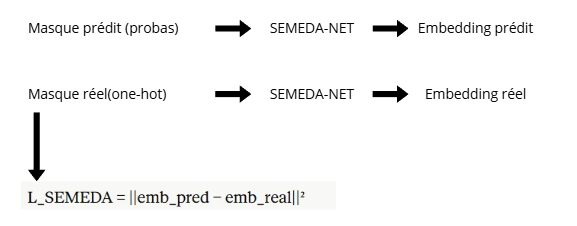

### Pourquoi ça marche ?

Le SEMEDA-Net est **pré-entraîné en autoencoder** sur les masques GT. Il apprend
à compresser les masques en représentations compactes qui capturent leur
**structure essentielle**.

-> Comparer dans cet espace = comparer la **cohérence structurelle**, pas juste
les pixels.

### Combined Loss avec SEMEDA

$$L = L_{CE} + \lambda \cdot L_{SEMEDA}$$

avec λ = 0.5.

### Note importante

SEMEDA travaille sur les **masques GT**, pas sur les images. Donc le même
SEMEDA-Net pré-entraîné fonctionne pour **toutes les architectures**
(U-Net, FCN-VGG16, SegFormer). On l'a déjà entraîné dans nos études précédentes
et il est sauvegardé dans `shared/semeda_net_pretrained.pth`.

In [26]:
# === SEMEDA-NET (ARCHITECTURE EXACTE selon le fichier pré-entraîné) ===

class SemedaNet(nn.Module):
    """
    Réseau auxiliaire SEMEDA (Semantic Edge-Aware) pour détection de bords.

    Architecture en 3 blocs :
    - conv1 : 2 -> 32 -> 32 (extraction features bas-niveau)
    - conv2 : 32 -> 64 -> 64 (extraction features mid-niveau)
    - edge_head : 64 -> 32 -> 1 (tête de détection des bords)

    Pré-entraîné en tant que détecteur de bords sur les masques GT.
    Pour la SEMEDA loss, on utilisera les features intermédiaires (sortie de conv2).

    Référence : Chen Yifu et al. - SEMEDA loss pour segmentation sémantique.
    """
    def __init__(self, in_channels=2):
        super().__init__()

        # Bloc 1 : 2 → 32 → 32
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=3, padding=1),  # conv1.0
            nn.BatchNorm2d(32),                                     # conv1.1
            nn.ReLU(inplace=True),                                  # conv1.2 (sans poids)
            nn.Conv2d(32, 32, kernel_size=3, padding=1),           # conv1.3
            nn.BatchNorm2d(32),                                     # conv1.4
            nn.ReLU(inplace=True),                                  # conv1.5 (sans poids)
        )

        # Bloc 2 : 32 → 64 → 64
        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),           # conv2.0
            nn.BatchNorm2d(64),                                     # conv2.1
            nn.ReLU(inplace=True),                                  # conv2.2
            nn.Conv2d(64, 64, kernel_size=3, padding=1),           # conv2.3
            nn.BatchNorm2d(64),                                     # conv2.4
            nn.ReLU(inplace=True),                                  # conv2.5
        )

        # Tête de bords : 64 → 32 → 1
        self.edge_head = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),           # edge_head.0
            nn.BatchNorm2d(32),                                     # edge_head.1
            nn.ReLU(inplace=True),                                  # edge_head.2
            nn.Conv2d(32, 1, kernel_size=1),                       # edge_head.3 (1×1)
        )

    def forward(self, mask_probas, return_features=True):
        """
        Args:
            mask_probas : [B, C, H, W] - masque (soft ou one-hot, C=2 classes)
            return_features : si True, retourne les features intermédiaires (conv2)
                              utilisées pour la SEMEDA loss

        Returns:
            Si return_features=True (mode loss SEMEDA):
                features : [B, 64, H, W] - sortie de conv2
            Si return_features=False (mode détection de bords):
                edge_map : [B, 1, H, W] - carte de probabilité des bords
        """
        f1 = self.conv1(mask_probas)
        f2 = self.conv2(f1)

        if return_features:
            return f2  # pour la SEMEDA loss
        else:
            edge_map = self.edge_head(f2)
            return edge_map  # pour visualiser/utiliser la détection de bords


# Test de l'architecture
print("=== Test architecture SemedaNet (version corrigée) ===")
test_net = SemedaNet(in_channels=N_CLASSES)
n_params = sum(p.numel() for p in test_net.parameters())
print(f"  Paramètres : {n_params:,} (attendu : ~84,678)")

# Test forward
fake_mask = torch.randn(2, N_CLASSES, 32, 32)
features = test_net(fake_mask, return_features=True)
edge_map = test_net(fake_mask, return_features=False)
print(f"  Features (pour SEMEDA loss) : {features.shape} (attendu : [2, 64, 32, 32])")
print(f"  Edge map (pour visualisation): {edge_map.shape} (attendu : [2, 1, 32, 32])")
print(f"  Architecture correcte")

=== Test architecture SemedaNet (version corrigée) ===
  Paramètres : 84,225 (attendu : ~84,678)
  Features (pour SEMEDA loss) : torch.Size([2, 64, 32, 32]) (attendu : [2, 64, 32, 32])
  Edge map (pour visualisation): torch.Size([2, 1, 32, 32]) (attendu : [2, 1, 32, 32])
  Architecture correcte


## 4.5 Chargement du SEMEDA pré-entraîné


## 4.5.1 Procédure de pré-entraînement de SEMEDA

Le réseau SEMEDA utilisé ici a été pré-entraîné selon la procédure suivante.
Si le fichier `shared/semeda_net_pretrained.pth` existe, on le charge directement.
Sinon, on peut le réentraîner avec la fonction `pretrain_semeda_with_es` définie ci-dessous.

### Tâche d'apprentissage : détection de bords sémantiques

SEMEDA-Net est entraîné comme **détecteur de bords** sur les masques GT du dataset
Posidonia training.

- **Entrée** : masque binaire (format one-hot, 2 canaux : fond + posidonie)
- **Sortie** : carte de probabilité des bords (1 canal, valeurs ∈ [0, 1])
- **Cible** : carte de bords GT calculée par opérateur de gradient sur le masque binaire

### Pipeline d'entraînement

### Hyperparamètres utilisés

| Paramètre | Valeur |
|---|---|
| Optimizer | Adam |
| Learning rate | 1e-3 |
| Loss | BCEWithLogitsLoss |
| Batch size | 4 |
| Max epochs | 100 |
| Early stopping patience | 5 |
| Split validation interne | 15% du training set |

### Stratégie d'early stopping

- Mini-split interne **80/15** sur les masques training (avec seed fixé pour reproductibilité)
- Surveillance de la **val_loss** à chaque epoch
- Sauvegarde du **meilleur état** quand val_loss diminue
- Arrêt après 5 epochs sans amélioration
- Restauration du **meilleur état** à la fin

### Résultats de pré-entraînement

Les résultats typiques observés lors du pré-entraînement initial (sur SegFormer-B0) :
- Convergence en ~15-25 epochs
- Best val_loss sensiblement 0.10-0.15 (BCE sur cartes de bords)
- Pas de surapprentissage marqué (train et val proches)

### Réutilisation

Le SEMEDA-Net travaille **uniquement** sur les masques GT (identiques quelle que soit
l'architecture de segmentation). Il peut donc être **réutilisé tel quel** pour :
- U-Net (ce notebook)
- FCN-VGG16 (futur notebook)
- SegFormer (déjà utilisé)

D'où son emplacement dans `shared/`.

In [27]:
# === FONCTIONS POUR (RE-)ENTRAÎNER SEMEDA SI NÉCESSAIRE ===

def compute_gt_edges(masks):
    """
    Calcule la carte de bords GT à partir des masques binaires.

    Utilise un opérateur de gradient (différences finies) pour détecter les
    transitions entre régions.

    Args:
        masks : [B, H, W] tensor de masques binaires (valeurs 0 ou 1)

    Returns:
        edges : [B, 1, H, W] carte de bords (valeurs ∈ [0, 1])
    """
    masks_float = masks.float().unsqueeze(1)  # [B, 1, H, W]

    # Gradient horizontal (différence avec le pixel à droite)
    grad_x = torch.abs(masks_float[:, :, :, 1:] - masks_float[:, :, :, :-1])
    grad_x = F.pad(grad_x, (0, 1, 0, 0))  # pad pour conserver la taille

    # Gradient vertical (différence avec le pixel en dessous)
    grad_y = torch.abs(masks_float[:, :, 1:, :] - masks_float[:, :, :-1, :])
    grad_y = F.pad(grad_y, (0, 0, 0, 1))

    # Magnitude du gradient (présence d'un bord)
    edges = torch.clamp(grad_x + grad_y, 0, 1)

    return edges


def pretrain_semeda_with_es(train_dataset, n_epochs=100, lr=1e-3,
                              batch_size=4, patience=5, val_split=0.15,
                              save_path=None):
    """
    Pré-entraîne SEMEDA-Net comme détecteur de bords sur les masques GT.

    Utilise un mini-split interne (val_split) pour l'early stopping.

    Args:
        train_dataset : dataset training (fournit images, masques)
        n_epochs : nombre maximum d'époques
        lr : learning rate
        batch_size : taille du batch
        patience : patience pour early stopping
        val_split : fraction du dataset pour validation interne (default 0.15)
        save_path : si fourni, sauvegarde le modèle entraîné à ce chemin

    Returns:
        SemedaNet : réseau pré-entraîné (poids figés, mode eval)
    """
    from torch.utils.data import random_split

    # Mini-split interne pour l'early stopping
    n_total = len(train_dataset)
    n_val = int(n_total * val_split)
    n_tr = n_total - n_val

    g = torch.Generator().manual_seed(SEED)
    tr_subset, val_subset = random_split(train_dataset, [n_tr, n_val], generator=g)

    print(f"=== Pré-entraînement SEMEDA avec early stopping ===")
    print(f"  Train : {n_tr} | Val : {n_val} | Patience : {patience}")
    print(f"  Max epochs : {n_epochs} | LR : {lr} | Batch size : {batch_size}\n")

    # Initialisation du réseau
    semeda = SemedaNet(in_channels=N_CLASSES).to(DEVICE)
    optimizer = torch.optim.Adam(semeda.parameters(), lr=lr)
    criterion = nn.BCEWithLogitsLoss()

    tr_loader  = DataLoader(tr_subset,  batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

    best_val_loss = float('inf')
    best_state = None
    patience_counter = 0
    history = {'train_loss': [], 'val_loss': []}

    for epoch in range(n_epochs):
        # === Phase d'entraînement ===
        semeda.train()
        total_train = 0
        n_tr_batches = 0
        for _, masks in tr_loader:
            masks = masks.to(DEVICE)

            # Préparation : masque one-hot pour SEMEDA
            mask_onehot = F.one_hot(masks.long(), num_classes=N_CLASSES)
            mask_onehot = mask_onehot.permute(0, 3, 1, 2).float()

            # Cible : carte de bords GT
            gt_edges = compute_gt_edges(masks)

            # Prédiction (utiliser return_features=False pour avoir la edge_map)
            pred_edges = semeda(mask_onehot, return_features=False)

            # Loss
            loss = criterion(pred_edges, gt_edges)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_train += loss.item()
            n_tr_batches += 1

        train_loss = total_train / n_tr_batches

        # === Phase de validation ===
        semeda.eval()
        total_val = 0
        n_val_batches = 0
        with torch.no_grad():
            for _, masks in val_loader:
                masks = masks.to(DEVICE)
                mask_onehot = F.one_hot(masks.long(), num_classes=N_CLASSES)
                mask_onehot = mask_onehot.permute(0, 3, 1, 2).float()
                gt_edges = compute_gt_edges(masks)
                pred_edges = semeda(mask_onehot, return_features=False)
                loss = criterion(pred_edges, gt_edges)
                total_val += loss.item()
                n_val_batches += 1

        val_loss = total_val / n_val_batches
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)

        # === Early stopping ===
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_state = {k: v.clone() for k, v in semeda.state_dict().items()}
            patience_counter = 0
            marker = "*"
        else:
            patience_counter += 1
            marker = " "

        print(f"  Epoch {epoch+1:3d} | train={train_loss:.5f} | val={val_loss:.5f} {marker}"
              f" | patience={patience_counter}/{patience}")

        if patience_counter >= patience:
            print(f"\n  >>> Early stopping à l'epoch {epoch+1}")
            break

    # Restauration du meilleur état
    semeda.load_state_dict(best_state)
    semeda.eval()
    for param in semeda.parameters():
        param.requires_grad = False

    print(f"\n  Pré-entraînement terminé (best val_loss = {best_val_loss:.5f})")

    # Sauvegarde optionnelle
    if save_path is not None:
        save_dict = {'state_dict': semeda.state_dict()}
        torch.save(save_dict, save_path)
        print(f"  Modèle sauvegardé : {save_path}")

    return semeda, history


# Note : on ne lance pas le pré-entraînement ici, juste on définit la fonction.
# Elle sera utilisée seulement si le fichier .pth n'existe pas (voir cellule suivante).
print("   Fonctions de pré-entraînement définies (compute_gt_edges, pretrain_semeda_with_es)")
print("   Ces fonctions seront utilisées seulement si le fichier SEMEDA .pth n'existe pas.")

   Fonctions de pré-entraînement définies (compute_gt_edges, pretrain_semeda_with_es)
   Ces fonctions seront utilisées seulement si le fichier SEMEDA .pth n'existe pas.


In [28]:
# === CHARGEMENT INTELLIGENT DE SEMEDA ===
# Si le fichier .pth existe -> on charge
# Sinon -> on pré-entraîne et on sauvegarde dans shared/

SEMEDA_PATH = os.path.join(SHARED_DIR, "semeda_net_pretrained.pth")

def load_or_train_semeda(semeda_path=SEMEDA_PATH, force_retrain=False):
    """
    Charge SEMEDA depuis le fichier .pth s'il existe, sinon le pré-entraîne.

    Args:
        semeda_path : chemin du fichier .pth dans shared/
        force_retrain : si True, force le pré-entraînement même si le fichier existe

    Returns:
        SemedaNet : réseau prêt à l'emploi (mode eval, poids figés)
    """
    # Cas 1 : le fichier existe et on ne force pas le réentraînement
    if os.path.exists(semeda_path) and not force_retrain:
        print(f"=== Chargement de SEMEDA depuis {semeda_path} ===\n")

        # Création du réseau (architecture exacte)
        net = SemedaNet(in_channels=N_CLASSES)

        # Chargement des poids
        loaded_data = torch.load(semeda_path, map_location=DEVICE)

        # Gestion des deux formats possibles
        if isinstance(loaded_data, dict) and 'state_dict' in loaded_data:
            state_dict = loaded_data['state_dict']
            print(f"   Format détecté : dict avec 'state_dict' à l'intérieur")
        else:
            state_dict = loaded_data
            print(f"   Format détecté : state_dict direct")

        net.load_state_dict(state_dict)
        net.eval()
        for p in net.parameters():
            p.requires_grad = False
        net = net.to(DEVICE)

        n_params = sum(p.numel() for p in net.parameters())
        print(f"  SEMEDA chargé ({n_params:,} paramètres, tous figés)")
        return net

    # Cas 2 : pas de fichier, on pré-entraîne
    print(f"=== Aucun SEMEDA pré-entraîné trouvé à {semeda_path} ===")
    print(f"   Lancement du pré-entraînement...\n")

    # Dataset training sans augmentation ni prétraitement (sur masques GT bruts)
    train_dataset_for_semeda = PosidoniaDatasetFromCSV(
        csv_path=TRAIN_CSV,
        root_path=LOCAL_PATH,
        split="training",
        augment=False,
        preprocess=None,
    )

    semeda, history = pretrain_semeda_with_es(
        train_dataset=train_dataset_for_semeda,
        n_epochs=100,
        lr=1e-3,
        batch_size=4,
        patience=5,
        val_split=0.15,
        save_path=semeda_path,  # sauvegarde directement dans shared/
    )

    return semeda


# Chargement (ou pré-entraînement si nécessaire)
semeda_net = load_or_train_semeda()

print("\n=== Test forward avec SEMEDA opérationnel ===")
fake_mask = torch.randn(2, N_CLASSES, IMG_H, IMG_W).to(DEVICE)
features = semeda_net(fake_mask, return_features=True)
print(f"  Sortie features : {features.shape}")
print(f"  Tout est opérationnel")

=== Chargement de SEMEDA depuis /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/shared/semeda_net_pretrained.pth ===

   Format détecté : dict avec 'state_dict' à l'intérieur
  SEMEDA chargé (84,225 paramètres, tous figés)

=== Test forward avec SEMEDA opérationnel ===
  Sortie features : torch.Size([2, 64, 352, 480])
  Tout est opérationnel


In [29]:
# === SEMEDA LOSS ===

class SemedaLoss(nn.Module):
    """
    Loss SEMEDA : distance entre les features intermédiaires des masques
    prédit et réel, calculées par le réseau SEMEDA pré-entraîné.

    Le SEMEDA-Net étant pré-entraîné comme détecteur de bords sur les masques GT,
    ses features intermédiaires capturent la structure sémantique des bords
    et des régions.

    Args:
        semeda_net : instance de SemedaNet pré-entraîné (poids figés)
        n_classes : nombre de classes
    """
    def __init__(self, semeda_net, n_classes=2):
        super().__init__()
        self.semeda_net = semeda_net
        self.n_classes = n_classes

        # S'assurer que les poids sont figés
        for p in self.semeda_net.parameters():
            p.requires_grad = False
        self.semeda_net.eval()

    def forward(self, logits, targets):
        """
        Args:
            logits : [B, C, H, W] - sorties brutes du modèle de segmentation
            targets : [B, H, W] - labels int

        Returns:
            scalar tensor : distance L2 entre features prédites et réelles
        """
        # Probas pour le masque prédit
        probas = F.softmax(logits, dim=1)

        # One-hot pour le masque réel
        targets_one_hot = F.one_hot(targets, num_classes=self.n_classes)
        targets_one_hot = targets_one_hot.permute(0, 3, 1, 2).float()

        # Extraction des features via SEMEDA (features intermédiaires)
        features_pred = self.semeda_net(probas, return_features=True)
        features_real = self.semeda_net(targets_one_hot, return_features=True)

        # Distance L2 entre les embeddings
        return F.mse_loss(features_pred, features_real)


# Test
print("=== Test SemedaLoss avec SEMEDA pré-entraîné ===")
semeda_loss_fn = SemedaLoss(semeda_net, n_classes=N_CLASSES)
fake_logits = torch.randn(2, N_CLASSES, IMG_H, IMG_W).to(DEVICE)
fake_targets = torch.randint(0, N_CLASSES, (2, IMG_H, IMG_W)).to(DEVICE)
loss_value = semeda_loss_fn(fake_logits, fake_targets)
print(f"  Test : loss = {loss_value.item():.4f}")
print(f"  SemedaLoss opérationnelle")


class CombinedSemedaLoss(nn.Module):
    """
    Combinaison CE + λ × SEMEDA.

    Args:
        semeda_net : instance de SemedaNet pré-entraîné
        n_classes : nombre de classes
        lambda_semeda : poids du terme SEMEDA (default 0.5)
    """
    def __init__(self, semeda_net, n_classes=2, lambda_semeda=0.5):
        super().__init__()
        self.ce = nn.CrossEntropyLoss()
        self.semeda = SemedaLoss(semeda_net, n_classes=n_classes)
        self.lambda_semeda = lambda_semeda

    def forward(self, logits, targets):
        ce_loss = self.ce(logits, targets)
        semeda_loss = self.semeda(logits, targets)
        return ce_loss + self.lambda_semeda * semeda_loss


# === TEST DE CombinedSemedaLoss ===

print("=== Combined SEMEDA Loss ===")

# Création d'un SemedaNet de test (poids aléatoires, juste pour vérifier la structure)
semeda_net_test = SemedaNet(in_channels=N_CLASSES)
combined_semeda = CombinedSemedaLoss(semeda_net_test, n_classes=N_CLASSES, lambda_semeda=0.5)

fake_logits = torch.randn(2, N_CLASSES, 32, 32)
fake_targets = torch.randint(0, N_CLASSES, (2, 32, 32))
loss_value = combined_semeda(fake_logits, fake_targets)
print(f"  Test : loss = {loss_value.item():.4f}")
print(f"  Combined SEMEDA Loss opérationnelle")

=== Test SemedaLoss avec SEMEDA pré-entraîné ===
  Test : loss = 1.3574
  SemedaLoss opérationnelle
=== Combined SEMEDA Loss ===
  Test : loss = 0.9037
  Combined SEMEDA Loss opérationnelle


## 4.6 Registry des fonctions de perte

Pour pouvoir tester facilement différentes losses dans nos expériences, on
utilise un **registry** (comme pour les prétraitements).

**Convention** : chaque loss est instanciée via une fonction `build_loss(name, ...)`.

In [30]:
# === REGISTRY DES FONCTIONS DE PERTE ===

def build_loss(loss_name, semeda_net=None, n_classes=N_CLASSES,
                lambda_dice=0.5, lambda_semeda=0.5):
    """
    Construit une fonction de perte selon son nom.

    Args:
        loss_name : "ce", "ce_dice", ou "ce_semeda"
        semeda_net : SemedaNet pré-entraîné (requis pour "ce_semeda")
        n_classes : nombre de classes
        lambda_dice : poids du Dice si "ce_dice"
        lambda_semeda : poids de SEMEDA si "ce_semeda"

    Returns:
        nn.Module : fonction de perte prête à l'emploi
    """
    if loss_name == "ce":
        return nn.CrossEntropyLoss()

    elif loss_name == "ce_dice":
        return CombinedLoss(lambda_dice=lambda_dice)

    elif loss_name == "ce_semeda":
        if semeda_net is None:
            raise ValueError("semeda_net est requis pour la loss 'ce_semeda'")
        return CombinedSemedaLoss(semeda_net, n_classes=n_classes,
                                    lambda_semeda=lambda_semeda)

    else:
        available = ["ce", "ce_dice", "ce_semeda"]
        raise ValueError(f"Loss '{loss_name}' inconnue. Disponibles : {available}")


# Test du registry
print("=== Test du registry des losses ===\n")

for loss_name in ["ce", "ce_dice", "ce_semeda"]:
    loss_fn = build_loss(loss_name, semeda_net=semeda_net)
    fake_logits = torch.randn(2, N_CLASSES, 32, 32).to(DEVICE)
    fake_targets = torch.randint(0, N_CLASSES, (2, 32, 32)).to(DEVICE)
    value = loss_fn(fake_logits, fake_targets)
    print(f"  {loss_name:<12} -> {value.item():.4f}")

# Test validation
print("\n=== Test de la validation ===")
try:
    build_loss("typo_inexistant")
    print("  Erreur : la validation n'a pas marché")
except ValueError as e:
    print(f"  Validation OK : {e}")

print("\n=== Section 4 terminée ===")

=== Test du registry des losses ===

  ce           -> 0.9049
  ce_dice      -> 1.1340
  ce_semeda    -> 1.5869

=== Test de la validation ===
  Validation OK : Loss 'typo_inexistant' inconnue. Disponibles : ['ce', 'ce_dice', 'ce_semeda']

=== Section 4 terminée ===


# 5. Fonctions d'évaluation

## 5.1 Métriques pour la segmentation binaire

Pour évaluer la qualité d'une segmentation binaire (fond vs posidonie), on utilise
**plusieurs métriques complémentaires** car aucune n'est suffisante seule.

### Tableau récapitulatif

| Métrique | Formule | Mesure | Range |
|---|---|---|---|
| **Accuracy** | (TP + TN) / N | Taux global de pixels bien classés | [0, 1] |
| **Precision** | TP / (TP + FP) | Quand on dit "posidonie", a-t-on raison ? | [0, 1] |
| **Recall** | TP / (TP + FN) | Trouve-t-on toute la posidonie présente ? | [0, 1] |
| **Fallout** | FP / (FP + TN) | Erreurs de "fausse posidonie" | [0, 1] |
| **Dice** | 2·TP / (2·TP + FP + FN) | Recouvrement régional | [0, 1] |
| **IoU** | TP / (TP + FP + FN) | Intersection sur union s'intéresse à la classe positive | [0, 1] |
| **mIoU** | (IoU_fond + IoU_posidonie)/2| Offre une vision plus équilibrée en mesurant si le modèle réussit aussi à reconnaître le fond. | [0, 1] |
| **AUC-ROC** | ∫ ROC | Discrimination globale (indépendant du seuil) | [0, 1] |
| **AUC-PR** | ∫ PR | Performance sur classe positive | [0, 1] |

avec :
- TP=Vrais Positifs, TN=Vrais Négatifs, FP=Faux Positifs, FN=Faux Négatifs.
- IoU_fond = TN / (TN + FN + FP)
- IoU_posidonie = TP / (TP + FP + FN)

### Pourquoi tant de métriques ?

**Accuracy** seule est **trompeuse** : sur une image avec 95% de fond et 5% de posidonie,
prédire "tout fond" donne 95% d'accuracy mais 0% de Recall (catastrophique).

**Dice, IoU et mIoU** mesurent le **recouvrement régional**, plus robustes pour la segmentation.

**Recall et Precision** sont **complémentaires** :
- Recall élevé + Precision faible = sur-détection (on trouve toute la posidonie mais on en invente)
- Recall faible + Precision élevée = sous-détection (on est sûr quand on dit posidonie, mais on en rate)

**AUC-ROC et AUC-PR** sont **indépendants du seuil** : ils mesurent la qualité
intrinsèque du modèle sur tous les seuils possibles.

### Le rôle critique du seuil de décision

Le modèle produit des **probabilités** (via softmax). Pour obtenir un masque binaire,
on applique un seuil : `pred = 1 si proba > seuil sinon 0`.

**Seuil par défaut** : 0.5

**Mais** ce seuil peut être **sous-optimal** :
- Sur images déséquilibrées, le seuil optimal est souvent < 0.5
- Différents seuils donnent différents équilibres precision/recall

### Notre critère de sélection du seuil

Conformément à Martin-Abadal et al. (2018), nous utilisons le critère
**"Recall - Fallout"** (aussi appelé Youden's J statistic) :

$$\text{seuil}^* = \arg\max_{thr} \big[ \text{Recall}(thr) - \text{Fallout}(thr) \big]$$

**Avantages** :
- Identifie le point de la courbe ROC le plus éloigné de la diagonale (aléatoire)
- Équilibre sensibilité (Recall) et spécificité (1 - Fallout)
- Robuste au déséquilibre des classes : bien que nous ayons fait des splits statifiés, nous aimerons bien garder cette approche pour le choix du seuil

**Justification** : sur le dataset Posidonia, les images ont des taux de couverture
très variables (de 5% à 95%). Un critère basé sur l'accuracy serait biaisé par la
classe dominante de chaque image. Le compromis Recall/Fallout reste **invariant**
au taux de couverture.

In [56]:
# === FONCTION D'ÉVALUATION COMPLÈTE (avec mIoU et critère de seuil configurable) ===

@torch.no_grad()
def evaluate_full(model, loader, device=DEVICE, thresholds=None, n_classes=N_CLASSES,
                   threshold_criterion="recall_minus_fallout"):
    """
    Évalue un modèle sur un DataLoader avec recherche de seuil optimal.

    Args:
        model : modèle PyTorch (mis en eval mode automatiquement)
        loader : DataLoader sur le set à évaluer
        device : device pour l'inférence
        thresholds : liste de seuils à tester. Si None, [0.1, 0.2, ..., 0.9]
        n_classes : nombre de classes (2 pour binaire)
        threshold_criterion : critère pour choisir le meilleur seuil. Choix :
            - "recall_minus_fallout" : maximise (Recall - Fallout) [Martin-Abadal 2018]
            - "accuracy"             : maximise l'accuracy
            - "dice"                 : maximise le Dice
            - "iou"                  : maximise l'IoU posidonie
            - "miou"                 : maximise le mIoU

    Returns:
        dict (mêmes clés qu'avant)
    """
    if thresholds is None:
        thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

    valid_criteria = ["recall_minus_fallout", "accuracy", "dice", "iou", "miou"]
    if threshold_criterion not in valid_criteria:
        raise ValueError(
            f"Critère '{threshold_criterion}' inconnu. "
            f"Choix valides : {valid_criteria}"
        )

    model.eval()

    # Accumulation des prédictions sur tout le set
    all_probas = []
    all_labels = []

    for imgs, masks in loader:
        imgs = imgs.to(device)
        masks = masks.to(device)

        logits = model(imgs)
        probas = F.softmax(logits, dim=1)
        proba_pos = probas[:, 1, :, :]

        all_probas.append(proba_pos.cpu().numpy().flatten())
        all_labels.append(masks.cpu().numpy().flatten())

    all_probas = np.concatenate(all_probas)
    all_labels = np.concatenate(all_labels)

    # === Calcul des métriques pour chaque seuil ===
    metrics_per_threshold = {}
    for thr in thresholds:
        preds = (all_probas > thr).astype(np.int32)

        tp = ((preds == 1) & (all_labels == 1)).sum()
        tn = ((preds == 0) & (all_labels == 0)).sum()
        fp = ((preds == 1) & (all_labels == 0)).sum()
        fn = ((preds == 0) & (all_labels == 1)).sum()

        total = tp + tn + fp + fn

        accuracy = (tp + tn) / total if total > 0 else 0
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        fallout = fp / (fp + tn) if (fp + tn) > 0 else 0
        dice = (2 * tp) / (2 * tp + fp + fn) if (2 * tp + fp + fn) > 0 else 0

        # IoU par classe
        iou_posidonie = tp / (tp + fp + fn) if (tp + fp + fn) > 0 else 0
        iou_fond      = tn / (tn + fn + fp) if (tn + fn + fp) > 0 else 0
        miou          = (iou_fond + iou_posidonie) / 2

        # F1-score (équivalent à Dice en classification binaire, gardé pour clarté)
        f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

        # recall - fallout (Youden's J)
        recall_minus_fallout = recall - fallout

        metrics_per_threshold[thr] = {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'fallout': fallout,
            'dice': dice,
            'iou': iou_posidonie,
            'iou_background': iou_fond,
            'miou': miou,
            'recall_minus_fallout': recall_minus_fallout,
            'tp': int(tp), 'tn': int(tn), 'fp': int(fp), 'fn': int(fn),
        }

    # === Sélection du meilleur seuil selon le critère choisi ===
    best_threshold = max(thresholds,
                            key=lambda t: metrics_per_threshold[t][threshold_criterion])
    best_metrics = metrics_per_threshold[best_threshold]

    # === Matrice de confusion au meilleur seuil ===
    best_preds = (all_probas > best_threshold).astype(np.int32)
    cm = confusion_matrix(all_labels, best_preds, labels=[0, 1])

    # === Courbes ROC et PR ===
    fpr, tpr, _ = roc_curve(all_labels, all_probas)
    auc_roc = auc(fpr, tpr)

    precision_curve, recall_curve, _ = precision_recall_curve(all_labels, all_probas)
    auc_pr = average_precision_score(all_labels, all_probas)

    return {
        'metrics_per_threshold': metrics_per_threshold,
        'best_threshold': best_threshold,
        'best_metrics': best_metrics,
        'threshold_criterion': threshold_criterion,
        'confusion_matrix': cm,
        'fpr': fpr,
        'tpr': tpr,
        'precision_curve': precision_curve,
        'recall_curve': recall_curve,
        'auc_roc': auc_roc,
        'auc_pr': auc_pr,
        'all_probas': all_probas,
        'all_labels': all_labels,
    }


# Test : on compare les deux critères sur le même modèle
print("=== Test de evaluate_full avec différents critères ===\n")

val_ds_test = PosidoniaDatasetFromCSV(
    csv_path=VAL_CSV, root_path=LOCAL_PATH, split="training",
    augment=False, preprocess=None,
)
val_loader_test = DataLoader(val_ds_test, batch_size=BATCH_SIZE, shuffle=False)

model_test = UNet(in_channels=3, n_classes=N_CLASSES, base_channels=64).to(DEVICE)

# Évaluation avec recall - fallout (default Martin-Abadal)
print("--- Critère : recall - fallout (Martin-Abadal) ---")
results_rmf = evaluate_full(model_test, val_loader_test,
                              threshold_criterion="recall_minus_fallout")
print(f"  Best threshold : {results_rmf['best_threshold']}")
print(f"  Recall - Fallout : {results_rmf['best_metrics']['recall_minus_fallout']:.4f}")
print(f"  Accuracy : {results_rmf['best_metrics']['accuracy']:.4f}")
print(f"  mIoU : {results_rmf['best_metrics']['miou']:.4f}")

# Évaluation avec accuracy
print("\n--- Critère : accuracy (alternative) ---")
results_acc = evaluate_full(model_test, val_loader_test,
                              threshold_criterion="accuracy")
print(f"  Best threshold : {results_acc['best_threshold']}")
print(f"  Recall - Fallout : {results_acc['best_metrics']['recall_minus_fallout']:.4f}")
print(f"  Accuracy : {results_acc['best_metrics']['accuracy']:.4f}")
print(f"  mIoU : {results_acc['best_metrics']['miou']:.4f}")

print("\n evaluate_full opérationnel avec critère configurable")

=== Test de evaluate_full avec différents critères ===

  [training/CSV] preprocess=None, aug=False, images=76
--- Critère : recall - fallout (Martin-Abadal) ---
  Best threshold : 0.1
  Recall - Fallout : 0.0000
  Accuracy : 0.4417
  mIoU : 0.2209

--- Critère : accuracy (alternative) ---
  Best threshold : 0.5
  Recall - Fallout : 0.0000
  Accuracy : 0.5583
  mIoU : 0.2791

 evaluate_full opérationnel avec critère configurable


## 5.3 Fonctions de visualisation

### 5.3.1 Courbes d'apprentissage

Affiche l'évolution de la loss train/val au fil des epochs, avec marquage du
meilleur epoch (best val_loss).

 plot_training_curves mise à jour avec accuracy et mIoU
=== Test plot_training_curves ===


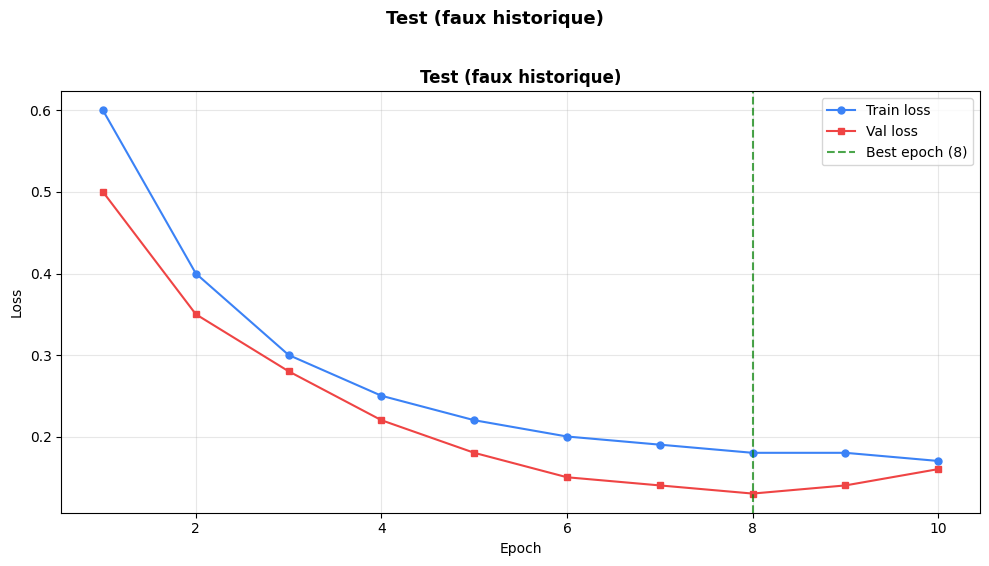

   plot_training_curves opérationnel


In [32]:
# === COURBES D'APPRENTISSAGE ENRICHIES ===

def plot_training_curves(history, title="Courbes d'apprentissage", save_path=None):
    """
    Affiche les courbes d'apprentissage : loss, accuracy et mIoU.

    Args:
        history : dict avec les clés 'train_loss', 'val_loss',
                   'train_accuracy', 'val_accuracy', 'train_miou', 'val_miou'
        title : titre du graphique
        save_path : si fourni, sauvegarde la figure

    Returns:
        fig matplotlib
    """
    epochs = list(range(1, len(history['train_loss']) + 1))

    # Détecter si on a les métriques détaillées
    has_detailed_metrics = 'train_accuracy' in history and 'train_miou' in history

    if has_detailed_metrics:
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))

        # === 1. Loss ===
        axes[0].plot(epochs, history['train_loss'], 'o-', label='Train',
                      color='#3b82f6', markersize=4)
        axes[0].plot(epochs, history['val_loss'], 's-', label='Val',
                      color='#ef4444', markersize=4)
        best_epoch_loss = np.argmin(history['val_loss']) + 1
        axes[0].axvline(best_epoch_loss, color='green', linestyle='--', alpha=0.7,
                          label=f"Best epoch ({best_epoch_loss})")
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Loss')
        axes[0].set_title('Loss', fontsize=12, fontweight='bold')
        axes[0].legend(loc='upper right')
        axes[0].grid(alpha=0.3)

        # === 2. Accuracy ===
        axes[1].plot(epochs, history['train_accuracy'], 'o-', label='Train',
                      color='#3b82f6', markersize=4)
        axes[1].plot(epochs, history['val_accuracy'], 's-', label='Val',
                      color='#ef4444', markersize=4)
        axes[1].axvline(best_epoch_loss, color='green', linestyle='--', alpha=0.5)
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Accuracy')
        axes[1].set_title('Accuracy', fontsize=12, fontweight='bold')
        axes[1].legend(loc='lower right')
        axes[1].grid(alpha=0.3)
        axes[1].set_ylim([0, 1])

        # === 3. mIoU ===
        axes[2].plot(epochs, history['train_miou'], 'o-', label='Train',
                      color='#3b82f6', markersize=4)
        axes[2].plot(epochs, history['val_miou'], 's-', label='Val',
                      color='#ef4444', markersize=4)
        axes[2].axvline(best_epoch_loss, color='green', linestyle='--', alpha=0.5)
        axes[2].set_xlabel('Epoch')
        axes[2].set_ylabel('mIoU')
        axes[2].set_title('mIoU', fontsize=12, fontweight='bold')
        axes[2].legend(loc='lower right')
        axes[2].grid(alpha=0.3)
        axes[2].set_ylim([0, 1])
    else:
        # Version simple si seulement la loss est disponible
        fig, ax = plt.subplots(figsize=(10, 5.5))
        ax.plot(epochs, history['train_loss'], 'o-', label='Train loss',
                  color='#3b82f6', markersize=5)
        ax.plot(epochs, history['val_loss'], 's-', label='Val loss',
                  color='#ef4444', markersize=5)
        best_epoch = np.argmin(history['val_loss']) + 1
        ax.axvline(best_epoch, color='green', linestyle='--', alpha=0.7,
                    label=f"Best epoch ({best_epoch})")
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss')
        ax.set_title(title, fontsize=12, fontweight='bold')
        ax.legend(loc='upper right')
        ax.grid(alpha=0.3)

    plt.suptitle(title, fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
        print(f"   Sauvegardé : {save_path}")

    return fig


print(" plot_training_curves mise à jour avec accuracy et mIoU")


# Test avec un faux historique
print("=== Test plot_training_curves ===")
fake_history = {
    'train_loss': [0.6, 0.4, 0.3, 0.25, 0.22, 0.20, 0.19, 0.18, 0.18, 0.17],
    'val_loss':   [0.5, 0.35, 0.28, 0.22, 0.18, 0.15, 0.14, 0.13, 0.14, 0.16],
}
fig = plot_training_curves(fake_history, title="Test (faux historique)")
plt.show()
print("   plot_training_curves opérationnel")

### 5.3.2 Matrices de confusion (val + test)

Affiche les matrices de confusion **côte à côte** pour val et test, au seuil optimal
de chaque set. Inclut les pourcentages et compteurs.

=== Test plot_confusion_matrices ===


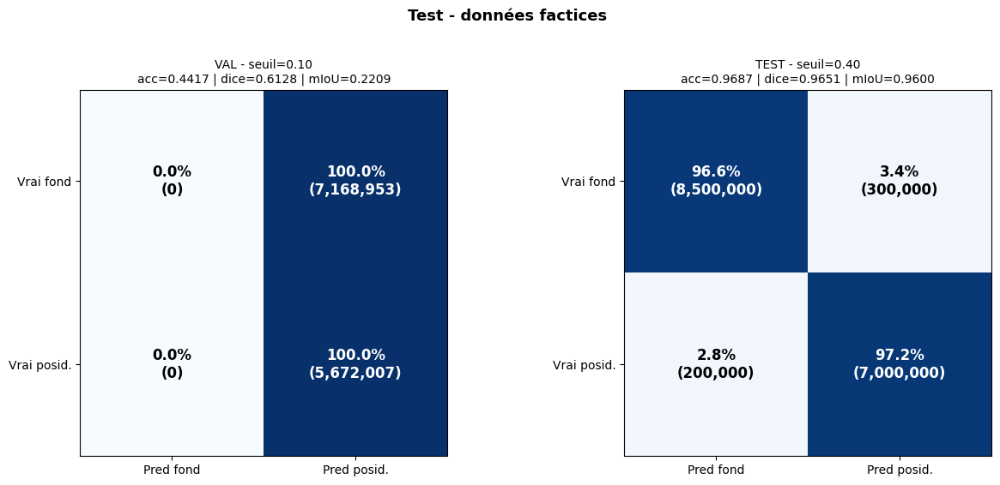

  plot_confusion_matrices opérationnel


In [37]:
# === MATRICES DE CONFUSION ===

# === MATRICES DE CONFUSION (avec mIoU dans le titre) ===

def plot_confusion_matrices(val_results, test_results, title=None, save_path=None):
    """
    Affiche les matrices de confusion val et test côte à côte.

    Args:
        val_results : sortie de evaluate_full sur le set val
        test_results : sortie de evaluate_full sur le set test
        title : titre principal (si None, automatique)
        save_path : si fourni, sauvegarde la figure

    Returns:
        fig matplotlib
    """
    fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))

    for ax, results, set_name in zip(axes, [val_results, test_results], ["VAL", "TEST"]):
        cm = results['confusion_matrix']
        thr = results['best_threshold']
        acc = results['best_metrics']['accuracy']
        dice = results['best_metrics']['dice']
        miou = results['best_metrics']['miou']

        # Pourcentages par ligne
        cm_pct = cm / cm.sum(axis=1, keepdims=True) * 100

        # Affichage
        im = ax.imshow(cm_pct, cmap='Blues', vmin=0, vmax=100, aspect='equal')

        # Annotations
        for i in range(2):
            for j in range(2):
                pct = cm_pct[i, j]
                count = cm[i, j]
                color = 'white' if pct > 50 else 'black'
                ax.text(j, i, f"{pct:.1f}%\n({count:,})",
                          ha='center', va='center',
                          color=color, fontsize=12, fontweight='bold')

        # Labels
        ax.set_xticks([0, 1])
        ax.set_yticks([0, 1])
        ax.set_xticklabels(['Pred fond', 'Pred posid.'])
        ax.set_yticklabels(['Vrai fond', 'Vrai posid.'])
        # NOUVEAU : ajout du mIoU dans le titre
        ax.set_title(f"{set_name} - seuil={thr:.2f}\n"
                      f"acc={acc:.4f} | dice={dice:.4f} | mIoU={miou:.4f}",
                       fontsize=10)

    if title is None:
        title = "Matrices de confusion (val + test)"
    plt.suptitle(title, fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
        print(f"   Sauvegardé : {save_path}")

    return fig




# Test (avec deux résultats factices)
print("=== Test plot_confusion_matrices ===")

# On utilise les résultats du test précédent pour val
fake_test_results = {
    'confusion_matrix': np.array([[8500000, 300000], [200000, 7000000]]),
    'best_threshold': 0.4,
    'best_metrics': {
        'accuracy': 0.9687,
        'dice': 0.9651,
        'miou': 0.96
    },
}

# Si on considère les résultats de l'évaluation qui s'est fait sur recall_fall-out

fig = plot_confusion_matrices(results_rmf, fake_test_results,
                                 title="Test - données factices")
plt.show()
print("  plot_confusion_matrices opérationnel")

### 5.3.3 Courbes ROC et Precision-Recall

Affiche les courbes ROC et PR sur val + test côte à côte, avec les AUC.

=== Test plot_roc_pr_curves ===


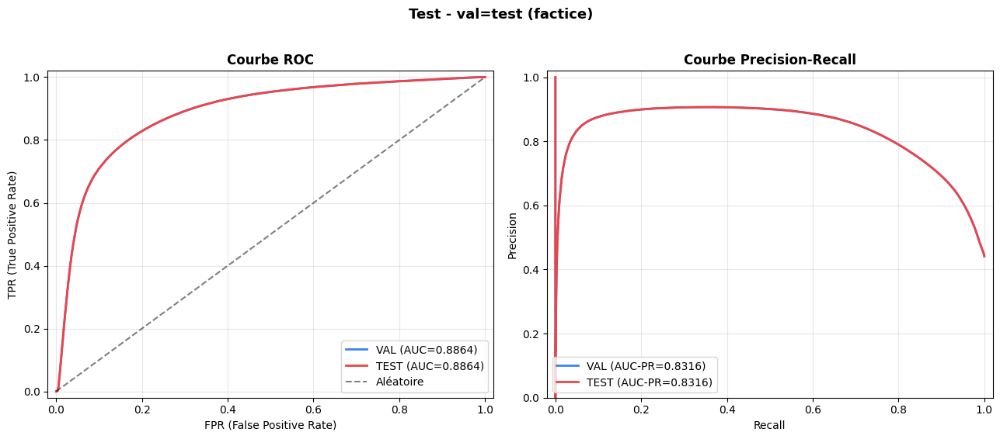

   plot_roc_pr_curves opérationnel


In [38]:
# === COURBES ROC ET PR ===

def plot_roc_pr_curves(val_results, test_results, title=None, save_path=None):
    """
    Affiche les courbes ROC et PR pour val + test sur 2 graphiques côte à côte.

    Args:
        val_results : sortie de evaluate_full sur val
        test_results : sortie de evaluate_full sur test
        title : titre principal
        save_path : sauvegarde optionnelle

    Returns:
        fig matplotlib
    """
    fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))

    # === Courbe ROC ===
    axes[0].plot(val_results['fpr'], val_results['tpr'],
                  label=f"VAL (AUC={val_results['auc_roc']:.4f})",
                  color='#3b82f6', linewidth=2)
    axes[0].plot(test_results['fpr'], test_results['tpr'],
                  label=f"TEST (AUC={test_results['auc_roc']:.4f})",
                  color='#ef4444', linewidth=2)
    axes[0].plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Aléatoire')
    axes[0].set_xlabel('FPR (False Positive Rate)')
    axes[0].set_ylabel('TPR (True Positive Rate)')
    axes[0].set_title('Courbe ROC', fontsize=12, fontweight='bold')
    axes[0].legend(loc='lower right')
    axes[0].grid(alpha=0.3)
    axes[0].set_xlim([-0.02, 1.02])
    axes[0].set_ylim([-0.02, 1.02])

    # === Courbe Precision-Recall ===
    axes[1].plot(val_results['recall_curve'], val_results['precision_curve'],
                  label=f"VAL (AUC-PR={val_results['auc_pr']:.4f})",
                  color='#3b82f6', linewidth=2)
    axes[1].plot(test_results['recall_curve'], test_results['precision_curve'],
                  label=f"TEST (AUC-PR={test_results['auc_pr']:.4f})",
                  color='#ef4444', linewidth=2)
    axes[1].set_xlabel('Recall')
    axes[1].set_ylabel('Precision')
    axes[1].set_title('Courbe Precision-Recall', fontsize=12, fontweight='bold')
    axes[1].legend(loc='lower left')
    axes[1].grid(alpha=0.3)
    axes[1].set_xlim([-0.02, 1.02])
    axes[1].set_ylim([0.0, 1.02])

    if title is None:
        title = "Courbes ROC et Precision-Recall"
    plt.suptitle(title, fontsize=13, fontweight='bold', y=1.02)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
        print(f"   Sauvegardé : {save_path}")

    return fig


# Test rapide
print("=== Test plot_roc_pr_curves ===")
fig = plot_roc_pr_curves(results_rmf, results_rmf, title="Test - val=test (factice)")
plt.show()
print("   plot_roc_pr_curves opérationnel")

### 5.3.4 Résumé d'une expérience (vue d'ensemble)

Affiche en une seule figure les 3 visualisations principales d'une expérience :
- Courbes d'apprentissage
- Courbe ROC
- Courbe Precision-Recall

Très utile pour avoir une vue d'ensemble compacte.

In [45]:
# === VUE D'ENSEMBLE D'UNE EXPÉRIENCE ===

def plot_experiment_summary(history, val_results, test_results,
                              experiment_name="Experiment", save_path=None):
    """
    Affiche une vue d'ensemble compacte d'une expérience :
    - Courbes d'apprentissage (train/val loss)
    - Courbe ROC (val + test)
    - Courbe Precision-Recall (val + test)

    Args:
        history : dict avec 'train_loss' et 'val_loss'
        val_results : sortie de evaluate_full sur val
        test_results : sortie de evaluate_full sur test
        experiment_name : nom à afficher dans le titre
        save_path : sauvegarde optionnelle

    Returns:
        fig matplotlib
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # === 1. Courbes d'apprentissage ===
    train_losses = history['train_loss']
    val_losses = history['val_loss']
    epochs = list(range(1, len(train_losses) + 1))

    axes[0].plot(epochs, train_losses, 'o-', label='Train loss',
                  color='#3b82f6', markersize=5)
    axes[0].plot(epochs, val_losses, 's-', label='Val loss',
                  color='#ef4444', markersize=5)

    best_epoch = np.argmin(val_losses) + 1
    best_val = min(val_losses)
    axes[0].axvline(best_epoch, color='green', linestyle='--', alpha=0.7,
                     label=f"Best epoch ({best_epoch})")
    axes[0].plot(best_epoch, best_val, marker='*', markersize=18, color='green',
                  markeredgecolor='darkgreen', zorder=5)

    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title(f"Courbes d'apprentissage - {experiment_name}", fontsize=11)
    axes[0].legend(loc='upper right', fontsize=9)
    axes[0].grid(alpha=0.3)

    # === 2. Courbe ROC ===
    axes[1].plot(val_results['fpr'], val_results['tpr'],
                  label=f"VAL (AUC={val_results['auc_roc']:.4f})",
                  color='#3b82f6', linewidth=2)
    axes[1].plot(test_results['fpr'], test_results['tpr'],
                  label=f"TEST (AUC={test_results['auc_roc']:.4f})",
                  color='#ef4444', linewidth=2)
    axes[1].plot([0, 1], [0, 1], 'k--', alpha=0.5)
    axes[1].set_xlabel('FPR')
    axes[1].set_ylabel('TPR')
    axes[1].set_title('Courbe ROC', fontsize=11)
    axes[1].legend(loc='lower right', fontsize=9)
    axes[1].grid(alpha=0.3)
    axes[1].set_xlim([-0.02, 1.02])
    axes[1].set_ylim([-0.02, 1.02])

    # === 3. Courbe PR ===
    axes[2].plot(val_results['recall_curve'], val_results['precision_curve'],
                  label=f"VAL (AUC-PR={val_results['auc_pr']:.4f})",
                  color='#3b82f6', linewidth=2)
    axes[2].plot(test_results['recall_curve'], test_results['precision_curve'],
                  label=f"TEST (AUC-PR={test_results['auc_pr']:.4f})",
                  color='#ef4444', linewidth=2)
    axes[2].set_xlabel('Recall')
    axes[2].set_ylabel('Precision')
    axes[2].set_title('Courbe Precision-Recall', fontsize=11)
    axes[2].legend(loc='lower left', fontsize=9)
    axes[2].grid(alpha=0.3)
    axes[2].set_xlim([-0.02, 1.02])
    axes[2].set_ylim([0.0, 1.02])

    plt.suptitle(experiment_name, fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
        print(f"   Sauvegardé : {save_path}")

    return fig


print(" plot_experiment_summary défini")
print("  (sera testé en conditions réelles dans les sections d'expériences)")

 plot_experiment_summary défini
  (sera testé en conditions réelles dans les sections d'expériences)


## 5.4 Comparaison d'expériences (tableau récapitulatif)

Lorsqu'on lance plusieurs expériences, on a besoin de les **comparer** côte à côte.
Cette fonction prend une liste de résultats et produit un tableau formaté.

In [46]:
# === COMPARAISON D'EXPÉRIENCES (avec mIoU ajouté) ===

def build_comparison_table(experiments_results, include_train_val=True):
    rows = []

    for name, exp in experiments_results.items():
        row = {'experiment': name}

        if 'test_results' in exp:
            test = exp['test_results']
            tm = test['best_metrics']
            row['test_threshold'] = test['best_threshold']
            row['test_accuracy'] = tm['accuracy']
            row['test_precision'] = tm['precision']
            row['test_recall'] = tm['recall']
            row['test_fallout'] = tm['fallout']
            row['test_recall_minus_fallout'] = tm['recall_minus_fallout']  # NOUVEAU
            row['test_dice'] = tm['dice']
            row['test_iou'] = tm['iou']
            row['test_miou'] = tm['miou']
            row['test_auc_roc'] = test['auc_roc']
            row['test_auc_pr'] = test['auc_pr']

        if include_train_val and 'val_results' in exp:
            val = exp['val_results']
            vm = val['best_metrics']
            row['val_threshold'] = val['best_threshold']
            row['val_accuracy'] = vm['accuracy']
            row['val_recall_minus_fallout'] = vm['recall_minus_fallout']   # NOUVEAU
            row['val_dice'] = vm['dice']
            row['val_iou'] = vm['iou']
            row['val_miou'] = vm['miou']

        rows.append(row)

    return pd.DataFrame(rows)


def display_comparison_table(experiments_results,  sort_by='test_recall_minus_fallout'):
    """
    Affiche un tableau comparatif des expériences, trié par une métrique.

    Args:
        experiments_results : dict des résultats
        sort_by : métrique pour trier le tableau (default 'test_recall_minus_fallout')
    """
    df = build_comparison_table(experiments_results)

    if sort_by in df.columns:
        df = df.sort_values(sort_by, ascending=False)

    # Formatage des colonnes numériques
    for col in df.columns:
        if col == 'experiment':
            continue
        if 'threshold' in col:
            df[col] = df[col].apply(lambda x: f"{x:.2f}" if pd.notna(x) else "—")
        elif 'auc' in col:
            df[col] = df[col].apply(lambda x: f"{x:.4f}" if pd.notna(x) else "—")
        else:
            df[col] = df[col].apply(lambda x: f"{x*100:.2f}%" if pd.notna(x) else "—")

    print(f"=== Tableau comparatif (trié par {sort_by} décroissant) ===\n")
    print(df.to_string(index=False))
    return df


print("    build_comparison_table et display_comparison_table définis")
print("    (seront utilisés dans les sections d'expériences pour comparer les résultats)")

    build_comparison_table et display_comparison_table définis
    (seront utilisés dans les sections d'expériences pour comparer les résultats)


## 5.5 Test global de toutes les fonctions

Vérification rapide que toutes les fonctions d'évaluation sont opérationnelles.

In [47]:
# === TEST GLOBAL ===

print("=== Vérification des fonctions d'évaluation ===\n")

fonctions_disponibles = [
    ('evaluate_full', evaluate_full),
    ('plot_training_curves', plot_training_curves),
    ('plot_confusion_matrices', plot_confusion_matrices),
    ('plot_roc_pr_curves', plot_roc_pr_curves),
    ('plot_experiment_summary', plot_experiment_summary),
    ('build_comparison_table', build_comparison_table),
    ('display_comparison_table', display_comparison_table),
]

for name, fn in fonctions_disponibles:
    print(f"   {name}")

print(f"\n=== Section 5 terminée ({len(fonctions_disponibles)} fonctions disponibles) ===")

=== Vérification des fonctions d'évaluation ===

   evaluate_full
   plot_training_curves
   plot_confusion_matrices
   plot_roc_pr_curves
   plot_experiment_summary
   build_comparison_table
   display_comparison_table

=== Section 5 terminée (7 fonctions disponibles) ===


# 6. Fonction d'entraînement

## 6.1 Stratégie d'entraînement

### Schéma général

2. Phase de validation
   - Pour chaque batch (sans gradient) :
     - Forward pass
     - Calcul de la loss
   - Calcul de la val_loss moyenne

3. Early stopping et sauvegarde
   - Si val_loss < best_val_loss :
     - Sauvegarder le modèle (best checkpoint)
     - Reset patience
   - Sinon :
     - Incrémenter patience
     - Si patience > MAX -> arrêt


### Stratégies importantes

**1. Early stopping**
- Arrêt automatique quand la val_loss ne s'améliore plus
- Patience = nombre d'epochs tolérés sans amélioration (entre 5 et 10)
- Évite le surapprentissage et économise du temps GPU

**2. Sauvegarde du meilleur modèle**
- À chaque amélioration de val_loss, on sauvegarde le state_dict
- À la fin, on restaure le meilleur état (pas forcément le dernier)
- **Sauvegarde sur Drive immédiate** : résistance aux déconnexions Colab

**3. Suivi de l'historique**
- On enregistre train_loss et val_loss à chaque epoch
- Permet de tracer les courbes d'apprentissage

**4. Optimizer**
- **Adam** : choix standard pour la segmentation
- learning rate par défaut : 1e-4
- weight_decay = 1e-4 (régularisation L2 légère)

### Notre approche pour les expériences

Toutes les expériences suivent le même pipeline :
run_experiment(config) :
1. Créer les datasets (train, val, test) selon config
2. Créer le modèle U-Net
3. Créer la loss selon config['loss']
4. Lancer train_unet_epochs (entraînement)
5. Charger le meilleur modèle
6. Évaluer sur val et test (evaluate_full)
7. Générer les visualisations
8. Sauvegarder tous les résultats sur Drive
9. Retourner un dict avec tous les résultats

## 6.2 Fonction d'entraînement principale

`train_unet_epochs` réalise la boucle d'entraînement complète avec :
- Early stopping sur val_loss
- Sauvegarde immédiate du meilleur modèle sur Drive
- Affichage de la progression
- Retour de l'historique pour visualisation

In [70]:
# === FONCTION D'ENTRAÎNEMENT (avec métriques + barre de progression) ===

# === FONCTION D'ENTRAÎNEMENT (avec métriques étendues + barre de progression) ===

def compute_batch_metrics(logits, masks):
    """
    Calcule rapidement les métriques principales sur un batch.
    Utilisé pour le suivi pendant l'entraînement (moins coûteux que evaluate_full).

    Args:
        logits : [B, C, H, W] - sorties du modèle
        masks : [B, H, W] - vérité terrain

    Returns:
        dict avec :
            - accuracy : taux global de pixels bien classés
            - precision : TP / (TP + FP) — fiabilité des prédictions positives
            - recall : TP / (TP + FN) — capacité de détection
            - f1 : 2 × (P × R) / (P + R) — équilibre précision/recall (= Dice en binaire)
            - dice : 2 × TP / (2×TP + FP + FN) — recouvrement régional
            - iou : TP / (TP + FP + FN) — intersection sur union (classe posidonie)
            - miou : (IoU_fond + IoU_posidonie) / 2 — moyenne sur les 2 classes

    Note : en classification binaire, F1 et Dice sont mathématiquement identiques.
    On garde les deux pour la clarté terminologique.
    """
    with torch.no_grad():
        probas = F.softmax(logits, dim=1)
        preds = probas.argmax(dim=1)  # [B, H, W]

        # Flatten pour calcul vectorisé
        preds_flat = preds.view(-1)
        masks_flat = masks.view(-1)

        tp = ((preds_flat == 1) & (masks_flat == 1)).sum().item()
        tn = ((preds_flat == 0) & (masks_flat == 0)).sum().item()
        fp = ((preds_flat == 1) & (masks_flat == 0)).sum().item()
        fn = ((preds_flat == 0) & (masks_flat == 1)).sum().item()

        total = tp + tn + fp + fn

        # === Métriques classiques ===
        accuracy = (tp + tn) / total if total > 0 else 0
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0

        # F1 calculé via precision/recall (formule alternative équivalente)
        if precision + recall > 0:
            f1 = 2 * (precision * recall) / (precision + recall)
        else:
            f1 = 0

        # === Métriques de segmentation ===
        dice = (2 * tp) / (2 * tp + fp + fn) if (2 * tp + fp + fn) > 0 else 0
        iou_pos = tp / (tp + fp + fn) if (tp + fp + fn) > 0 else 0
        iou_bg = tn / (tn + fn + fp) if (tn + fn + fp) > 0 else 0
        miou = (iou_pos + iou_bg) / 2

        return {
            'accuracy': accuracy,
            'precision': precision,
            'recall': recall,
            'f1': f1,
            'dice': dice,
            'iou': iou_pos,
            'miou': miou,
        }


def train_unet_epochs(model, train_loader, val_loader, loss_fn, optimizer,
                       n_epochs=DEFAULT_EPOCHS, patience=DEFAULT_PATIENCE,
                       backup_path=None, device=DEVICE, verbose=True):
    """
    Entraîne un modèle U-Net avec early stopping, sauvegarde du meilleur état,
    métriques par epoch (accuracy, precision, recall, f1, dice, mIoU) et barre de progression.
    """
    model = model.to(device)

    # Historique enrichi avec toutes les métriques
    metric_names = ['accuracy', 'precision', 'recall', 'f1', 'dice', 'miou']
    history = {
        'train_loss': [],
        'val_loss': [],
    }
    for m in metric_names:
        history[f'train_{m}'] = []
        history[f'val_{m}'] = []

    best_val_loss = float('inf')
    best_epoch = 0
    best_state_dict = None
    patience_counter = 0

    if verbose:
        print(f"=== Entraînement U-Net ===")
        print(f"  Max epochs : {n_epochs} | Patience : {patience} | Device : {device}")
        if backup_path:
            print(f"  Backup : {backup_path}")
        print()

    for epoch in range(1, n_epochs + 1):
        # === PHASE D'ENTRAÎNEMENT ===
        model.train()
        total_train_loss = 0
        n_train_batches = 0
        train_metrics_sum = {m: 0 for m in metric_names}

        train_pbar = tqdm(train_loader,
                            desc=f"Epoch {epoch:3d}/{n_epochs} [train]",
                            leave=False, ncols=100)

        for imgs, masks in train_pbar:
            imgs = imgs.to(device)
            masks = masks.to(device)

            optimizer.zero_grad()
            logits = model(imgs)
            loss = loss_fn(logits, masks)
            loss.backward()
            optimizer.step()

            total_train_loss += loss.item()
            n_train_batches += 1

            batch_metrics = compute_batch_metrics(logits, masks)
            for m in metric_names:
                train_metrics_sum[m] += batch_metrics[m]

            train_pbar.set_postfix({
                'loss': f"{loss.item():.4f}",
                'acc': f"{batch_metrics['accuracy']:.3f}",
                'f1': f"{batch_metrics['f1']:.3f}",
            })

        train_loss = total_train_loss / n_train_batches
        train_metrics = {m: v / n_train_batches for m, v in train_metrics_sum.items()}

        # === PHASE DE VALIDATION ===
        model.eval()
        total_val_loss = 0
        n_val_batches = 0
        val_metrics_sum = {m: 0 for m in metric_names}

        val_pbar = tqdm(val_loader,
                          desc=f"Epoch {epoch:3d}/{n_epochs} [val]  ",
                          leave=False, ncols=100)

        with torch.no_grad():
            for imgs, masks in val_pbar:
                imgs = imgs.to(device)
                masks = masks.to(device)

                logits = model(imgs)
                loss = loss_fn(logits, masks)

                total_val_loss += loss.item()
                n_val_batches += 1

                batch_metrics = compute_batch_metrics(logits, masks)
                for m in metric_names:
                    val_metrics_sum[m] += batch_metrics[m]

                val_pbar.set_postfix({
                    'loss': f"{loss.item():.4f}",
                    'acc': f"{batch_metrics['accuracy']:.3f}",
                    'f1': f"{batch_metrics['f1']:.3f}",
                })

        val_loss = total_val_loss / n_val_batches
        val_metrics = {m: v / n_val_batches for m, v in val_metrics_sum.items()}

        # === ENREGISTREMENT DE L'HISTORIQUE ===
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        for m in metric_names:
            history[f'train_{m}'].append(train_metrics[m])
            history[f'val_{m}'].append(val_metrics[m])

        # === EARLY STOPPING ===
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_epoch = epoch
            best_state_dict = {k: v.clone() for k, v in model.state_dict().items()}
            patience_counter = 0
            marker = "*"

            if backup_path is not None:
                torch.save({
                    'epoch': epoch,
                    'state_dict': best_state_dict,
                    'val_loss': val_loss,
                    'train_loss': train_loss,
                    'val_metrics': val_metrics,
                }, backup_path)
        else:
            patience_counter += 1
            marker = " "

        # === AFFICHAGE DE L'EPOCH (plus compact car beaucoup de métriques) ===
        if verbose:
            print(f"  Epoch {epoch:3d}/{n_epochs} | "
                  f"train: loss={train_loss:.4f} acc={train_metrics['accuracy']:.4f} "
                  f"P={train_metrics['precision']:.4f} R={train_metrics['recall']:.4f} "
                  f"F1={train_metrics['f1']:.4f} mIoU={train_metrics['miou']:.4f}")
            print(f"            | "
                  f"val:   loss={val_loss:.4f} acc={val_metrics['accuracy']:.4f} "
                  f"P={val_metrics['precision']:.4f} R={val_metrics['recall']:.4f} "
                  f"F1={val_metrics['f1']:.4f} mIoU={val_metrics['miou']:.4f} "
                  f"{marker} pat={patience_counter}/{patience}")

        if patience_counter >= patience:
            if verbose:
                print(f"\n  >>> Early stopping à l'epoch {epoch}")
            break

    model.load_state_dict(best_state_dict)

    if verbose:
        best_idx = best_epoch - 1
        print(f"\n   Entraînement terminé : best epoch = {best_epoch}, "
              f"best val_loss = {best_val_loss:.4f}")
        print(f"    Au best epoch : "
              f"acc={history['val_accuracy'][best_idx]:.4f}, "
              f"P={history['val_precision'][best_idx]:.4f}, "
              f"R={history['val_recall'][best_idx]:.4f}, "
              f"F1={history['val_f1'][best_idx]:.4f}, "
              f"mIoU={history['val_miou'][best_idx]:.4f}")

    return {
        'history': history,
        'best_epoch': best_epoch,
        'best_val_loss': best_val_loss,
        'best_state_dict': best_state_dict,
        'n_epochs_run': epoch,
    }



## 6.3 Pipeline complet : `run_experiment`

Cette fonction combine **tout** le pipeline pour une expérience :
1. Création des datasets selon la configuration
2. Création du modèle
3. Création de la loss
4. Entraînement avec early stopping
5. Évaluation sur val et test
6. Génération des visualisations
7. Sauvegarde de tous les résultats sur Drive

**Avantage** : un seul appel pour lancer une expérience complète.

In [73]:
# === REPRODUCTIBILITÉ STRICTE ===

import random

def set_seed(seed=SEED, deterministic=True):
    """
    Fixe TOUS les seeds pour garantir la reproductibilité d'une expérience.

    Args:
        seed : valeur du seed (default : SEED global = 42)
        deterministic : si True, force les opérations CUDA déterministes
                        (légèrement plus lent mais 100% reproductible)
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

    if deterministic:
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
        try:
            torch.use_deterministic_algorithms(True, warn_only=True)
        except AttributeError:
            pass

    # Variable d'environnement pour cuBLAS (à utiliser avant le premier appel CUDA)
    os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'


# Test
set_seed(SEED, deterministic=True)
print(f" Reproductibilité activée (SEED={SEED}, deterministic=True)")

 Reproductibilité activée (SEED=42, deterministic=True)


In [74]:
# === PIPELINE COMPLET POUR UNE EXPÉRIENCE ===

def run_experiment(config, semeda_net=None, save_dir=None, verbose=True):
    """
    Pipeline complet pour une expérience : datasets -> modèle -> loss -> train -> eval -> save.

    Args:
        config : dict avec les clés :
            - 'name' : nom de l'expérience (pour les fichiers de sortie)
            - 'loss' : "ce", "ce_dice", ou "ce_semeda"
            - 'img_h', 'img_w' : résolution (défaut IMG_H, IMG_W)
            - 'preprocess' : nom du prétraitement ou None
            - 'aug_strategy' : nom de la stratégie d'aug ("minimal", "standard", "fort")
            - 'lr' : learning rate (défaut DEFAULT_LR)
            - 'batch_size' : taille du batch (défaut BATCH_SIZE)
            - 'n_epochs' : nombre max d'époques (défaut DEFAULT_EPOCHS)
            - 'patience' : patience early stopping (défaut DEFAULT_PATIENCE)
            - 'weight_decay' : weight decay Adam (défaut DEFAULT_WEIGHT_DECAY)
        semeda_net : SemedaNet pré-entraîné (requis si loss="ce_semeda")
        save_dir : dossier de sauvegarde (défaut : SINGLESPLIT_DIR)
        verbose : si True, affiche la progression

    Returns:
        dict avec toutes les sorties de l'expérience
    """

    # === RESET DU SEED pour garantir la reproductibilité ===
    set_seed(SEED, deterministic=True)

    # === Configuration avec defaults ===
    name = config['name']
    loss_name = config['loss']
    img_h = config.get('img_h', IMG_H)
    img_w = config.get('img_w', IMG_W)
    preprocess = config.get('preprocess', None)
    aug_strategy = config.get('aug_strategy', 'standard')
    lr = config.get('lr', DEFAULT_LR)
    batch_size = config.get('batch_size', BATCH_SIZE)
    n_epochs = config.get('n_epochs', DEFAULT_EPOCHS)
    patience = config.get('patience', DEFAULT_PATIENCE)
    weight_decay = config.get('weight_decay', DEFAULT_WEIGHT_DECAY)
    threshold_criterion = config.get('threshold_criterion', DEFAULT_THRESHOLD_CRITERION)

    if save_dir is None:
        save_dir = SINGLESPLIT_DIR
    os.makedirs(save_dir, exist_ok=True)

    if verbose:
        print(f"\n{'='*70}")
        print(f"=== EXPÉRIENCE : {name} ===")
        print(f"{'='*70}")
        print(f"  Config : loss={loss_name}, preprocess={preprocess}, aug={aug_strategy}")
        print(f"           resolution={img_h}x{img_w}, lr={lr}, batch={batch_size}")
        print(f"           max_epochs={n_epochs}, patience={patience}")

    # === 1. Création des datasets ===
    train_ds = PosidoniaDatasetFromCSV(
        csv_path=TRAIN_CSV, root_path=LOCAL_PATH, split="training",
        img_h=img_h, img_w=img_w,
        augment=True, aug_strategy=aug_strategy, preprocess=preprocess,
    )
    val_ds = PosidoniaDatasetFromCSV(
        csv_path=VAL_CSV, root_path=LOCAL_PATH, split="training",
        img_h=img_h, img_w=img_w,
        augment=False, preprocess=preprocess,
    )
    test_ds = PosidoniaDataset(
        root_path=LOCAL_PATH, split="testing",
        img_h=img_h, img_w=img_w,
        augment=False, preprocess=preprocess,
    )

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False)
    test_loader  = DataLoader(test_ds,  batch_size=batch_size, shuffle=False)

    if verbose:
        print(f"\n  Datasets : train={len(train_ds)}, val={len(val_ds)}, test={len(test_ds)}")

    # === 2. Création du modèle ===
    model = UNet(in_channels=3, n_classes=N_CLASSES, base_channels=64).to(DEVICE)
    n_params = sum(p.numel() for p in model.parameters())
    if verbose:
        print(f"  Modèle : U-Net ({n_params:,} paramètres)")

    # === 3. Création de la loss ===
    loss_fn = build_loss(loss_name, semeda_net=semeda_net, n_classes=N_CLASSES)
    if verbose:
        print(f"  Loss : {loss_name}")

    # === 4. Optimizer ===
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

    # === 5. Entraînement ===
    backup_path = os.path.join(save_dir, f"{name}_best.pth")

    train_output = train_unet_epochs(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        loss_fn=loss_fn,
        optimizer=optimizer,
        n_epochs=n_epochs,
        patience=patience,
        backup_path=backup_path,
        device=DEVICE,
        verbose=verbose,
    )

    # === 6. Évaluation sur val et test ===
    if verbose:
        print(f"\n  Évaluation sur val et test...")

    val_results = evaluate_full(model, val_loader, device=DEVICE,
                                 threshold_criterion=threshold_criterion)
    test_results = evaluate_full(model, test_loader, device=DEVICE,
                                   threshold_criterion=threshold_criterion)

    if verbose:
        vm = val_results['best_metrics']
        tm = test_results['best_metrics']

        print(f"  VAL  : acc={vm['accuracy']:.4f}, "
              f"P={vm['precision']:.4f}, R={vm['recall']:.4f}, "
              f"F1={vm['f1']:.4f}, dice={vm['dice']:.4f}, "
              f"mIoU={vm['miou']:.4f}, seuil={val_results['best_threshold']:.2f}")
        print(f"  TEST : acc={tm['accuracy']:.4f}, "
              f"P={tm['precision']:.4f}, R={tm['recall']:.4f}, "
              f"F1={tm['f1']:.4f}, dice={tm['dice']:.4f}, "
              f"mIoU={tm['miou']:.4f}, seuil={test_results['best_threshold']:.2f}")

    # === 7. Génération des visualisations ===
    fig_dir = os.path.join(save_dir, "..", "figures")
    os.makedirs(fig_dir, exist_ok=True)

    # Vue d'ensemble
    fig_summary = plot_experiment_summary(
        train_output['history'], val_results, test_results,
        experiment_name=name,
        save_path=os.path.join(fig_dir, f"{name}_summary.png"),
    )
    plt.close(fig_summary)

    # Matrices de confusion
    fig_cm = plot_confusion_matrices(
        val_results, test_results,
        title=f"Matrices de confusion — {name}",
        save_path=os.path.join(fig_dir, f"{name}_confusion.png"),
    )
    plt.close(fig_cm)

    # === 8. Sauvegarde des métadonnées (JSON sérialisable) ===
    metadata_path = os.path.join(save_dir, f"{name}_metadata.json")
    metadata = {
        'config': config,
        'best_epoch': train_output['best_epoch'],
        'best_val_loss': train_output['best_val_loss'],
        'n_epochs_run': train_output['n_epochs_run'],
        'history': train_output['history'],
        'val_metrics': {k: float(v) if isinstance(v, (np.floating, np.integer)) else v
                          for k, v in val_results['best_metrics'].items()},
        'test_metrics': {k: float(v) if isinstance(v, (np.floating, np.integer)) else v
                           for k, v in test_results['best_metrics'].items()},
        'val_threshold': float(val_results['best_threshold']),
        'test_threshold': float(test_results['best_threshold']),
        'val_auc_roc': float(val_results['auc_roc']),
        'val_auc_pr': float(val_results['auc_pr']),
        'test_auc_roc': float(test_results['auc_roc']),
        'test_auc_pr': float(test_results['auc_pr']),
    }

    with open(metadata_path, 'w') as f:
        json.dump(metadata, f, indent=2)

    if verbose:
        print(f"\n  Sauvegardé :")
        print(f"    Modèle : {backup_path}")
        print(f"    Méta   : {metadata_path}")
        print(f"    Figures: {fig_dir}/")
        print(f"\n  Expérience terminée\n")

    return {
        'name': name,
        'config': config,
        'history': train_output['history'],
        'best_epoch': train_output['best_epoch'],
        'best_val_loss': train_output['best_val_loss'],
        'val_results': val_results,
        'test_results': test_results,
        'backup_path': backup_path,
        'metadata_path': metadata_path,
    }


print(" run_experiment définie")

 run_experiment définie


## 6.4 Reprendre une expérience déjà lancée

Si vous avez déjà lancé une expérience, vous pouvez la **recharger** depuis le
disque sans tout relancer. Utile pour :
- Continuer l'analyse après une déconnexion Colab
- Comparer des expériences lancées à des moments différents
- Régénérer des visualisations à partir des résultats sauvegardés

In [75]:
# === RECHARGER UNE EXPÉRIENCE DEPUIS LE DISQUE ===

def load_experiment(name, save_dir=None, eval_on_val_test=False, semeda_net=None):
    """
    Recharge une expérience sauvegardée depuis le disque.

    Args:
        name : nom de l'expérience (correspond aux fichiers {name}_best.pth, etc.)
        save_dir : dossier de sauvegarde (défaut : SINGLESPLIT_DIR)
        eval_on_val_test : si True, refait l'évaluation complète (val + test)
                           sinon, retourne seulement les métadonnées sauvegardées
        semeda_net : SemedaNet (requis si eval_on_val_test et loss=ce_semeda)

    Returns:
        dict avec les résultats de l'expérience
    """
    if save_dir is None:
        save_dir = SINGLESPLIT_DIR

    backup_path = os.path.join(save_dir, f"{name}_best.pth")
    metadata_path = os.path.join(save_dir, f"{name}_metadata.json")

    if not os.path.exists(backup_path):
        raise FileNotFoundError(f"Modèle introuvable : {backup_path}")
    if not os.path.exists(metadata_path):
        raise FileNotFoundError(f"Métadonnées introuvables : {metadata_path}")

    # Charger les métadonnées
    with open(metadata_path, 'r') as f:
        metadata = json.load(f)

    config = metadata['config']

    print(f"=== Expérience rechargée : {name} ===")
    print(f"  Config : loss={config['loss']}, preprocess={config.get('preprocess')}")
    print(f"  Best epoch : {metadata['best_epoch']}, best val_loss : {metadata['best_val_loss']:.5f}")
    print(f"  VAL  : acc={metadata['val_metrics']['accuracy']:.4f}, mIoU={metadata['val_metrics']['miou']:.4f}")
    print(f"  TEST : acc={metadata['test_metrics']['accuracy']:.4f}, mIoU={metadata['test_metrics']['miou']:.4f}")

    result = {
        'name': name,
        'config': config,
        'history': metadata['history'],
        'best_epoch': metadata['best_epoch'],
        'best_val_loss': metadata['best_val_loss'],
        'val_metrics_summary': metadata['val_metrics'],
        'test_metrics_summary': metadata['test_metrics'],
        'backup_path': backup_path,
        'metadata_path': metadata_path,
    }

    # Re-évaluation complète si demandée
    if eval_on_val_test:
        print(f"\n  Re-évaluation complète...")

        img_h = config.get('img_h', IMG_H)
        img_w = config.get('img_w', IMG_W)
        preprocess = config.get('preprocess', None)
        batch_size = config.get('batch_size', BATCH_SIZE)
        threshold_criterion = config.get('threshold_criterion', DEFAULT_THRESHOLD_CRITERION)

        # Recréer les datasets
        val_ds = PosidoniaDatasetFromCSV(
            csv_path=VAL_CSV, root_path=LOCAL_PATH, split="training",
            img_h=img_h, img_w=img_w,
            augment=False, preprocess=preprocess,
        )
        test_ds = PosidoniaDataset(
            root_path=LOCAL_PATH, split="testing",
            img_h=img_h, img_w=img_w,
            augment=False, preprocess=preprocess,
        )
        val_loader  = DataLoader(val_ds,  batch_size=batch_size, shuffle=False)
        test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

        # Recréer le modèle et charger les poids
        model = UNet(in_channels=3, n_classes=N_CLASSES, base_channels=64).to(DEVICE)
        checkpoint = torch.load(backup_path, map_location=DEVICE)
        model.load_state_dict(checkpoint['state_dict'])
        model.eval()

        # Évaluer
        val_results = evaluate_full(model, val_loader, device=DEVICE,
                                     threshold_criterion=threshold_criterion)
        test_results = evaluate_full(model, test_loader, device=DEVICE,
                                       threshold_criterion=threshold_criterion)

        result['val_results'] = val_results
        result['test_results'] = test_results

    return result


# === Lister les expériences disponibles dans un dossier ===

def list_experiments(save_dir=None):
    """
    Liste toutes les expériences sauvegardées dans un dossier.

    Args:
        save_dir : dossier à explorer (défaut : SINGLESPLIT_DIR)

    Returns:
        list of dict : informations sur chaque expérience disponible
    """
    if save_dir is None:
        save_dir = SINGLESPLIT_DIR

    if not os.path.exists(save_dir):
        print(f" Dossier introuvable : {save_dir}")
        return []

    # Chercher tous les fichiers _metadata.json
    files = [f for f in os.listdir(save_dir) if f.endswith('_metadata.json')]

    experiments = []
    for f in sorted(files):
        name = f.replace('_metadata.json', '')
        metadata_path = os.path.join(save_dir, f)
        try:
            with open(metadata_path, 'r') as fp:
                meta = json.load(fp)
            experiments.append({
                'name': name,
                'loss': meta['config'].get('loss', '?'),
                'preprocess': meta['config'].get('preprocess', '?'),
                'resolution': f"{meta['config'].get('img_h', '?')}×{meta['config'].get('img_w', '?')}",
                'test_accuracy': meta['test_metrics'].get('accuracy', 0),
                'test_miou': meta['test_metrics'].get('miou', 0),
                'best_epoch': meta.get('best_epoch', '?'),
            })
        except Exception as e:
            print(f" Erreur lecture {f}: {e}")

    return experiments


def print_experiments_list(save_dir=None):
    """Affiche un tableau des expériences disponibles."""
    experiments = list_experiments(save_dir)

    if not experiments:
        print("Aucune expérience trouvée.")
        return

    print(f"=== Expériences disponibles ({len(experiments)}) ===\n")
    print(f"{'Nom':<35} {'Loss':<12} {'Preprocess':<15} {'Résolution':<12} {'Acc':<8} {'mIoU':<8} {'Epoch':<6}")
    print("-" * 100)
    for exp in experiments:
        print(f"{exp['name']:<35} {exp['loss']:<12} "
              f"{str(exp['preprocess']):<15} {exp['resolution']:<12} "
              f"{exp['test_accuracy']:.4f}  {exp['test_miou']:.4f}  {exp['best_epoch']}")


print(" load_experiment et list_experiments définies")
print("\n  Pour lister les expériences déjà lancées : print_experiments_list()")

 load_experiment et list_experiments définies

  Pour lister les expériences déjà lancées : print_experiments_list()


## 6.5 Test rapide du pipeline complet

Vérification que `run_experiment` fonctionne avec une expérience **minimale**
(2 epochs seulement, pour ne pas consommer d'unités Colab).

Cette expérience-test sera supprimée après vérification.

In [76]:
# === TEST DU PIPELINE COMPLET (2 EPOCHS SEULEMENT) ===

print("=== Test minimal du pipeline (NE PAS UTILISER POUR EXPÉRIENCES RÉELLES) ===\n")

config_test = {
    'name': 'TEST_pipeline_2epochs',
    'loss': 'ce',
    'preprocess': None,
    'aug_strategy': 'standard',
    'n_epochs': 2,        # <- très court juste pour tester
    'patience': 2,
    'batch_size': BATCH_SIZE,
    'lr': DEFAULT_LR,
}

result_test = run_experiment(config_test, semeda_net=semeda_net, verbose=True)

print(f"\n=== Test terminé avec succès ===")
print(f"  Best epoch : {result_test['best_epoch']}")
print(f"  Test accuracy : {result_test['test_results']['best_metrics']['accuracy']:.4f}")
print(f"  Test mIoU : {result_test['test_results']['best_metrics']['miou']:.4f}")
print(f"\nFichiers créés (à supprimer manuellement après vérification) :")
print(f"  {result_test['backup_path']}")
print(f"  {result_test['metadata_path']}")

=== Test minimal du pipeline (NE PAS UTILISER POUR EXPÉRIENCES RÉELLES) ===


=== EXPÉRIENCE : TEST_pipeline_2epochs ===
  Config : loss=ce, preprocess=None, aug=standard
           resolution=352×480, lr=0.0001, batch=8
           max_epochs=2, patience=2
  [training/CSV] preprocess=None, aug='standard', images=300
  [training/CSV] preprocess=None, aug=False, images=76
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None

  Datasets : train=300, val=76, test=94
  Modèle : U-Net (31,043,586 paramètres)
  Loss : ce
=== Entraînement U-Net ===
  Max epochs : 2 | Patience : 2 | Device : cuda
  Backup : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/TEST_pipeline_2epochs_best.pth



Epoch   1/2 [train]:   0%|                                                   | 0/38 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:3504: UserWarning: nll_loss2d_forward_out_cuda_template does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return torch._C._nn.cross_entropy_loss(


Epoch   1/2 [val]  :   0%|                                                   | 0/10 [00:00<?, ?it/s]

  Epoch   1/2 | train: loss=0.4698 acc=0.7784 P=0.7325 R=0.7665 F1=0.7340 mIoU=0.6326
            | val:   loss=0.4667 acc=0.8557 P=0.8415 R=0.8400 F1=0.8357 mIoU=0.7459 * pat=0/2


Epoch   2/2 [train]:   0%|                                                   | 0/38 [00:00<?, ?it/s]

Epoch   2/2 [val]  :   0%|                                                   | 0/10 [00:00<?, ?it/s]

  Epoch   2/2 | train: loss=0.4142 acc=0.8147 P=0.7801 R=0.8067 F1=0.7791 mIoU=0.6811
            | val:   loss=0.2774 acc=0.8808 P=0.8837 R=0.8513 F1=0.8622 mIoU=0.7863 * pat=0/2

   Entraînement terminé : best epoch = 2, best val_loss = 0.2774
    Au best epoch : acc=0.8808, P=0.8837, R=0.8513, F1=0.8622, mIoU=0.7863

  Évaluation sur val et test...
  VAL  : acc=0.8746, P=0.8355, R=0.8918, F1=0.8627, dice=0.8627, mIoU=0.7759, seuil=0.40
  TEST : acc=0.8642, P=0.8420, R=0.8576, F1=0.8497, dice=0.8497, mIoU=0.7592, seuil=0.40
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/TEST_pipeline_2epochs_summary.png
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/TEST_pipeline_2epochs_confusion.png

  Sauvegardé :
    Modèle : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/TEST_pipeline_2epochs

## 6.6 Nettoyage du fichier de test

Suppression des fichiers créés par le test, qui ne sont pas de vraies expériences.

In [77]:
# === NETTOYAGE DES FICHIERS DE TEST ===

test_files_to_remove = [
    os.path.join(SINGLESPLIT_DIR, "TEST_pipeline_2epochs_best.pth"),
    os.path.join(SINGLESPLIT_DIR, "TEST_pipeline_2epochs_metadata.json"),
    os.path.join(FIGURES_DIR, "TEST_pipeline_2epochs_summary.png"),
    os.path.join(FIGURES_DIR, "TEST_pipeline_2epochs_confusion.png"),
]

removed = 0
for f in test_files_to_remove:
    if os.path.exists(f):
        os.remove(f)
        removed += 1
        print(f"   Supprimé : {os.path.basename(f)}")

print(f"\n{removed} fichiers de test supprimés.")
print(f"\n=== Section 6 terminée ===")
print(f"\n Nous sommes prêt à lancer les vraies expériences (Section 7) !")

   Supprimé : TEST_pipeline_2epochs_best.pth
   Supprimé : TEST_pipeline_2epochs_metadata.json
   Supprimé : TEST_pipeline_2epochs_summary.png
   Supprimé : TEST_pipeline_2epochs_confusion.png

4 fichiers de test supprimés.

=== Section 6 terminée ===

 Nous sommes prêt à lancer les vraies expériences (Section 7) !


# 7. Expériences : variation des fonctions de perte

## 7.1 Objectif de la section

**Question scientifique** : Pour U-Net sur la segmentation de Posidonia oceanica,
quelle fonction de perte donne les meilleures performances ?

### Configurations testées

| Expérience | Loss | Hyperparamètres |
|---|---|---|
| **7.A** | CE (CrossEntropy) | baseline |
| **7.B** | CE + Dice | λ_dice = 0.5 |
| **7.C** | CE + SEMEDA | λ_semeda = 0.5 |

### Variables fixées (mêmes pour les 3 expériences)

- Architecture : U-Net (31M paramètres)
- Résolution : 352 x 480
- Augmentation : standard (flips H/V + jitter brightness/contrast)
- Prétraitement : aucun (`preprocess=None`)
- Learning rate : 1e-4
- Batch size : 8
- Max epochs : 1000, patience : 10
- Optimizer : Adam (weight_decay=1e-4)

### Coût estimé

- Chaque expérience : ~ 2 unités Colab (~25-30 min sur GPU T4)
- Total : ~6 unités Colab pour la section

### Stratégie

Chaque expérience est préparée comme une **cellule indépendante**. Vous lancez
selon vos disponibilités GPU : tout d'un coup, ou une à la fois sur plusieurs jours.

Si une expérience est interrompue, elle peut être **relancée** : la sauvegarde
sur Drive permet de ne pas perdre le travail (les checkpoints sont sauvegardés
en temps réel).

### Critère de comparaison

À la fin, on compare :
- **Métrique principale** : mIoU testing (et accuracy testing en complément)
- **Stabilité** : variance entre val et test
- **Convergence** : nombre d'epochs nécessaires

Le critère final pour choisir la "meilleure loss" sera défini en section 7.5.

## 7.2 Configurations des expériences

Toutes les configurations sont définies ici. Cela centralise les paramètres
et facilite la modification.

In [78]:
# === CONFIGURATIONS DES EXPÉRIENCES DE LA SECTION 7 ===

# Hyperparamètres communs à toutes les expériences de la section
COMMON_CONFIG_SECTION_7 = {
    'img_h': 352,
    'img_w': 480,
    'preprocess': None,
    'aug_strategy': 'standard',
    'lr': 1e-4,
    'batch_size': 8,
    'n_epochs': 1000,
    'patience': 10,
    'weight_decay': 1e-4,
    'threshold_criterion': DEFAULT_THRESHOLD_CRITERION,
}

# Configurations spécifiques à chaque expérience (variation de la loss)
CONFIGS_SECTION_7 = {
    '7A_unet_ce': {
        **COMMON_CONFIG_SECTION_7,
        'name': '7A_unet_ce',
        'loss': 'ce',
    },
    '7B_unet_ce_dice': {
        **COMMON_CONFIG_SECTION_7,
        'name': '7B_unet_ce_dice',
        'loss': 'ce_dice',
    },
    '7C_unet_ce_semeda': {
        **COMMON_CONFIG_SECTION_7,
        'name': '7C_unet_ce_semeda',
        'loss': 'ce_semeda',
    },
}

# Affichage récapitulatif
print("=== Configurations de la Section 7 ===\n")
for name, cfg in CONFIGS_SECTION_7.items():
    print(f"  {name}:")
    print(f"    loss          : {cfg['loss']}")
    print(f"    resolution    : {cfg['img_h']}x{cfg['img_w']}")
    print(f"    preprocess    : {cfg['preprocess']}")
    print(f"    aug_strategy  : {cfg['aug_strategy']}")
    print(f"    max_epochs    : {cfg['n_epochs']} (patience={cfg['patience']})")
    print(f"    lr / batch    : {cfg['lr']} / {cfg['batch_size']}")
    print()

=== Configurations de la Section 7 ===

  7A_unet_ce:
    loss          : ce
    resolution    : 352x480
    preprocess    : None
    aug_strategy  : standard
    max_epochs    : 1000 (patience=10)
    lr / batch    : 0.0001 / 8

  7B_unet_ce_dice:
    loss          : ce_dice
    resolution    : 352x480
    preprocess    : None
    aug_strategy  : standard
    max_epochs    : 1000 (patience=10)
    lr / batch    : 0.0001 / 8

  7C_unet_ce_semeda:
    loss          : ce_semeda
    resolution    : 352x480
    preprocess    : None
    aug_strategy  : standard
    max_epochs    : 1000 (patience=10)
    lr / batch    : 0.0001 / 8



Validation de la reproductibilité

In [ ]:
# === TEST DE REPRODUCTIBILITÉ ===

# Configuration minimale (2 epochs pour aller vite)
config_repro_test = {
    'name': 'REPRO_TEST',
    'loss': 'ce',
    'preprocess': None,
    'aug_strategy': 'standard',
    'n_epochs': 2,
    'patience': 2,
}

print("=== Run 1 ===")
result_1 = run_experiment(config_repro_test, semeda_net=semeda_net, verbose=False)
print(f"Best val_loss : {result_1['best_val_loss']:.6f}")

print("\n=== Run 2 (même config) ===")
result_2 = run_experiment(config_repro_test, semeda_net=semeda_net, verbose=False)
print(f"Best val_loss : {result_2['best_val_loss']:.6f}")

# Vérification
diff = abs(result_1['best_val_loss'] - result_2['best_val_loss'])
print(f"\nDifférence : {diff:.6e}")
if diff < 1e-6:
    print(" Reproductibilité parfaite !")
elif diff < 1e-3:
    print(" Quasi-reproductibilité (acceptable)")
else:
    print(" Variation notable, à investiguer")

## 7.3 Lancement des expériences

Chaque expérience a sa propre cellule. Pour lancer une expérience, **nous allons décommenter la ligne `result = run_experiment(...)`** dans la cellule correspondante.

### Statut des expériences

Pour suivre votre avancement, mettez à jour le commentaire de chaque cellule
au fur et à mesure :
- `# Statut : à lancer` -> `# Statut : en cours` -> `# Statut : terminé`

In [79]:
# ============================================================================
# EXPÉRIENCE 7.A : U-Net + Cross Entropy
#
# Statut : en cours
# Coût estimé : ~2 unités Colab (~25-30 min sur T4)
# Date de lancement : (à remplir)
# ============================================================================

config_7A = CONFIGS_SECTION_7['7A_unet_ce']
print(f"Config 7A : {config_7A['name']}")
print(f"  loss : {config_7A['loss']}")
print(f"  max epochs : {config_7A['n_epochs']}")

# === DÉCOMMENTER POUR LANCER ===
result_7A = run_experiment(config_7A, semeda_net=semeda_net, verbose=True)

Config 7A : 7A_unet_ce
  loss : ce
  max epochs : 1000

=== EXPÉRIENCE : 7A_unet_ce ===
  Config : loss=ce, preprocess=None, aug=standard
           resolution=352×480, lr=0.0001, batch=8
           max_epochs=1000, patience=10
  [training/CSV] preprocess=None, aug='standard', images=300
  [training/CSV] preprocess=None, aug=False, images=76
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None

  Datasets : train=300, val=76, test=94
  Modèle : U-Net (31,043,586 paramètres)
  Loss : ce
=== Entraînement U-Net ===
  Max epochs : 1000 | Patience : 10 | Device : cuda
  Backup : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/7A_unet_ce_best.pth



Epoch   1/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:3504: UserWarning: nll_loss2d_forward_out_cuda_template does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return torch._C._nn.cross_entropy_loss(


Epoch   1/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   1/1000 | train: loss=0.4698 acc=0.7784 P=0.7325 R=0.7665 F1=0.7340 mIoU=0.6326
            | val:   loss=0.4667 acc=0.8557 P=0.8415 R=0.8400 F1=0.8357 mIoU=0.7459 * pat=0/10


Epoch   2/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   2/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   2/1000 | train: loss=0.4142 acc=0.8147 P=0.7801 R=0.8067 F1=0.7791 mIoU=0.6811
            | val:   loss=0.2774 acc=0.8808 P=0.8837 R=0.8513 F1=0.8622 mIoU=0.7863 * pat=0/10


Epoch   3/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   3/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   3/1000 | train: loss=0.3904 acc=0.8293 P=0.8212 R=0.7878 F1=0.7980 mIoU=0.7063
            | val:   loss=0.2865 acc=0.8798 P=0.8536 R=0.8821 F1=0.8645 mIoU=0.7835   pat=1/10


Epoch   4/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   4/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   4/1000 | train: loss=0.4022 acc=0.8159 P=0.7935 R=0.8027 F1=0.7834 mIoU=0.6849
            | val:   loss=0.3059 acc=0.8623 P=0.9241 R=0.7513 F1=0.8271 mIoU=0.7508   pat=2/10


Epoch   5/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   5/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   5/1000 | train: loss=0.3973 acc=0.8226 P=0.8041 R=0.7924 F1=0.7894 mIoU=0.6970
            | val:   loss=0.4951 acc=0.8066 P=0.7148 R=0.9446 F1=0.8109 mIoU=0.6764   pat=3/10


Epoch   6/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   6/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   6/1000 | train: loss=0.3670 acc=0.8430 P=0.8082 R=0.8472 F1=0.8190 mIoU=0.7253
            | val:   loss=0.2628 acc=0.8994 P=0.8584 R=0.9264 F1=0.8895 mIoU=0.8157 * pat=0/10


Epoch   7/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   7/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   7/1000 | train: loss=0.3481 acc=0.8497 P=0.8226 R=0.8438 F1=0.8240 mIoU=0.7342
            | val:   loss=0.2520 acc=0.9036 P=0.8603 R=0.9328 F1=0.8937 mIoU=0.8225 * pat=0/10


Epoch   8/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   8/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   8/1000 | train: loss=0.3634 acc=0.8404 P=0.8299 R=0.8160 F1=0.8113 mIoU=0.7197
            | val:   loss=0.2979 acc=0.9003 P=0.8952 R=0.8767 F1=0.8844 mIoU=0.8151   pat=1/10


Epoch   9/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   9/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   9/1000 | train: loss=0.3513 acc=0.8510 P=0.8223 R=0.8458 F1=0.8244 mIoU=0.7372
            | val:   loss=0.2610 acc=0.8945 P=0.8300 R=0.9541 F1=0.8867 mIoU=0.8076   pat=2/10


Epoch  10/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  10/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  10/1000 | train: loss=0.3394 acc=0.8561 P=0.8483 R=0.8262 F1=0.8299 mIoU=0.7452
            | val:   loss=0.2870 acc=0.8899 P=0.8273 R=0.9482 F1=0.8822 mIoU=0.8006   pat=3/10


Epoch  11/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  11/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  11/1000 | train: loss=0.3340 acc=0.8577 P=0.8431 R=0.8376 F1=0.8326 mIoU=0.7461
            | val:   loss=0.2577 acc=0.9016 P=0.8756 R=0.9037 F1=0.8884 mIoU=0.8185   pat=4/10


Epoch  12/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  12/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  12/1000 | train: loss=0.3316 acc=0.8588 P=0.8462 R=0.8336 F1=0.8326 mIoU=0.7483
            | val:   loss=0.2866 acc=0.8771 P=0.9394 R=0.7719 F1=0.8465 mIoU=0.7743   pat=5/10


Epoch  13/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  13/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  13/1000 | train: loss=0.2951 acc=0.8822 P=0.8755 R=0.8620 F1=0.8635 mIoU=0.7865
            | val:   loss=0.2182 acc=0.9155 P=0.9313 R=0.8719 F1=0.9000 mIoU=0.8403 * pat=0/10


Epoch  14/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  14/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  14/1000 | train: loss=0.2943 acc=0.8793 P=0.8613 R=0.8698 F1=0.8596 mIoU=0.7810
            | val:   loss=0.2964 acc=0.8898 P=0.9594 R=0.7831 F1=0.8612 mIoU=0.7947   pat=1/10


Epoch  15/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  15/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  15/1000 | train: loss=0.3083 acc=0.8728 P=0.8442 R=0.8715 F1=0.8503 mIoU=0.7684
            | val:   loss=0.2100 acc=0.9252 P=0.9180 R=0.9128 F1=0.9146 mIoU=0.8581 * pat=0/10


Epoch  16/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  16/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  16/1000 | train: loss=0.3051 acc=0.8718 P=0.8615 R=0.8527 F1=0.8490 mIoU=0.7680
            | val:   loss=0.2314 acc=0.9185 P=0.8891 R=0.9314 F1=0.9088 mIoU=0.8467   pat=1/10


Epoch  17/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  17/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  17/1000 | train: loss=0.2938 acc=0.8816 P=0.8527 R=0.8785 F1=0.8600 mIoU=0.7834
            | val:   loss=0.2025 acc=0.9258 P=0.9116 R=0.9179 F1=0.9143 mIoU=0.8591 * pat=0/10


Epoch  18/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  18/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  18/1000 | train: loss=0.2788 acc=0.8857 P=0.8614 R=0.8783 F1=0.8607 mIoU=0.7879
            | val:   loss=0.1984 acc=0.9204 P=0.9344 R=0.8833 F1=0.9070 mIoU=0.8499 * pat=0/10


Epoch  19/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  19/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  19/1000 | train: loss=0.2492 acc=0.9004 P=0.8875 R=0.8868 F1=0.8833 mIoU=0.8148
            | val:   loss=0.1801 acc=0.9316 P=0.9235 R=0.9195 F1=0.9209 mIoU=0.8688 * pat=0/10


Epoch  20/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  20/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  20/1000 | train: loss=0.2588 acc=0.8959 P=0.8824 R=0.8827 F1=0.8777 mIoU=0.8075
            | val:   loss=0.1987 acc=0.9288 P=0.9038 R=0.9385 F1=0.9202 mIoU=0.8645   pat=1/10


Epoch  21/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  21/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  21/1000 | train: loss=0.2786 acc=0.8867 P=0.8513 R=0.8883 F1=0.8599 mIoU=0.7893
            | val:   loss=0.1978 acc=0.9276 P=0.9154 R=0.9212 F1=0.9175 mIoU=0.8627   pat=2/10


Epoch  22/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  22/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  22/1000 | train: loss=0.2592 acc=0.8948 P=0.8781 R=0.8877 F1=0.8766 mIoU=0.8049
            | val:   loss=0.1731 acc=0.9305 P=0.9062 R=0.9380 F1=0.9212 mIoU=0.8677 * pat=0/10


Epoch  23/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  23/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  23/1000 | train: loss=0.2530 acc=0.8994 P=0.8807 R=0.8915 F1=0.8822 mIoU=0.8138
            | val:   loss=0.1739 acc=0.9377 P=0.9326 R=0.9246 F1=0.9283 mIoU=0.8798   pat=1/10


Epoch  24/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  24/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  24/1000 | train: loss=0.2458 acc=0.9034 P=0.8847 R=0.8945 F1=0.8861 mIoU=0.8189
            | val:   loss=0.2027 acc=0.9255 P=0.8764 R=0.9653 F1=0.9181 mIoU=0.8589   pat=2/10


Epoch  25/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  25/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  25/1000 | train: loss=0.2412 acc=0.9039 P=0.8834 R=0.9008 F1=0.8880 mIoU=0.8211
            | val:   loss=0.1986 acc=0.9280 P=0.9235 R=0.9153 F1=0.9180 mIoU=0.8632   pat=3/10


Epoch  26/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  26/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  26/1000 | train: loss=0.2664 acc=0.8933 P=0.8790 R=0.8767 F1=0.8726 mIoU=0.8019
            | val:   loss=0.1756 acc=0.9317 P=0.9228 R=0.9215 F1=0.9216 mIoU=0.8692   pat=4/10


Epoch  27/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  27/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  27/1000 | train: loss=0.2174 acc=0.9144 P=0.9026 R=0.9018 F1=0.8997 mIoU=0.8382
            | val:   loss=0.1945 acc=0.9295 P=0.9501 R=0.8868 F1=0.9170 mIoU=0.8648   pat=5/10


Epoch  28/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  28/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  28/1000 | train: loss=0.2299 acc=0.9076 P=0.8936 R=0.9002 F1=0.8914 mIoU=0.8275
            | val:   loss=0.1484 acc=0.9447 P=0.9387 R=0.9354 F1=0.9368 mIoU=0.8926 * pat=0/10


Epoch  29/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  29/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  29/1000 | train: loss=0.2291 acc=0.9112 P=0.8895 R=0.9052 F1=0.8938 mIoU=0.8327
            | val:   loss=0.1754 acc=0.9309 P=0.9339 R=0.9071 F1=0.9199 mIoU=0.8681   pat=1/10


Epoch  30/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  30/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  30/1000 | train: loss=0.2157 acc=0.9162 P=0.9029 R=0.9041 F1=0.9003 mIoU=0.8420
            | val:   loss=0.1814 acc=0.9358 P=0.9553 R=0.8977 F1=0.9252 mIoU=0.8761   pat=2/10


Epoch  31/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  31/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  31/1000 | train: loss=0.2179 acc=0.9136 P=0.8965 R=0.9100 F1=0.8990 mIoU=0.8369
            | val:   loss=0.1486 acc=0.9449 P=0.9242 R=0.9515 F1=0.9375 mIoU=0.8930   pat=3/10


Epoch  32/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  32/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  32/1000 | train: loss=0.2451 acc=0.9011 P=0.8826 R=0.8988 F1=0.8854 mIoU=0.8164
            | val:   loss=0.1803 acc=0.9305 P=0.9030 R=0.9419 F1=0.9216 mIoU=0.8676   pat=4/10


Epoch  33/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  33/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  33/1000 | train: loss=0.2317 acc=0.9059 P=0.8812 R=0.9044 F1=0.8875 mIoU=0.8227
            | val:   loss=0.1543 acc=0.9432 P=0.9231 R=0.9473 F1=0.9349 mIoU=0.8897   pat=5/10


Epoch  34/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  34/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  34/1000 | train: loss=0.2248 acc=0.9132 P=0.8985 R=0.9020 F1=0.8966 mIoU=0.8338
            | val:   loss=0.1641 acc=0.9359 P=0.9183 R=0.9370 F1=0.9270 mIoU=0.8772   pat=6/10


Epoch  35/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  35/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  35/1000 | train: loss=0.2030 acc=0.9215 P=0.8986 R=0.9215 F1=0.9063 mIoU=0.8508
            | val:   loss=0.1868 acc=0.9258 P=0.8695 R=0.9765 F1=0.9192 mIoU=0.8599   pat=7/10


Epoch  36/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  36/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  36/1000 | train: loss=0.2216 acc=0.9147 P=0.9133 R=0.8960 F1=0.9006 mIoU=0.8393
            | val:   loss=0.1685 acc=0.9383 P=0.9249 R=0.9358 F1=0.9300 mIoU=0.8811   pat=8/10


Epoch  37/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  37/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  37/1000 | train: loss=0.2311 acc=0.9076 P=0.8849 R=0.9068 F1=0.8894 mIoU=0.8263
            | val:   loss=0.1676 acc=0.9373 P=0.9463 R=0.9074 F1=0.9262 mIoU=0.8786   pat=9/10


Epoch  38/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  38/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  38/1000 | train: loss=0.2040 acc=0.9204 P=0.9060 R=0.9126 F1=0.9070 mIoU=0.8483
            | val:   loss=0.1435 acc=0.9462 P=0.9411 R=0.9371 F1=0.9389 mIoU=0.8949 * pat=0/10


Epoch  39/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  39/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  39/1000 | train: loss=0.2072 acc=0.9197 P=0.8935 R=0.9214 F1=0.9022 mIoU=0.8462
            | val:   loss=0.1568 acc=0.9349 P=0.9265 R=0.9250 F1=0.9253 mIoU=0.8753   pat=1/10


Epoch  40/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  40/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  40/1000 | train: loss=0.2112 acc=0.9161 P=0.9066 R=0.9013 F1=0.8999 mIoU=0.8403
            | val:   loss=0.1643 acc=0.9342 P=0.9320 R=0.9198 F1=0.9253 mIoU=0.8738   pat=2/10


Epoch  41/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  41/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  41/1000 | train: loss=0.1813 acc=0.9311 P=0.9027 R=0.9353 F1=0.9166 mIoU=0.8652
            | val:   loss=0.1751 acc=0.9392 P=0.9054 R=0.9626 F1=0.9325 mIoU=0.8830   pat=3/10


Epoch  42/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  42/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  42/1000 | train: loss=0.1842 acc=0.9299 P=0.9168 R=0.9236 F1=0.9179 mIoU=0.8658
            | val:   loss=0.1433 acc=0.9443 P=0.9239 R=0.9500 F1=0.9366 mIoU=0.8917 * pat=0/10


Epoch  43/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  43/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  43/1000 | train: loss=0.1901 acc=0.9285 P=0.9157 R=0.9210 F1=0.9160 mIoU=0.8611
            | val:   loss=0.1343 acc=0.9493 P=0.9506 R=0.9323 F1=0.9412 mIoU=0.9006 * pat=0/10


Epoch  44/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  44/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  44/1000 | train: loss=0.1826 acc=0.9290 P=0.9107 R=0.9194 F1=0.9107 mIoU=0.8611
            | val:   loss=0.1638 acc=0.9386 P=0.8987 R=0.9688 F1=0.9320 mIoU=0.8819   pat=1/10


Epoch  45/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  45/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  45/1000 | train: loss=0.1824 acc=0.9308 P=0.9156 R=0.9247 F1=0.9181 mIoU=0.8665
            | val:   loss=0.1351 acc=0.9493 P=0.9311 R=0.9529 F1=0.9418 mIoU=0.9008   pat=2/10


Epoch  46/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  46/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  46/1000 | train: loss=0.1733 acc=0.9370 P=0.9187 R=0.9333 F1=0.9237 mIoU=0.8760
            | val:   loss=0.1375 acc=0.9475 P=0.9388 R=0.9409 F1=0.9397 mIoU=0.8976   pat=3/10


Epoch  47/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  47/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  47/1000 | train: loss=0.1875 acc=0.9306 P=0.9055 R=0.9268 F1=0.9132 mIoU=0.8623
            | val:   loss=0.1462 acc=0.9442 P=0.9251 R=0.9491 F1=0.9365 mIoU=0.8921   pat=4/10


Epoch  48/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  48/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  48/1000 | train: loss=0.1764 acc=0.9340 P=0.9218 R=0.9217 F1=0.9202 mIoU=0.8684
            | val:   loss=0.1340 acc=0.9493 P=0.9212 R=0.9657 F1=0.9427 mIoU=0.9011 * pat=0/10


Epoch  49/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  49/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  49/1000 | train: loss=0.1738 acc=0.9353 P=0.9164 R=0.9296 F1=0.9215 mIoU=0.8734
            | val:   loss=0.1388 acc=0.9466 P=0.9465 R=0.9297 F1=0.9379 mIoU=0.8956   pat=1/10


Epoch  50/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  50/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  50/1000 | train: loss=0.1787 acc=0.9309 P=0.9180 R=0.9222 F1=0.9178 mIoU=0.8650
            | val:   loss=0.1637 acc=0.9343 P=0.9024 R=0.9539 F1=0.9268 mIoU=0.8740   pat=2/10


Epoch  51/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  51/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  51/1000 | train: loss=0.1764 acc=0.9323 P=0.9158 R=0.9230 F1=0.9174 mIoU=0.8659
            | val:   loss=0.1337 acc=0.9478 P=0.9237 R=0.9585 F1=0.9405 mIoU=0.8983 * pat=0/10


Epoch  52/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  52/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  52/1000 | train: loss=0.1520 acc=0.9421 P=0.9278 R=0.9354 F1=0.9306 mIoU=0.8850
            | val:   loss=0.1370 acc=0.9461 P=0.9362 R=0.9419 F1=0.9388 mIoU=0.8951   pat=1/10


Epoch  53/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  53/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  53/1000 | train: loss=0.1661 acc=0.9376 P=0.9239 R=0.9291 F1=0.9255 mIoU=0.8764
            | val:   loss=0.1415 acc=0.9462 P=0.9094 R=0.9726 F1=0.9396 mIoU=0.8958   pat=2/10


Epoch  54/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  54/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  54/1000 | train: loss=0.1748 acc=0.9330 P=0.9242 R=0.9219 F1=0.9212 mIoU=0.8705
            | val:   loss=0.1410 acc=0.9467 P=0.9638 R=0.9148 F1=0.9384 mIoU=0.8958   pat=3/10


Epoch  55/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  55/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  55/1000 | train: loss=0.1968 acc=0.9234 P=0.9031 R=0.9195 F1=0.9094 mIoU=0.8536
            | val:   loss=0.1387 acc=0.9487 P=0.9197 R=0.9651 F1=0.9418 mIoU=0.8997   pat=4/10


Epoch  56/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  56/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  56/1000 | train: loss=0.1838 acc=0.9291 P=0.9102 R=0.9177 F1=0.9100 mIoU=0.8598
            | val:   loss=0.2077 acc=0.9183 P=0.8962 R=0.9183 F1=0.9063 mIoU=0.8454   pat=5/10


Epoch  57/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  57/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  57/1000 | train: loss=0.1801 acc=0.9318 P=0.9166 R=0.9229 F1=0.9179 mIoU=0.8661
            | val:   loss=0.1393 acc=0.9472 P=0.9300 R=0.9513 F1=0.9403 mIoU=0.8969   pat=6/10


Epoch  58/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  58/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  58/1000 | train: loss=0.1440 acc=0.9439 P=0.9299 R=0.9394 F1=0.9334 mIoU=0.8899
            | val:   loss=0.1702 acc=0.9232 P=0.9188 R=0.9029 F1=0.9083 mIoU=0.8527   pat=7/10


Epoch  59/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  59/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  59/1000 | train: loss=0.1606 acc=0.9382 P=0.9286 R=0.9251 F1=0.9254 mIoU=0.8767
            | val:   loss=0.1409 acc=0.9414 P=0.9041 R=0.9700 F1=0.9356 mIoU=0.8866   pat=8/10


Epoch  60/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  60/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  60/1000 | train: loss=0.2070 acc=0.9178 P=0.8993 R=0.9094 F1=0.9003 mIoU=0.8433
            | val:   loss=0.1744 acc=0.9302 P=0.9189 R=0.9231 F1=0.9204 mIoU=0.8665   pat=9/10


Epoch  61/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  61/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  61/1000 | train: loss=0.1940 acc=0.9243 P=0.9095 R=0.9173 F1=0.9103 mIoU=0.8535
            | val:   loss=0.1409 acc=0.9430 P=0.9015 R=0.9751 F1=0.9365 mIoU=0.8901   pat=10/10

  >>> Early stopping à l'epoch 61

   Entraînement terminé : best epoch = 51, best val_loss = 0.1337
    Au best epoch : acc=0.9478, P=0.9237, R=0.9585, F1=0.9405, mIoU=0.8983

  Évaluation sur val et test...
  VAL  : acc=0.9499, P=0.9292, R=0.9596, F1=0.9442, dice=0.9442, mIoU=0.9036, seuil=0.50
  TEST : acc=0.9527, P=0.9446, R=0.9502, F1=0.9474, dice=0.9474, mIoU=0.9089, seuil=0.50
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/7A_unet_ce_summary.png
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/7A_unet_ce_confusion.png

  Sauvegardé :
    Modèle : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/7A

In [82]:
# ============================================================================
# EXPÉRIENCE 7.B : U-Net + CE + Dice
#
# Statut : à lancer
# Coût estimé : ~2 unités Colab (~25-30 min sur T4)
# Date de lancement : (à remplir)
# ============================================================================

config_7B = CONFIGS_SECTION_7['7B_unet_ce_dice']
print(f"Config 7B : {config_7B['name']}")
print(f"  loss : {config_7B['loss']}")
print(f"  max epochs : {config_7B['n_epochs']}")

# === DÉCOMMENTER POUR LANCER ===
result_7B = run_experiment(config_7B, semeda_net=semeda_net, verbose=True)

Config 7B : 7B_unet_ce_dice
  loss : ce_dice
  max epochs : 1000

=== EXPÉRIENCE : 7B_unet_ce_dice ===
  Config : loss=ce_dice, preprocess=None, aug=standard
           resolution=352×480, lr=0.0001, batch=8
           max_epochs=1000, patience=10
  [training/CSV] preprocess=None, aug='standard', images=300
  [training/CSV] preprocess=None, aug=False, images=76
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None

  Datasets : train=300, val=76, test=94
  Modèle : U-Net (31,043,586 paramètres)
  Loss : ce_dice
=== Entraînement U-Net ===
  Max epochs : 1000 | Patience : 10 | Device : cuda
  Backup : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/7B_unet_ce_dice_best.pth



Epoch   1/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:3504: UserWarning: nll_loss2d_forward_out_cuda_template does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return torch._C._nn.cross_entropy_loss(


Epoch   1/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   1/1000 | train: loss=0.6491 acc=0.7789 P=0.7288 R=0.7754 F1=0.7362 mIoU=0.6338
            | val:   loss=0.6337 acc=0.8481 P=0.8042 R=0.8767 F1=0.8345 mIoU=0.7346 * pat=0/10


Epoch   2/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   2/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   2/1000 | train: loss=0.5614 acc=0.8154 P=0.7763 R=0.8137 F1=0.7807 mIoU=0.6824
            | val:   loss=0.3853 acc=0.8795 P=0.8683 R=0.8679 F1=0.8632 mIoU=0.7845 * pat=0/10


Epoch   3/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   3/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   3/1000 | train: loss=0.5293 acc=0.8296 P=0.8093 R=0.8094 F1=0.8025 mIoU=0.7077
            | val:   loss=0.3639 acc=0.8890 P=0.8617 R=0.8941 F1=0.8753 mIoU=0.7980 * pat=0/10


Epoch   4/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   4/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   4/1000 | train: loss=0.5458 acc=0.8184 P=0.7862 R=0.8222 F1=0.7889 mIoU=0.6893
            | val:   loss=0.3511 acc=0.8988 P=0.8728 R=0.9014 F1=0.8857 mIoU=0.8138 * pat=0/10


Epoch   5/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   5/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   5/1000 | train: loss=0.5387 acc=0.8268 P=0.7966 R=0.8167 F1=0.7984 mIoU=0.7047
            | val:   loss=0.4550 acc=0.8497 P=0.7792 R=0.9244 F1=0.8430 mIoU=0.7393   pat=1/10


Epoch   6/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   6/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   6/1000 | train: loss=0.4719 acc=0.8519 P=0.8140 R=0.8655 F1=0.8307 mIoU=0.7384
            | val:   loss=0.3898 acc=0.8850 P=0.8845 R=0.8481 F1=0.8622 mIoU=0.7887   pat=2/10


Epoch   7/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   7/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   7/1000 | train: loss=0.4650 acc=0.8525 P=0.8206 R=0.8536 F1=0.8278 mIoU=0.7385
            | val:   loss=0.3491 acc=0.9006 P=0.8477 R=0.9429 F1=0.8915 mIoU=0.8178 * pat=0/10


Epoch   8/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   8/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   8/1000 | train: loss=0.4787 acc=0.8493 P=0.8349 R=0.8326 F1=0.8227 mIoU=0.7335
            | val:   loss=0.4111 acc=0.8848 P=0.8106 R=0.9598 F1=0.8777 mIoU=0.7909   pat=1/10


Epoch   9/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   9/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   9/1000 | train: loss=0.4742 acc=0.8522 P=0.8183 R=0.8529 F1=0.8266 mIoU=0.7390
            | val:   loss=0.2942 acc=0.9127 P=0.8923 R=0.9097 F1=0.8999 mIoU=0.8368 * pat=0/10


Epoch  10/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  10/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  10/1000 | train: loss=0.4438 acc=0.8615 P=0.8436 R=0.8471 F1=0.8380 mIoU=0.7538
            | val:   loss=0.3396 acc=0.9026 P=0.8608 R=0.9279 F1=0.8919 mIoU=0.8210   pat=1/10


Epoch  11/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  11/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  11/1000 | train: loss=0.4277 acc=0.8695 P=0.8425 R=0.8678 F1=0.8485 mIoU=0.7643
            | val:   loss=0.3105 acc=0.9027 P=0.8733 R=0.9071 F1=0.8891 mIoU=0.8197   pat=2/10


Epoch  12/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  12/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  12/1000 | train: loss=0.4221 acc=0.8716 P=0.8503 R=0.8638 F1=0.8506 mIoU=0.7686
            | val:   loss=0.3763 acc=0.8929 P=0.8613 R=0.9027 F1=0.8799 mIoU=0.8055   pat=3/10


Epoch  13/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  13/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  13/1000 | train: loss=0.3876 acc=0.8854 P=0.8720 R=0.8747 F1=0.8678 mIoU=0.7919
            | val:   loss=0.2713 acc=0.9174 P=0.8909 R=0.9235 F1=0.9063 mIoU=0.8448 * pat=0/10


Epoch  14/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  14/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  14/1000 | train: loss=0.3792 acc=0.8840 P=0.8578 R=0.8851 F1=0.8660 mIoU=0.7884
            | val:   loss=0.4106 acc=0.8989 P=0.9707 R=0.7992 F1=0.8753 mIoU=0.8114   pat=1/10


Epoch  15/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  15/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  15/1000 | train: loss=0.4143 acc=0.8751 P=0.8489 R=0.8695 F1=0.8521 mIoU=0.7714
            | val:   loss=0.2693 acc=0.9235 P=0.9112 R=0.9154 F1=0.9125 mIoU=0.8547 * pat=0/10


Epoch  16/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  16/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  16/1000 | train: loss=0.4165 acc=0.8706 P=0.8504 R=0.8654 F1=0.8493 mIoU=0.7664
            | val:   loss=0.2987 acc=0.9240 P=0.9092 R=0.9198 F1=0.9137 mIoU=0.8562   pat=1/10


Epoch  17/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  17/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  17/1000 | train: loss=0.3890 acc=0.8829 P=0.8481 R=0.8881 F1=0.8624 mIoU=0.7853
            | val:   loss=0.2595 acc=0.9275 P=0.9168 R=0.9163 F1=0.9161 mIoU=0.8617 * pat=0/10


Epoch  18/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  18/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  18/1000 | train: loss=0.3694 acc=0.8879 P=0.8596 R=0.8866 F1=0.8635 mIoU=0.7918
            | val:   loss=0.2588 acc=0.9250 P=0.9504 R=0.8780 F1=0.9119 mIoU=0.8577 * pat=0/10


Epoch  19/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  19/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  19/1000 | train: loss=0.3274 acc=0.9032 P=0.8835 R=0.8970 F1=0.8867 mIoU=0.8191
            | val:   loss=0.2762 acc=0.9266 P=0.9143 R=0.9182 F1=0.9157 mIoU=0.8601   pat=1/10


Epoch  20/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  20/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  20/1000 | train: loss=0.3469 acc=0.8961 P=0.8796 R=0.8865 F1=0.8782 mIoU=0.8079
            | val:   loss=0.2685 acc=0.9262 P=0.9011 R=0.9369 F1=0.9180 mIoU=0.8599   pat=2/10


Epoch  21/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  21/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  21/1000 | train: loss=0.3671 acc=0.8908 P=0.8517 R=0.8959 F1=0.8648 mIoU=0.7956
            | val:   loss=0.2627 acc=0.9280 P=0.9242 R=0.9128 F1=0.9177 mIoU=0.8632   pat=3/10


Epoch  22/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  22/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  22/1000 | train: loss=0.3383 acc=0.8995 P=0.8804 R=0.8957 F1=0.8827 mIoU=0.8125
            | val:   loss=0.2227 acc=0.9324 P=0.9126 R=0.9344 F1=0.9228 mIoU=0.8705 * pat=0/10


Epoch  23/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  23/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  23/1000 | train: loss=0.3285 acc=0.9021 P=0.8809 R=0.8975 F1=0.8854 mIoU=0.8181
            | val:   loss=0.2234 acc=0.9390 P=0.9281 R=0.9325 F1=0.9300 mIoU=0.8820   pat=1/10


Epoch  24/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  24/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  24/1000 | train: loss=0.3198 acc=0.9054 P=0.8872 R=0.8979 F1=0.8887 mIoU=0.8224
            | val:   loss=0.2210 acc=0.9372 P=0.9115 R=0.9479 F1=0.9290 mIoU=0.8792 * pat=0/10


Epoch  25/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  25/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  25/1000 | train: loss=0.3251 acc=0.9027 P=0.8774 R=0.9056 F1=0.8871 mIoU=0.8193
            | val:   loss=0.2376 acc=0.9328 P=0.9127 R=0.9379 F1=0.9244 mIoU=0.8713   pat=1/10


Epoch  26/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  26/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  26/1000 | train: loss=0.3540 acc=0.8937 P=0.8729 R=0.8847 F1=0.8740 mIoU=0.8028
            | val:   loss=0.2548 acc=0.9239 P=0.9218 R=0.9012 F1=0.9109 mIoU=0.8543   pat=2/10


Epoch  27/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  27/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  27/1000 | train: loss=0.3044 acc=0.9089 P=0.8898 R=0.9039 F1=0.8935 mIoU=0.8289
            | val:   loss=0.2588 acc=0.9276 P=0.9156 R=0.9192 F1=0.9169 mIoU=0.8618   pat=3/10


Epoch  28/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  28/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  28/1000 | train: loss=0.3114 acc=0.9064 P=0.8856 R=0.9051 F1=0.8902 mIoU=0.8253
            | val:   loss=0.2006 acc=0.9425 P=0.9286 R=0.9412 F1=0.9346 mIoU=0.8885 * pat=0/10


Epoch  29/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  29/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  29/1000 | train: loss=0.3037 acc=0.9117 P=0.8893 R=0.9080 F1=0.8946 mIoU=0.8339
            | val:   loss=0.2260 acc=0.9322 P=0.9388 R=0.9053 F1=0.9213 mIoU=0.8702   pat=1/10


Epoch  30/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  30/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  30/1000 | train: loss=0.2803 acc=0.9181 P=0.9017 R=0.9109 F1=0.9028 mIoU=0.8453
            | val:   loss=0.2272 acc=0.9405 P=0.9624 R=0.9008 F1=0.9304 mIoU=0.8842   pat=2/10


Epoch  31/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  31/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  31/1000 | train: loss=0.2897 acc=0.9142 P=0.8964 R=0.9117 F1=0.8998 mIoU=0.8380
            | val:   loss=0.1951 acc=0.9421 P=0.9172 R=0.9543 F1=0.9352 mIoU=0.8878 * pat=0/10


Epoch  32/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  32/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  32/1000 | train: loss=0.3159 acc=0.9056 P=0.8862 R=0.9037 F1=0.8903 mIoU=0.8237
            | val:   loss=0.2403 acc=0.9275 P=0.8857 R=0.9578 F1=0.9198 mIoU=0.8624   pat=1/10


Epoch  33/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  33/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  33/1000 | train: loss=0.3040 acc=0.9091 P=0.8792 R=0.9137 F1=0.8914 mIoU=0.8280
            | val:   loss=0.2117 acc=0.9408 P=0.9167 R=0.9496 F1=0.9326 mIoU=0.8855   pat=2/10


Epoch  34/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  34/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  34/1000 | train: loss=0.2908 acc=0.9170 P=0.8982 R=0.9109 F1=0.9011 mIoU=0.8402
            | val:   loss=0.2052 acc=0.9403 P=0.9305 R=0.9344 F1=0.9320 mIoU=0.8847   pat=3/10


Epoch  35/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  35/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  35/1000 | train: loss=0.2638 acc=0.9235 P=0.8970 R=0.9273 F1=0.9087 mIoU=0.8540
            | val:   loss=0.2395 acc=0.9278 P=0.8733 R=0.9765 F1=0.9214 mIoU=0.8634   pat=4/10


Epoch  36/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  36/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  36/1000 | train: loss=0.2843 acc=0.9178 P=0.9110 R=0.9046 F1=0.9042 mIoU=0.8442
            | val:   loss=0.2459 acc=0.9269 P=0.8898 R=0.9509 F1=0.9188 mIoU=0.8611   pat=5/10


Epoch  37/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  37/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  37/1000 | train: loss=0.3079 acc=0.9095 P=0.8871 R=0.9079 F1=0.8918 mIoU=0.8289
            | val:   loss=0.2183 acc=0.9361 P=0.9519 R=0.8988 F1=0.9244 mIoU=0.8761   pat=6/10


Epoch  38/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  38/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  38/1000 | train: loss=0.2593 acc=0.9248 P=0.9083 R=0.9203 F1=0.9125 mIoU=0.8560
            | val:   loss=0.2044 acc=0.9417 P=0.9394 R=0.9284 F1=0.9336 mIoU=0.8867   pat=7/10


Epoch  39/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  39/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  39/1000 | train: loss=0.2662 acc=0.9233 P=0.8986 R=0.9247 F1=0.9070 mIoU=0.8521
            | val:   loss=0.2059 acc=0.9374 P=0.9235 R=0.9353 F1=0.9288 mIoU=0.8798   pat=8/10


Epoch  40/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  40/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  40/1000 | train: loss=0.2685 acc=0.9219 P=0.9088 R=0.9130 F1=0.9069 mIoU=0.8506
            | val:   loss=0.2489 acc=0.9215 P=0.8843 R=0.9484 F1=0.9142 mIoU=0.8526   pat=9/10


Epoch  41/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  41/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  41/1000 | train: loss=0.2342 acc=0.9341 P=0.9063 R=0.9386 F1=0.9201 mIoU=0.8706
            | val:   loss=0.2137 acc=0.9432 P=0.9145 R=0.9609 F1=0.9366 mIoU=0.8901   pat=10/10

  >>> Early stopping à l'epoch 41

   Entraînement terminé : best epoch = 31, best val_loss = 0.1951
    Au best epoch : acc=0.9421, P=0.9172, R=0.9543, F1=0.9352, mIoU=0.8878

  Évaluation sur val et test...
  VAL  : acc=0.9462, P=0.9367, R=0.9419, F1=0.9393, dice=0.9393, mIoU=0.8967, seuil=0.60
  TEST : acc=0.9473, P=0.9333, R=0.9502, F1=0.9417, dice=0.9417, mIoU=0.8990, seuil=0.50
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/7B_unet_ce_dice_summary.png
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/7B_unet_ce_dice_confusion.png

  Sauvegardé :
    Modèle : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/sing

In [83]:
# ============================================================================
# EXPÉRIENCE 7.C : U-Net + CE + SEMEDA
#
# Statut : à lancer
# Coût estimé : ~2 unités Colab (~25-30 min sur T4)
# Date de lancement : (à remplir)
# ============================================================================

config_7C = CONFIGS_SECTION_7['7C_unet_ce_semeda']
print(f"Config 7C : {config_7C['name']}")
print(f"  loss : {config_7C['loss']}")
print(f"  max epochs : {config_7C['n_epochs']}")

# === DÉCOMMENTER POUR LANCER ===
result_7C = run_experiment(config_7C, semeda_net=semeda_net, verbose=True)

Config 7C : 7C_unet_ce_semeda
  loss : ce_semeda
  max epochs : 1000

=== EXPÉRIENCE : 7C_unet_ce_semeda ===
  Config : loss=ce_semeda, preprocess=None, aug=standard
           resolution=352×480, lr=0.0001, batch=8
           max_epochs=1000, patience=10
  [training/CSV] preprocess=None, aug='standard', images=300
  [training/CSV] preprocess=None, aug=False, images=76
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None

  Datasets : train=300, val=76, test=94
  Modèle : U-Net (31,043,586 paramètres)
  Loss : ce_semeda
=== Entraînement U-Net ===
  Max epochs : 1000 | Patience : 10 | Device : cuda
  Backup : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/7C_unet_ce_semeda_best.pth



Epoch   1/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:3504: UserWarning: nll_loss2d_forward_out_cuda_template does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return torch._C._nn.cross_entropy_loss(


Epoch   1/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   1/1000 | train: loss=0.6396 acc=0.7764 P=0.7340 R=0.7541 F1=0.7292 mIoU=0.6291
            | val:   loss=0.6067 acc=0.8357 P=0.8235 R=0.8099 F1=0.8111 mIoU=0.7153 * pat=0/10


Epoch   2/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   2/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   2/1000 | train: loss=0.5597 acc=0.8097 P=0.7721 R=0.8068 F1=0.7745 mIoU=0.6740
            | val:   loss=0.4073 acc=0.8714 P=0.8433 R=0.8798 F1=0.8567 mIoU=0.7710 * pat=0/10


Epoch   3/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   3/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   3/1000 | train: loss=0.5214 acc=0.8280 P=0.8141 R=0.7937 F1=0.7978 mIoU=0.7044
            | val:   loss=0.3792 acc=0.8855 P=0.8664 R=0.8803 F1=0.8705 mIoU=0.7925 * pat=0/10


Epoch   4/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   4/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   4/1000 | train: loss=0.5413 acc=0.8139 P=0.7968 R=0.7927 F1=0.7799 mIoU=0.6817
            | val:   loss=0.3665 acc=0.8853 P=0.9029 R=0.8338 F1=0.8647 mIoU=0.7912 * pat=0/10


Epoch   5/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   5/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   5/1000 | train: loss=0.5328 acc=0.8206 P=0.7993 R=0.7950 F1=0.7882 mIoU=0.6940
            | val:   loss=0.3947 acc=0.8768 P=0.7999 R=0.9579 F1=0.8702 mIoU=0.7799   pat=1/10


Epoch   6/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   6/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   6/1000 | train: loss=0.4820 acc=0.8419 P=0.8035 R=0.8533 F1=0.8184 mIoU=0.7242
            | val:   loss=0.3321 acc=0.9000 P=0.8831 R=0.8960 F1=0.8874 mIoU=0.8167 * pat=0/10


Epoch   7/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   7/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   7/1000 | train: loss=0.4822 acc=0.8402 P=0.8265 R=0.8129 F1=0.8096 mIoU=0.7200
            | val:   loss=0.3751 acc=0.8879 P=0.8249 R=0.9446 F1=0.8794 mIoU=0.7970   pat=1/10


Epoch   8/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   8/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   8/1000 | train: loss=0.4706 acc=0.8475 P=0.8306 R=0.8355 F1=0.8216 mIoU=0.7311
            | val:   loss=0.6040 acc=0.8023 P=0.7369 R=0.8722 F1=0.7948 mIoU=0.6686   pat=2/10


Epoch   9/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   9/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   9/1000 | train: loss=0.4871 acc=0.8408 P=0.8087 R=0.8372 F1=0.8132 mIoU=0.7216
            | val:   loss=0.3343 acc=0.9004 P=0.8517 R=0.9347 F1=0.8903 mIoU=0.8166   pat=3/10


Epoch  10/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  10/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  10/1000 | train: loss=0.4675 acc=0.8481 P=0.8322 R=0.8253 F1=0.8219 mIoU=0.7322
            | val:   loss=0.3488 acc=0.8965 P=0.8975 R=0.8610 F1=0.8781 mIoU=0.8086   pat=4/10


Epoch  11/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  11/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  11/1000 | train: loss=0.4285 acc=0.8654 P=0.8457 R=0.8512 F1=0.8424 mIoU=0.7578
            | val:   loss=0.3338 acc=0.9002 P=0.9019 R=0.8644 F1=0.8820 mIoU=0.8144   pat=5/10


Epoch  12/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  12/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  12/1000 | train: loss=0.4343 acc=0.8620 P=0.8493 R=0.8410 F1=0.8385 mIoU=0.7533
            | val:   loss=0.3315 acc=0.9038 P=0.9135 R=0.8643 F1=0.8871 mIoU=0.8214 * pat=0/10


Epoch  13/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  13/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  13/1000 | train: loss=0.3959 acc=0.8801 P=0.8732 R=0.8591 F1=0.8608 mIoU=0.7833
            | val:   loss=0.2756 acc=0.9187 P=0.8945 R=0.9229 F1=0.9079 mIoU=0.8470 * pat=0/10


Epoch  14/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  14/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  14/1000 | train: loss=0.3853 acc=0.8801 P=0.8682 R=0.8629 F1=0.8601 mIoU=0.7819
            | val:   loss=0.3063 acc=0.9164 P=0.9178 R=0.8880 F1=0.9022 mIoU=0.8414   pat=1/10


Epoch  15/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  15/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  15/1000 | train: loss=0.4325 acc=0.8619 P=0.8410 R=0.8516 F1=0.8373 mIoU=0.7517
            | val:   loss=0.3012 acc=0.9113 P=0.9405 R=0.8559 F1=0.8949 mIoU=0.8332   pat=2/10


Epoch  16/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  16/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  16/1000 | train: loss=0.4148 acc=0.8705 P=0.8579 R=0.8517 F1=0.8477 mIoU=0.7655
            | val:   loss=0.3025 acc=0.9184 P=0.9089 R=0.9063 F1=0.9067 mIoU=0.8461   pat=3/10


Epoch  17/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  17/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  17/1000 | train: loss=0.3896 acc=0.8814 P=0.8492 R=0.8821 F1=0.8602 mIoU=0.7830
            | val:   loss=0.2693 acc=0.9243 P=0.9159 R=0.9088 F1=0.9118 mIoU=0.8560 * pat=0/10


Epoch  18/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  18/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  18/1000 | train: loss=0.3742 acc=0.8844 P=0.8607 R=0.8753 F1=0.8588 mIoU=0.7858
            | val:   loss=0.2699 acc=0.9188 P=0.9392 R=0.8758 F1=0.9049 mIoU=0.8473   pat=1/10


Epoch  19/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  19/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  19/1000 | train: loss=0.3402 acc=0.8993 P=0.8878 R=0.8833 F1=0.8817 mIoU=0.8127
            | val:   loss=0.2681 acc=0.9276 P=0.9332 R=0.8995 F1=0.9157 mIoU=0.8614 * pat=0/10


Epoch  20/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  20/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  20/1000 | train: loss=0.3464 acc=0.8969 P=0.8823 R=0.8839 F1=0.8788 mIoU=0.8087
            | val:   loss=0.2964 acc=0.9180 P=0.8832 R=0.9402 F1=0.9099 mIoU=0.8458   pat=1/10


Epoch  21/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  21/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  21/1000 | train: loss=0.3731 acc=0.8862 P=0.8507 R=0.8875 F1=0.8595 mIoU=0.7881
            | val:   loss=0.2715 acc=0.9262 P=0.9458 R=0.8840 F1=0.9134 mIoU=0.8591   pat=2/10


Epoch  22/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  22/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  22/1000 | train: loss=0.3430 acc=0.8973 P=0.8824 R=0.8879 F1=0.8797 mIoU=0.8085
            | val:   loss=0.2497 acc=0.9281 P=0.9333 R=0.8996 F1=0.9157 mIoU=0.8625 * pat=0/10


Epoch  23/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  23/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  23/1000 | train: loss=0.3329 acc=0.9012 P=0.8794 R=0.8973 F1=0.8846 mIoU=0.8166
            | val:   loss=0.2358 acc=0.9358 P=0.9247 R=0.9291 F1=0.9266 mIoU=0.8764 * pat=0/10


Epoch  24/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  24/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  24/1000 | train: loss=0.3321 acc=0.9020 P=0.8812 R=0.8948 F1=0.8845 mIoU=0.8164
            | val:   loss=0.2573 acc=0.9272 P=0.8961 R=0.9416 F1=0.9177 mIoU=0.8617   pat=1/10


Epoch  25/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  25/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  25/1000 | train: loss=0.3284 acc=0.9019 P=0.8776 R=0.9032 F1=0.8859 mIoU=0.8178
            | val:   loss=0.2692 acc=0.9278 P=0.9069 R=0.9333 F1=0.9190 mIoU=0.8625   pat=2/10


Epoch  26/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  26/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  26/1000 | train: loss=0.3465 acc=0.8970 P=0.8814 R=0.8824 F1=0.8772 mIoU=0.8077
            | val:   loss=0.2834 acc=0.9175 P=0.9502 R=0.8576 F1=0.9008 mIoU=0.8422   pat=3/10


Epoch  27/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  27/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  27/1000 | train: loss=0.3020 acc=0.9112 P=0.8944 R=0.9034 F1=0.8960 mIoU=0.8328
            | val:   loss=0.2397 acc=0.9391 P=0.9407 R=0.9188 F1=0.9294 mIoU=0.8818   pat=4/10


Epoch  28/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  28/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  28/1000 | train: loss=0.3131 acc=0.9071 P=0.8888 R=0.9039 F1=0.8910 mIoU=0.8266
            | val:   loss=0.2154 acc=0.9421 P=0.9384 R=0.9292 F1=0.9335 mIoU=0.8876 * pat=0/10


Epoch  29/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  29/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  29/1000 | train: loss=0.3070 acc=0.9111 P=0.8874 R=0.9073 F1=0.8932 mIoU=0.8328
            | val:   loss=0.2477 acc=0.9279 P=0.9216 R=0.9132 F1=0.9168 mIoU=0.8627   pat=1/10


Epoch  30/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  30/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  30/1000 | train: loss=0.2851 acc=0.9181 P=0.9036 R=0.9088 F1=0.9025 mIoU=0.8452
            | val:   loss=0.2244 acc=0.9387 P=0.9575 R=0.9015 F1=0.9284 mIoU=0.8811   pat=2/10


Epoch  31/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  31/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  31/1000 | train: loss=0.2964 acc=0.9139 P=0.8968 R=0.9094 F1=0.8993 mIoU=0.8371
            | val:   loss=0.2145 acc=0.9397 P=0.9102 R=0.9562 F1=0.9324 mIoU=0.8835 * pat=0/10


Epoch  32/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  32/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  32/1000 | train: loss=0.3118 acc=0.9085 P=0.8889 R=0.9059 F1=0.8929 mIoU=0.8282
            | val:   loss=0.2383 acc=0.9291 P=0.8973 R=0.9453 F1=0.9201 mIoU=0.8648   pat=1/10


Epoch  33/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  33/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  33/1000 | train: loss=0.3138 acc=0.9068 P=0.8758 R=0.9132 F1=0.8890 mIoU=0.8245
            | val:   loss=0.2285 acc=0.9366 P=0.9071 R=0.9527 F1=0.9289 mIoU=0.8783   pat=2/10


Epoch  34/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  34/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  34/1000 | train: loss=0.3004 acc=0.9145 P=0.8972 R=0.9050 F1=0.8978 mIoU=0.8357
            | val:   loss=0.2571 acc=0.9239 P=0.9389 R=0.8856 F1=0.9108 mIoU=0.8548   pat=3/10


Epoch  35/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  35/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  35/1000 | train: loss=0.2741 acc=0.9214 P=0.8970 R=0.9219 F1=0.9058 mIoU=0.8502
            | val:   loss=0.3031 acc=0.9112 P=0.8407 R=0.9834 F1=0.9058 mIoU=0.8346   pat=4/10


Epoch  36/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  36/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  36/1000 | train: loss=0.3061 acc=0.9118 P=0.9075 R=0.8942 F1=0.8969 mIoU=0.8338
            | val:   loss=0.2451 acc=0.9308 P=0.9014 R=0.9445 F1=0.9221 mIoU=0.8676   pat=5/10


Epoch  37/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  37/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  37/1000 | train: loss=0.3098 acc=0.9080 P=0.8861 R=0.9072 F1=0.8904 mIoU=0.8272
            | val:   loss=0.2291 acc=0.9341 P=0.9482 R=0.8984 F1=0.9224 mIoU=0.8727   pat=6/10


Epoch  38/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  38/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  38/1000 | train: loss=0.2592 acc=0.9273 P=0.9117 R=0.9228 F1=0.9156 mIoU=0.8605
            | val:   loss=0.2045 acc=0.9454 P=0.9356 R=0.9418 F1=0.9385 mIoU=0.8936 * pat=0/10


Epoch  39/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  39/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  39/1000 | train: loss=0.2701 acc=0.9233 P=0.9014 R=0.9210 F1=0.9068 mIoU=0.8521
            | val:   loss=0.2079 acc=0.9395 P=0.9347 R=0.9278 F1=0.9308 mIoU=0.8830   pat=1/10


Epoch  40/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  40/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  40/1000 | train: loss=0.2761 acc=0.9209 P=0.9061 R=0.9126 F1=0.9058 mIoU=0.8483
            | val:   loss=0.2105 acc=0.9381 P=0.9156 R=0.9479 F1=0.9310 mIoU=0.8811   pat=2/10


Epoch  41/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  41/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  41/1000 | train: loss=0.2426 acc=0.9325 P=0.9060 R=0.9351 F1=0.9179 mIoU=0.8677
            | val:   loss=0.2231 acc=0.9438 P=0.9139 R=0.9626 F1=0.9373 mIoU=0.8908   pat=3/10


Epoch  42/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  42/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  42/1000 | train: loss=0.2562 acc=0.9278 P=0.9147 R=0.9204 F1=0.9152 mIoU=0.8620
            | val:   loss=0.2269 acc=0.9352 P=0.9048 R=0.9529 F1=0.9277 mIoU=0.8756   pat=4/10


Epoch  43/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  43/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  43/1000 | train: loss=0.2672 acc=0.9250 P=0.9082 R=0.9191 F1=0.9110 mIoU=0.8547
            | val:   loss=0.2097 acc=0.9422 P=0.9609 R=0.9042 F1=0.9316 mIoU=0.8868   pat=5/10


Epoch  44/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  44/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  44/1000 | train: loss=0.2599 acc=0.9268 P=0.9075 R=0.9154 F1=0.9076 mIoU=0.8565
            | val:   loss=0.2742 acc=0.9235 P=0.8783 R=0.9588 F1=0.9158 mIoU=0.8551   pat=6/10


Epoch  45/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  45/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  45/1000 | train: loss=0.2552 acc=0.9291 P=0.9081 R=0.9287 F1=0.9163 mIoU=0.8634
            | val:   loss=0.1854 acc=0.9497 P=0.9379 R=0.9460 F1=0.9418 mIoU=0.9012 * pat=0/10


Epoch  46/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  46/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  46/1000 | train: loss=0.2436 acc=0.9347 P=0.9169 R=0.9292 F1=0.9210 mIoU=0.8716
            | val:   loss=0.1893 acc=0.9473 P=0.9454 R=0.9332 F1=0.9390 mIoU=0.8969   pat=1/10


Epoch  47/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  47/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  47/1000 | train: loss=0.2612 acc=0.9285 P=0.9018 R=0.9251 F1=0.9101 mIoU=0.8585
            | val:   loss=0.2108 acc=0.9422 P=0.9075 R=0.9656 F1=0.9351 mIoU=0.8886   pat=2/10


Epoch  48/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  48/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  48/1000 | train: loss=0.2355 acc=0.9363 P=0.9220 R=0.9269 F1=0.9231 mIoU=0.8725
            | val:   loss=0.1758 acc=0.9538 P=0.9393 R=0.9560 F1=0.9474 mIoU=0.9091 * pat=0/10


Epoch  49/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  49/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  49/1000 | train: loss=0.2312 acc=0.9380 P=0.9181 R=0.9335 F1=0.9247 mIoU=0.8779
            | val:   loss=0.1791 acc=0.9511 P=0.9440 R=0.9434 F1=0.9435 mIoU=0.9038   pat=1/10


Epoch  50/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  50/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  50/1000 | train: loss=0.2661 acc=0.9230 P=0.9065 R=0.9167 F1=0.9082 mIoU=0.8517
            | val:   loss=0.3866 acc=0.8788 P=0.7915 R=0.9795 F1=0.8741 mIoU=0.7817   pat=2/10


Epoch  51/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  51/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  51/1000 | train: loss=0.2494 acc=0.9299 P=0.9072 R=0.9271 F1=0.9145 mIoU=0.8617
            | val:   loss=0.1859 acc=0.9500 P=0.9302 R=0.9572 F1=0.9433 mIoU=0.9020   pat=3/10


Epoch  52/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  52/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  52/1000 | train: loss=0.2275 acc=0.9374 P=0.9210 R=0.9312 F1=0.9248 mIoU=0.8766
            | val:   loss=0.2000 acc=0.9442 P=0.9286 R=0.9455 F1=0.9368 mIoU=0.8914   pat=4/10


Epoch  53/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  53/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  53/1000 | train: loss=0.2467 acc=0.9318 P=0.9153 R=0.9238 F1=0.9180 mIoU=0.8654
            | val:   loss=0.1995 acc=0.9447 P=0.9118 R=0.9671 F1=0.9383 mIoU=0.8927   pat=5/10


Epoch  54/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  54/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  54/1000 | train: loss=0.2428 acc=0.9322 P=0.9174 R=0.9291 F1=0.9210 mIoU=0.8696
            | val:   loss=0.1811 acc=0.9480 P=0.9412 R=0.9419 F1=0.9414 mIoU=0.8985   pat=6/10


Epoch  55/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  55/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  55/1000 | train: loss=0.2459 acc=0.9309 P=0.9120 R=0.9271 F1=0.9181 mIoU=0.8665
            | val:   loss=0.1797 acc=0.9511 P=0.9554 R=0.9318 F1=0.9434 mIoU=0.9038   pat=7/10


Epoch  56/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  56/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  56/1000 | train: loss=0.2356 acc=0.9355 P=0.9167 R=0.9270 F1=0.9196 mIoU=0.8716
            | val:   loss=0.1909 acc=0.9490 P=0.9375 R=0.9465 F1=0.9419 mIoU=0.9001   pat=8/10


Epoch  57/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  57/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  57/1000 | train: loss=0.2432 acc=0.9325 P=0.9136 R=0.9261 F1=0.9181 mIoU=0.8671
            | val:   loss=0.2018 acc=0.9431 P=0.9125 R=0.9628 F1=0.9367 mIoU=0.8896   pat=9/10


Epoch  58/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  58/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  58/1000 | train: loss=0.1998 acc=0.9459 P=0.9311 R=0.9426 F1=0.9361 mIoU=0.8935
            | val:   loss=0.1797 acc=0.9493 P=0.9278 R=0.9586 F1=0.9427 mIoU=0.9008   pat=10/10

  >>> Early stopping à l'epoch 58

   Entraînement terminé : best epoch = 48, best val_loss = 0.1758
    Au best epoch : acc=0.9538, P=0.9393, R=0.9560, F1=0.9474, mIoU=0.9091

  Évaluation sur val et test...
  VAL  : acc=0.9548, P=0.9411, R=0.9576, F1=0.9493, dice=0.9493, mIoU=0.9126, seuil=0.50
  TEST : acc=0.9557, P=0.9492, R=0.9520, F1=0.9506, dice=0.9506, mIoU=0.9143, seuil=0.50
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/7C_unet_ce_semeda_summary.png
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/7C_unet_ce_semeda_confusion.png

  Sauvegardé :
    Modèle : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/

## 7.4 Récupération et analyse des résultats
Nous allons charger tous les résultats disponibles depuis le disque ou le drive, peu
importe quand ils ont été lancés. Nous pouvons l'exécuter à tout moment pour voir
l'état d'avancement.

Avantage : si nous avons lancé certaines expériences hier et d'autres aujourd'hui,
tout est synthétisé automatiquement.

In [84]:
# === RÉCUPÉRATION DES RÉSULTATS DISPONIBLES (SECTION 7) ===

def collect_section_7_results(verbose=True):
    """
    Charge tous les résultats de la Section 7 disponibles sur le disque.

    Returns:
        dict {nom: metadata} pour chaque expérience trouvée
    """
    expected_names = list(CONFIGS_SECTION_7.keys())
    collected = {}
    missing = []

    for name in expected_names:
        metadata_path = os.path.join(SINGLESPLIT_DIR, f"{name}_metadata.json")
        if os.path.exists(metadata_path):
            with open(metadata_path, 'r') as f:
                meta = json.load(f)
            collected[name] = meta
        else:
            missing.append(name)

    if verbose:
        print(f"=== Résultats Section 7 ===\n")
        print(f"  Disponibles : {len(collected)} / {len(expected_names)}")

        if collected:
            print(f"\n  Expériences terminées :")
            for name, meta in collected.items():
                print(f"     {name:<30} | "
                      f"acc={meta['test_metrics']['accuracy']:.4f} | "
                      f"mIoU={meta['test_metrics']['miou']:.4f} | "
                      f"epoch={meta['best_epoch']}")

        if missing:
            print(f"\n  Expériences manquantes :")
            for name in missing:
                print(f"     {name}")

    return collected


# Charger ce qui est disponible
section_7_results = collect_section_7_results()

=== Résultats Section 7 ===

  Disponibles : 3 / 3

  Expériences terminées :
     7A_unet_ce                     | acc=0.9527 | mIoU=0.9089 | epoch=51
     7B_unet_ce_dice                | acc=0.9473 | mIoU=0.8990 | epoch=31
     7C_unet_ce_semeda              | acc=0.9557 | mIoU=0.9143 | epoch=48


## 7.5 Comparaison des fonctions de perte

Une fois les 3 expériences terminées, cette cellule produit :
1. Un **tableau comparatif** détaillé
2. Une **visualisation côte à côte** des courbes ROC et PR
3. La **désignation de la meilleure loss** pour les sections suivantes

Si une seule expérience est disponible, le tableau ne montrera qu'elle. Mais
la cellule ne plante pas, on attendra simplement les autres.

In [85]:
# === COMPARAISON DES FONCTIONS DE PERTE ===

def compare_section_7_results(section_7_results, verbose=True):
    """
    Compare les résultats des 3 expériences de la Section 7.

    Args:
        section_7_results : dict des métadonnées chargées

    Returns:
        dict avec :
            - 'comparison_df' : pd.DataFrame comparatif
            - 'best_loss' : nom de la meilleure loss selon mIoU testing
            - 'best_experiment' : nom de l'expérience correspondante
    """
    if not section_7_results:
        print(" Aucun résultat disponible. Lancez d'abord les expériences 7.A, 7.B, 7.C.")
        return None

    # Construction du DataFrame
    rows = []
    for name, meta in section_7_results.items():
        row = {
            'experiment': name,
            'loss': meta['config']['loss'],
            'best_epoch': meta['best_epoch'],
            'n_epochs_run': meta['n_epochs_run'],
            'val_threshold': meta['val_threshold'],
            'val_accuracy': meta['val_metrics']['accuracy'],
            'val_dice': meta['val_metrics']['dice'],
            'val_iou': meta['val_metrics']['iou'],
            'val_miou': meta['val_metrics']['miou'],
            'val_recall_minus_fallout': meta['val_metrics']['recall_minus_fallout'],
            'test_threshold': meta['test_threshold'],
            'test_accuracy': meta['test_metrics']['accuracy'],
            'test_precision': meta['test_metrics']['precision'],
            'test_recall': meta['test_metrics']['recall'],
            'test_fallout': meta['test_metrics']['fallout'],
            'test_dice': meta['test_metrics']['dice'],
            'test_iou': meta['test_metrics']['iou'],
            'test_miou': meta['test_metrics']['miou'],
            'test_recall_minus_fallout': meta['test_metrics']['recall_minus_fallout'],
            'test_auc_roc': meta['test_auc_roc'],
            'test_auc_pr': meta['test_auc_pr'],
        }
        rows.append(row)

    df = pd.DataFrame(rows)
    df = df.sort_values('test_miou', ascending=False)

    if verbose:
        print(f"=== Comparaison des fonctions de perte ===\n")

        # Affichage formaté des métriques principales
        cols_to_show = [
            'experiment', 'loss', 'best_epoch',
            'val_accuracy', 'val_miou',
            'test_accuracy', 'test_dice', 'test_iou', 'test_miou',
            'test_auc_roc',
        ]

        df_display = df[cols_to_show].copy()
        for col in df_display.columns:
            if col in ['experiment', 'loss']:
                continue
            elif col in ['best_epoch']:
                df_display[col] = df_display[col].astype(int)
            elif 'auc' in col or 'threshold' in col:
                df_display[col] = df_display[col].apply(lambda x: f"{x:.4f}")
            else:
                df_display[col] = df_display[col].apply(lambda x: f"{x*100:.2f}%")

        print(df_display.to_string(index=False))

    # Identifier la meilleure expérience
    if len(df) == len(CONFIGS_SECTION_7):
        best_row = df.iloc[0]  # déjà trié par test_miou décroissant
        best_loss = best_row['loss']
        best_exp = best_row['experiment']

        if verbose:
            print(f"\n=== Meilleure configuration ===")
            print(f"  Expérience : {best_exp}")
            print(f"  Loss : {best_loss}")
            print(f"  mIoU test : {best_row['test_miou']*100:.2f}%")
            print(f"  Accuracy test : {best_row['test_accuracy']*100:.2f}%")
            print(f"\n  -> Sera utilisée comme base pour les Sections 8 et 9")
    else:
        best_loss = None
        best_exp = None
        if verbose:
            print(f"\n Comparaison incomplète : {len(df)}/{len(CONFIGS_SECTION_7)} expériences disponibles")

    return {
        'comparison_df': df,
        'best_loss': best_loss,
        'best_experiment': best_exp,
    }


# Exécuter la comparaison
comparison_7 = compare_section_7_results(section_7_results)

=== Comparaison des fonctions de perte ===

       experiment      loss  best_epoch val_accuracy val_miou test_accuracy test_dice test_iou test_miou test_auc_roc
7C_unet_ce_semeda ce_semeda          48       95.48%   91.26%        95.57%    95.06%   90.58%    91.43%       0.9924
       7A_unet_ce        ce          51       94.99%   90.36%        95.27%    94.74%   90.00%    90.89%       0.9919
  7B_unet_ce_dice   ce_dice          31       94.62%   89.67%        94.73%    94.17%   88.98%    89.90%       0.9896

=== Meilleure configuration ===
  Expérience : 7C_unet_ce_semeda
  Loss : ce_semeda
  mIoU test : 91.43%
  Accuracy test : 95.57%

  -> Sera utilisée comme base pour les Sections 8 et 9


## 7.6 Visualisation comparative des courbes

Affichage côte à côte des courbes ROC et PR des 3 expériences.
Utile pour voir visuellement laquelle discrimine le mieux.

Rechargement des modèles pour générer les courbes ROC/PR...
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None
   7A_unet_ce traité
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None
   7B_unet_ce_dice traité
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None
   7C_unet_ce_semeda traité

 Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/figures/section_7_loss_comparison.png


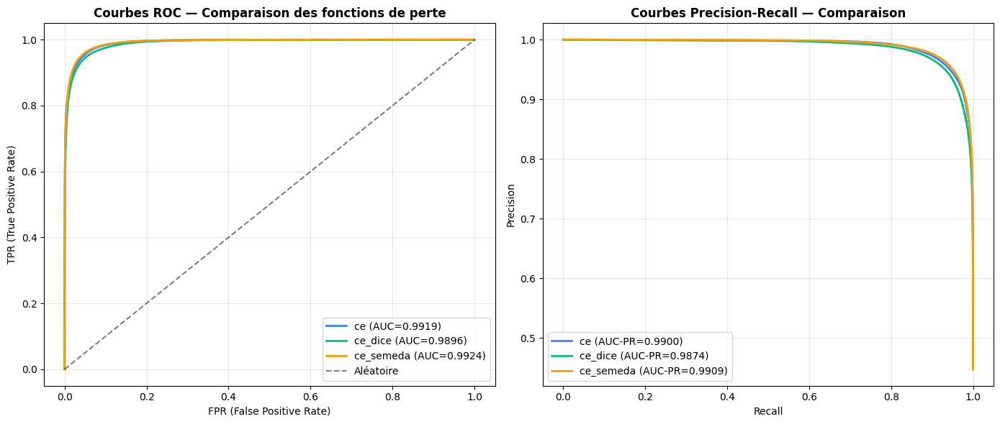

In [86]:
# === VISUALISATION COMPARATIVE DES 3 EXPÉRIENCES ===

def plot_section_7_comparison(section_7_results, save_dir=None):
    """
    Affiche les courbes ROC et PR des expériences disponibles côte à côte.

    Args:
        section_7_results : dict des métadonnées
        save_dir : dossier pour sauvegarder (défaut : FIGURES_DIR)
    """
    if not section_7_results:
        print(" Aucun résultat à afficher.")
        return

    # On a besoin de re-évaluer pour obtenir les courbes ROC/PR
    # (les métadonnées JSON ne contiennent que les métriques, pas les courbes)
    if save_dir is None:
        save_dir = FIGURES_DIR

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    colors = {'ce': '#3b82f6', 'ce_dice': '#10b981', 'ce_semeda': '#f59e0b'}

    print("Rechargement des modèles pour générer les courbes ROC/PR...")

    for name, meta in section_7_results.items():
        loss_name = meta['config']['loss']
        color = colors.get(loss_name, 'gray')

        # Reload du modèle
        backup_path = os.path.join(SINGLESPLIT_DIR, f"{name}_best.pth")
        if not os.path.exists(backup_path):
            print(f"  ⚠ Modèle introuvable pour {name}")
            continue

        model = UNet(in_channels=3, n_classes=N_CLASSES, base_channels=64).to(DEVICE)
        checkpoint = torch.load(backup_path, map_location=DEVICE)
        model.load_state_dict(checkpoint['state_dict'])
        model.eval()

        # Recréer le test loader
        test_ds = PosidoniaDataset(
            root_path=LOCAL_PATH, split="testing",
            img_h=meta['config']['img_h'], img_w=meta['config']['img_w'],
            augment=False, preprocess=meta['config'].get('preprocess'),
        )
        test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False)

        # Évaluer pour avoir les courbes
        test_results = evaluate_full(model, test_loader, device=DEVICE)

        # Plot ROC
        axes[0].plot(test_results['fpr'], test_results['tpr'],
                      label=f"{loss_name} (AUC={test_results['auc_roc']:.4f})",
                      color=color, linewidth=2)

        # Plot PR
        axes[1].plot(test_results['recall_curve'], test_results['precision_curve'],
                      label=f"{loss_name} (AUC-PR={test_results['auc_pr']:.4f})",
                      color=color, linewidth=2)

        print(f"   {name} traité")

        # Libérer la mémoire GPU
        del model
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    # Mise en forme des graphiques
    axes[0].plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Aléatoire')
    axes[0].set_xlabel('FPR (False Positive Rate)')
    axes[0].set_ylabel('TPR (True Positive Rate)')
    axes[0].set_title('Courbes ROC — Comparaison des fonctions de perte',
                       fontsize=12, fontweight='bold')
    axes[0].legend(loc='lower right')
    axes[0].grid(alpha=0.3)

    axes[1].set_xlabel('Recall')
    axes[1].set_ylabel('Precision')
    axes[1].set_title('Courbes Precision-Recall — Comparaison',
                       fontsize=12, fontweight='bold')
    axes[1].legend(loc='lower left')
    axes[1].grid(alpha=0.3)

    plt.tight_layout()

    save_path = os.path.join(save_dir, "section_7_loss_comparison.png")
    plt.savefig(save_path, dpi=120, bbox_inches='tight')
    print(f"\n Sauvegardé : {save_path}")
    plt.show()


# Lancer la comparaison visuelle (seulement si au moins une expérience est terminée)
if section_7_results:
    plot_section_7_comparison(section_7_results)
else:
    print("Aucune expérience disponible pour la visualisation comparative.")

# 8. Expériences : variation de la résolution

## 8.1 Objectif de la section

**Question scientifique** : La résolution des images a-t-elle un impact significatif
sur les performances de segmentation ?

### Contexte

Notre baseline jusqu'à présent est **352 × 480** (résolution intermédiaire).
Mais ce choix n'est pas anodin :
- Une résolution **plus faible** = moins de pixels à traiter = **plus rapide** + **moins de mémoire**
- Une résolution **plus haute** = plus de détails fins = **potentiellement meilleur** sur les bords

### Configurations testées

On garde **CE+SEMEDA** (meilleure loss identifiée en Section 7) et on fait varier
la résolution :

| Expérience | Résolution | Aspect ratio |
|---|---|---|
| **8.A** | 224 × 320 | 4:3 |
| **8.B** | 352 × 480 | 4:3 (= baseline 7.C) |
| **8.C** | 480 × 640 | 4:3 |

**Note** : on garde le **même aspect ratio (4:3)** pour que la comparaison soit
juste. Les images originales sont en 4:3.

**Note 2** : la résolution doit être un **multiple de 32** pour U-Net
(à cause des 4 niveaux de pooling : 2⁴ = 16, on prend 32 pour avoir une marge).

### Variables fixées

- Architecture : U-Net (~31M paramètres)
- Loss : CE+SEMEDA (meilleure de la Section 7)
- Augmentation : standard
- Prétraitement : aucun (sera étudié en Section 9)
- Learning rate : 1e-4
- Batch size : 8 (à ajuster si la mémoire GPU le requiert)
- Max epochs : 1000, patience : 10


### Critère de comparaison

Pour choisir la meilleure résolution, on regardera :
- **mIoU test** : la métrique principale
- **Trade-off mIoU vs coût computationnel** : si une résolution plus faible donne
  des résultats équivalents, c'est mieux (plus rapide, économise du GPU)

## 8.2 Configurations des expériences

Les configurations sont définies ici. Note importante : on **réutilise** 7C
(qui est déjà à 352×480 avec CE+SEMEDA) comme expérience centrale, pas besoin
de la relancer.

In [93]:
# === CONFIGURATIONS DES EXPÉRIENCES DE LA SECTION 8 ===

# Meilleure loss identifiée en Section 7
BEST_LOSS_SECTION_7 = "ce_semeda"

# Hyperparamètres communs à toutes les expériences de la section
COMMON_CONFIG_SECTION_8 = {
    'loss': BEST_LOSS_SECTION_7,
    'preprocess': None,
    'aug_strategy': 'standard',
    'lr': 1e-4,
    'n_epochs': 1000,
    'patience': 10,
    'weight_decay': 1e-4,
    'threshold_criterion': DEFAULT_THRESHOLD_CRITERION,
}

# Configurations spécifiques (variation de la résolution)
CONFIGS_SECTION_8 = {
    '8A_unet_ce_semeda_224x320': {
        **COMMON_CONFIG_SECTION_8,
        'name': '8A_unet_ce_semeda_224x320',
        'img_h': 224, 'img_w': 320,
        'batch_size': 8,
    },
    # 8B est équivalent à 7C (352×480 avec CE+SEMEDA), pas besoin de le relancer
    '8C_unet_ce_semeda_480x640': {
        **COMMON_CONFIG_SECTION_8,
        'name': '8C_unet_ce_semeda_480x640',
        'img_h': 480, 'img_w': 640,
        'batch_size': 4,  # ← batch réduit pour la mémoire GPU
    },
}

# Affichage récapitulatif
print("=== Configurations de la Section 8 ===\n")
print("  (8B est équivalent à 7C_unet_ce_semeda déjà entraîné en Section 7)")
print()
for name, cfg in CONFIGS_SECTION_8.items():
    print(f"  {name}:")
    print(f"    loss          : {cfg['loss']}")
    print(f"    resolution    : {cfg['img_h']}x{cfg['img_w']}")
    print(f"    batch_size    : {cfg['batch_size']}")
    print(f"    max_epochs    : {cfg['n_epochs']}")
    print()

=== Configurations de la Section 8 ===

  (8B est équivalent à 7C_unet_ce_semeda déjà entraîné en Section 7)

  8A_unet_ce_semeda_224x320:
    loss          : ce_semeda
    resolution    : 224x320
    batch_size    : 8
    max_epochs    : 1000

  8C_unet_ce_semeda_480x640:
    loss          : ce_semeda
    resolution    : 480x640
    batch_size    : 4
    max_epochs    : 1000



## 8.3 Lancement des expériences

Comme pour la Section 7 : décommentez la ligne `result = run_experiment(...)`
pour lancer une expérience.
Nous allons lancer 8.A (224x320) en premier (plus rapide). Puis, nous lancerons 8.C (480x640)

In [94]:
# ============================================================================
# EXPÉRIENCE 8.A : U-Net + CE+SEMEDA à 224×320
#
# Statut : à lancer
# Coût estimé : ~1-2 unités Colab (~15-20 min)
# Date de lancement : (à remplir)
# ============================================================================

config_8A = CONFIGS_SECTION_8['8A_unet_ce_semeda_224x320']
print(f"Config 8A : {config_8A['name']}")
print(f"  loss       : {config_8A['loss']}")
print(f"  resolution : {config_8A['img_h']}x{config_8A['img_w']}")
print(f"  batch_size : {config_8A['batch_size']}")

# === DÉCOMMENTER POUR LANCER ===
result_8A = run_experiment(config_8A, semeda_net=semeda_net, verbose=True)

Config 8A : 8A_unet_ce_semeda_224x320
  loss       : ce_semeda
  resolution : 224x320
  batch_size : 8

=== EXPÉRIENCE : 8A_unet_ce_semeda_224x320 ===
  Config : loss=ce_semeda, preprocess=None, aug=standard
           resolution=224×320, lr=0.0001, batch=8
           max_epochs=1000, patience=10
  [training/CSV] preprocess=None, aug='standard', images=300
  [training/CSV] preprocess=None, aug=False, images=76
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None

  Datasets : train=300, val=76, test=94
  Modèle : U-Net (31,043,586 paramètres)
  Loss : ce_semeda
=== Entraînement U-Net ===
  Max epochs : 1000 | Patience : 10 | Device : cuda
  Backup : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/8A_unet_ce_semeda_224x320_best.pth



Epoch   1/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:3504: UserWarning: nll_loss2d_forward_out_cuda_template does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return torch._C._nn.cross_entropy_loss(


Epoch   1/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   1/1000 | train: loss=0.6495 acc=0.7787 P=0.7378 R=0.7548 F1=0.7314 mIoU=0.6323
            | val:   loss=0.5861 acc=0.8519 P=0.8255 R=0.8511 F1=0.8335 mIoU=0.7400 * pat=0/10


Epoch   2/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   2/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   2/1000 | train: loss=0.5678 acc=0.8117 P=0.7731 R=0.8117 F1=0.7772 mIoU=0.6772
            | val:   loss=0.4088 acc=0.8745 P=0.8582 R=0.8656 F1=0.8576 mIoU=0.7753 * pat=0/10


Epoch   3/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   3/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   3/1000 | train: loss=0.5322 acc=0.8289 P=0.8083 R=0.8085 F1=0.8016 mIoU=0.7064
            | val:   loss=0.3755 acc=0.8926 P=0.8608 R=0.9029 F1=0.8794 mIoU=0.8032 * pat=0/10


Epoch   4/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   4/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   4/1000 | train: loss=0.5510 acc=0.8193 P=0.7928 R=0.8145 F1=0.7886 mIoU=0.6902
            | val:   loss=0.4017 acc=0.8817 P=0.8385 R=0.9035 F1=0.8681 mIoU=0.7859   pat=1/10


Epoch   5/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   5/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   5/1000 | train: loss=0.5369 acc=0.8262 P=0.7954 R=0.8139 F1=0.7966 mIoU=0.7027
            | val:   loss=0.3669 acc=0.8904 P=0.8518 R=0.9076 F1=0.8776 mIoU=0.8002 * pat=0/10


Epoch   6/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   6/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   6/1000 | train: loss=0.4787 acc=0.8506 P=0.8219 R=0.8469 F1=0.8262 mIoU=0.7365
            | val:   loss=0.3662 acc=0.8991 P=0.8410 R=0.9492 F1=0.8906 mIoU=0.8149 * pat=0/10


Epoch   7/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   7/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   7/1000 | train: loss=0.4786 acc=0.8472 P=0.8263 R=0.8328 F1=0.8198 mIoU=0.7301
            | val:   loss=0.3399 acc=0.9059 P=0.8555 R=0.9423 F1=0.8959 mIoU=0.8259 * pat=0/10


Epoch   8/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   8/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   8/1000 | train: loss=0.4574 acc=0.8600 P=0.8412 R=0.8477 F1=0.8354 mIoU=0.7483
            | val:   loss=0.4371 acc=0.8659 P=0.8190 R=0.8952 F1=0.8528 mIoU=0.7612   pat=1/10


Epoch   9/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch   9/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch   9/1000 | train: loss=0.4706 acc=0.8540 P=0.8282 R=0.8434 F1=0.8270 mIoU=0.7405
            | val:   loss=0.3391 acc=0.9030 P=0.8618 R=0.9266 F1=0.8920 mIoU=0.8206 * pat=0/10


Epoch  10/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  10/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  10/1000 | train: loss=0.4471 acc=0.8628 P=0.8485 R=0.8389 F1=0.8378 mIoU=0.7546
            | val:   loss=0.3323 acc=0.9047 P=0.9248 R=0.8511 F1=0.8856 mIoU=0.8209 * pat=0/10


Epoch  11/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  11/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  11/1000 | train: loss=0.4213 acc=0.8750 P=0.8558 R=0.8623 F1=0.8532 mIoU=0.7732
            | val:   loss=0.3183 acc=0.9118 P=0.8895 R=0.9129 F1=0.8996 mIoU=0.8351 * pat=0/10


Epoch  12/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  12/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  12/1000 | train: loss=0.4134 acc=0.8776 P=0.8612 R=0.8647 F1=0.8568 mIoU=0.7784
            | val:   loss=0.3157 acc=0.9162 P=0.9255 R=0.8810 F1=0.9017 mIoU=0.8417 * pat=0/10


Epoch  13/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  13/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  13/1000 | train: loss=0.3800 acc=0.8929 P=0.8817 R=0.8806 F1=0.8764 mIoU=0.8039
            | val:   loss=0.3243 acc=0.9084 P=0.9370 R=0.8474 F1=0.8896 mIoU=0.8267   pat=1/10


Epoch  14/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  14/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  14/1000 | train: loss=0.3770 acc=0.8903 P=0.8701 R=0.8839 F1=0.8720 mIoU=0.7985
            | val:   loss=0.3386 acc=0.9086 P=0.9258 R=0.8640 F1=0.8920 mIoU=0.8283   pat=2/10


Epoch  15/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  15/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  15/1000 | train: loss=0.3854 acc=0.8883 P=0.8616 R=0.8872 F1=0.8688 mIoU=0.7929
            | val:   loss=0.2858 acc=0.9216 P=0.9078 R=0.9152 F1=0.9102 mIoU=0.8515 * pat=0/10


Epoch  16/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  16/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  16/1000 | train: loss=0.3918 acc=0.8871 P=0.8667 R=0.8789 F1=0.8676 mIoU=0.7919
            | val:   loss=0.2841 acc=0.9286 P=0.9258 R=0.9125 F1=0.9181 mIoU=0.8637 * pat=0/10


Epoch  17/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  17/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  17/1000 | train: loss=0.3730 acc=0.8936 P=0.8630 R=0.8953 F1=0.8739 mIoU=0.8027
            | val:   loss=0.2916 acc=0.9209 P=0.8811 R=0.9467 F1=0.9120 mIoU=0.8512   pat=1/10


Epoch  18/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  18/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  18/1000 | train: loss=0.3520 acc=0.9006 P=0.8738 R=0.8962 F1=0.8780 mIoU=0.8120
            | val:   loss=0.2665 acc=0.9290 P=0.9334 R=0.9034 F1=0.9175 mIoU=0.8644 * pat=0/10


Epoch  19/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  19/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  19/1000 | train: loss=0.3178 acc=0.9139 P=0.9011 R=0.9027 F1=0.8988 mIoU=0.8374
            | val:   loss=0.2416 acc=0.9365 P=0.9424 R=0.9106 F1=0.9259 mIoU=0.8771 * pat=0/10


Epoch  20/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  20/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  20/1000 | train: loss=0.3209 acc=0.9117 P=0.8894 R=0.9100 F1=0.8962 mIoU=0.8334
            | val:   loss=0.3030 acc=0.9113 P=0.8457 R=0.9768 F1=0.9053 mIoU=0.8357   pat=1/10


Epoch  21/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  21/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  21/1000 | train: loss=0.3581 acc=0.8977 P=0.8580 R=0.9058 F1=0.8735 mIoU=0.8069
            | val:   loss=0.2490 acc=0.9335 P=0.9533 R=0.8948 F1=0.9226 mIoU=0.8724   pat=2/10


Epoch  22/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  22/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  22/1000 | train: loss=0.3250 acc=0.9108 P=0.8958 R=0.9040 F1=0.8958 mIoU=0.8312
            | val:   loss=0.2239 acc=0.9411 P=0.9213 R=0.9463 F1=0.9331 mIoU=0.8864 * pat=0/10


Epoch  23/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  23/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  23/1000 | train: loss=0.3081 acc=0.9169 P=0.8930 R=0.9171 F1=0.9023 mIoU=0.8427
            | val:   loss=0.2201 acc=0.9436 P=0.9285 R=0.9443 F1=0.9361 mIoU=0.8905 * pat=0/10


Epoch  24/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  24/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  24/1000 | train: loss=0.3063 acc=0.9161 P=0.8915 R=0.9162 F1=0.9013 mIoU=0.8406
            | val:   loss=0.2650 acc=0.9287 P=0.8843 R=0.9635 F1=0.9215 mIoU=0.8646   pat=1/10


Epoch  25/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  25/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  25/1000 | train: loss=0.2912 acc=0.9212 P=0.8995 R=0.9221 F1=0.9082 mIoU=0.8499
            | val:   loss=0.2390 acc=0.9367 P=0.9385 R=0.9170 F1=0.9270 mIoU=0.8779   pat=2/10


Epoch  26/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  26/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  26/1000 | train: loss=0.3082 acc=0.9174 P=0.9001 R=0.9079 F1=0.9014 mIoU=0.8423
            | val:   loss=0.2458 acc=0.9303 P=0.8818 R=0.9707 F1=0.9238 mIoU=0.8668   pat=3/10


Epoch  27/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  27/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  27/1000 | train: loss=0.2877 acc=0.9213 P=0.9005 R=0.9201 F1=0.9080 mIoU=0.8500
            | val:   loss=0.2191 acc=0.9421 P=0.9428 R=0.9245 F1=0.9333 mIoU=0.8876 * pat=0/10


Epoch  28/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  28/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  28/1000 | train: loss=0.2875 acc=0.9212 P=0.8998 R=0.9236 F1=0.9074 mIoU=0.8501
            | val:   loss=0.2036 acc=0.9468 P=0.9232 R=0.9572 F1=0.9396 mIoU=0.8965 * pat=0/10


Epoch  29/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  29/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  29/1000 | train: loss=0.2861 acc=0.9234 P=0.8992 R=0.9231 F1=0.9082 mIoU=0.8537
            | val:   loss=0.2535 acc=0.9314 P=0.9186 R=0.9262 F1=0.9214 mIoU=0.8693   pat=1/10


Epoch  30/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  30/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  30/1000 | train: loss=0.2714 acc=0.9287 P=0.9110 R=0.9247 F1=0.9154 mIoU=0.8633
            | val:   loss=0.2216 acc=0.9431 P=0.9363 R=0.9351 F1=0.9354 mIoU=0.8895   pat=2/10


Epoch  31/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  31/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  31/1000 | train: loss=0.2682 acc=0.9295 P=0.9100 R=0.9295 F1=0.9168 mIoU=0.8642
            | val:   loss=0.2018 acc=0.9473 P=0.9248 R=0.9573 F1=0.9406 mIoU=0.8970 * pat=0/10


Epoch  32/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  32/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  32/1000 | train: loss=0.2997 acc=0.9182 P=0.8995 R=0.9163 F1=0.9041 mIoU=0.8452
            | val:   loss=0.2361 acc=0.9371 P=0.9448 R=0.9106 F1=0.9268 mIoU=0.8785   pat=1/10


Epoch  33/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  33/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  33/1000 | train: loss=0.2869 acc=0.9232 P=0.8924 R=0.9313 F1=0.9081 mIoU=0.8519
            | val:   loss=0.2033 acc=0.9484 P=0.9392 R=0.9428 F1=0.9409 mIoU=0.8991   pat=2/10


Epoch  34/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  34/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  34/1000 | train: loss=0.2808 acc=0.9263 P=0.9059 R=0.9209 F1=0.9111 mIoU=0.8560
            | val:   loss=0.2115 acc=0.9428 P=0.9291 R=0.9421 F1=0.9352 mIoU=0.8893   pat=3/10


Epoch  35/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  35/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  35/1000 | train: loss=0.2537 acc=0.9341 P=0.9121 R=0.9343 F1=0.9209 mIoU=0.8722
            | val:   loss=0.2912 acc=0.9137 P=0.8448 R=0.9815 F1=0.9073 mIoU=0.8393   pat=4/10


Epoch  36/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  36/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  36/1000 | train: loss=0.2819 acc=0.9253 P=0.9184 R=0.9129 F1=0.9131 mIoU=0.8571
            | val:   loss=0.2235 acc=0.9396 P=0.9195 R=0.9436 F1=0.9310 mIoU=0.8834   pat=5/10


Epoch  37/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  37/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  37/1000 | train: loss=0.3090 acc=0.9127 P=0.8894 R=0.9140 F1=0.8966 mIoU=0.8349
            | val:   loss=0.2244 acc=0.9377 P=0.9332 R=0.9220 F1=0.9272 mIoU=0.8793   pat=6/10


Epoch  38/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  38/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  38/1000 | train: loss=0.2600 acc=0.9312 P=0.9142 R=0.9284 F1=0.9201 mIoU=0.8672
            | val:   loss=0.2115 acc=0.9454 P=0.9511 R=0.9245 F1=0.9374 mIoU=0.8931   pat=7/10


Epoch  39/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  39/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  39/1000 | train: loss=0.2515 acc=0.9347 P=0.9124 R=0.9326 F1=0.9200 mIoU=0.8714
            | val:   loss=0.2205 acc=0.9390 P=0.9216 R=0.9412 F1=0.9308 mIoU=0.8824   pat=8/10


Epoch  40/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  40/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  40/1000 | train: loss=0.2458 acc=0.9360 P=0.9218 R=0.9280 F1=0.9234 mIoU=0.8744
            | val:   loss=0.1920 acc=0.9508 P=0.9309 R=0.9602 F1=0.9451 mIoU=0.9037 * pat=0/10


Epoch  41/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  41/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  41/1000 | train: loss=0.2276 acc=0.9425 P=0.9184 R=0.9444 F1=0.9299 mIoU=0.8855
            | val:   loss=0.1909 acc=0.9530 P=0.9536 R=0.9385 F1=0.9459 mIoU=0.9074 * pat=0/10


Epoch  42/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  42/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  42/1000 | train: loss=0.2436 acc=0.9360 P=0.9224 R=0.9324 F1=0.9259 mIoU=0.8771
            | val:   loss=0.2136 acc=0.9447 P=0.9316 R=0.9426 F1=0.9369 mIoU=0.8920   pat=1/10


Epoch  43/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  43/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  43/1000 | train: loss=0.2549 acc=0.9341 P=0.9180 R=0.9302 F1=0.9224 mIoU=0.8707
            | val:   loss=0.2283 acc=0.9397 P=0.9728 R=0.8896 F1=0.9292 mIoU=0.8827   pat=2/10


Epoch  44/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  44/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  44/1000 | train: loss=0.2501 acc=0.9356 P=0.9104 R=0.9322 F1=0.9187 mIoU=0.8723
            | val:   loss=0.2225 acc=0.9422 P=0.9095 R=0.9634 F1=0.9353 mIoU=0.8881   pat=3/10


Epoch  45/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  45/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  45/1000 | train: loss=0.2428 acc=0.9386 P=0.9192 R=0.9377 F1=0.9270 mIoU=0.8801
            | val:   loss=0.1864 acc=0.9512 P=0.9281 R=0.9616 F1=0.9444 mIoU=0.9044 * pat=0/10


Epoch  46/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  46/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  46/1000 | train: loss=0.2276 acc=0.9439 P=0.9245 R=0.9422 F1=0.9317 mIoU=0.8882
            | val:   loss=0.2091 acc=0.9434 P=0.9060 R=0.9707 F1=0.9367 mIoU=0.8911   pat=1/10


Epoch  47/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  47/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  47/1000 | train: loss=0.2608 acc=0.9330 P=0.9029 R=0.9341 F1=0.9150 mIoU=0.8667
            | val:   loss=0.2908 acc=0.9208 P=0.8564 R=0.9860 F1=0.9158 mIoU=0.8511   pat=2/10


Epoch  48/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  48/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  48/1000 | train: loss=0.2640 acc=0.9303 P=0.9121 R=0.9235 F1=0.9157 mIoU=0.8617
            | val:   loss=0.2001 acc=0.9460 P=0.9265 R=0.9518 F1=0.9387 mIoU=0.8948   pat=3/10


Epoch  49/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  49/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  49/1000 | train: loss=0.2366 acc=0.9407 P=0.9212 R=0.9382 F1=0.9285 mIoU=0.8833
            | val:   loss=0.2027 acc=0.9449 P=0.9309 R=0.9444 F1=0.9373 mIoU=0.8929   pat=4/10


Epoch  50/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  50/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  50/1000 | train: loss=0.2351 acc=0.9396 P=0.9223 R=0.9342 F1=0.9268 mIoU=0.8801
            | val:   loss=0.1873 acc=0.9506 P=0.9309 R=0.9580 F1=0.9442 mIoU=0.9032   pat=5/10


Epoch  51/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  51/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  51/1000 | train: loss=0.2151 acc=0.9466 P=0.9288 R=0.9423 F1=0.9347 mIoU=0.8921
            | val:   loss=0.1888 acc=0.9484 P=0.9139 R=0.9728 F1=0.9422 mIoU=0.8995   pat=6/10


Epoch  52/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  52/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  52/1000 | train: loss=0.2100 acc=0.9475 P=0.9301 R=0.9451 F1=0.9369 mIoU=0.8949
            | val:   loss=0.1934 acc=0.9488 P=0.9366 R=0.9476 F1=0.9418 mIoU=0.8997   pat=7/10


Epoch  53/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  53/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  53/1000 | train: loss=0.2412 acc=0.9381 P=0.9168 R=0.9353 F1=0.9248 mIoU=0.8767
            | val:   loss=0.2235 acc=0.9385 P=0.9037 R=0.9617 F1=0.9313 mIoU=0.8817   pat=8/10


Epoch  54/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  54/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  54/1000 | train: loss=0.2390 acc=0.9382 P=0.9273 R=0.9304 F1=0.9271 mIoU=0.8792
            | val:   loss=0.1915 acc=0.9501 P=0.9696 R=0.9166 F1=0.9423 mIoU=0.9020   pat=9/10


Epoch  55/1000 [train]:   0%|                                                | 0/38 [00:00<?, ?it/s]

Epoch  55/1000 [val]  :   0%|                                                | 0/10 [00:00<?, ?it/s]

  Epoch  55/1000 | train: loss=0.2556 acc=0.9306 P=0.9081 R=0.9333 F1=0.9187 mIoU=0.8662
            | val:   loss=0.2026 acc=0.9468 P=0.9632 R=0.9147 F1=0.9382 mIoU=0.8958   pat=10/10

  >>> Early stopping à l'epoch 55

   Entraînement terminé : best epoch = 45, best val_loss = 0.1864
    Au best epoch : acc=0.9512, P=0.9281, R=0.9616, F1=0.9444, mIoU=0.9044

  Évaluation sur val et test...
  VAL  : acc=0.9523, P=0.9316, R=0.9626, F1=0.9469, dice=0.9469, mIoU=0.9081, seuil=0.50
  TEST : acc=0.9540, P=0.9374, R=0.9615, F1=0.9493, dice=0.9493, mIoU=0.9114, seuil=0.40
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/8A_unet_ce_semeda_224x320_summary.png
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/8A_unet_ce_semeda_224x320_confusion.png

  Sauvegardé :
    Modèle : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidon

In [95]:
# ============================================================================
# EXPÉRIENCE 8.C : U-Net + CE+SEMEDA à 480×640
#
# Statut : à lancer
# Coût estimé : ~3-4 unités Colab (~45-50 min)
# Date de lancement : (à remplir)
#
# ATTENTION : batch_size=4 (au lieu de 8) à cause de la mémoire GPU
# Si vous voyez "CUDA out of memory", réduisez encore (batch_size=2)
# ============================================================================

config_8C = CONFIGS_SECTION_8['8C_unet_ce_semeda_480x640']
print(f"Config 8C : {config_8C['name']}")
print(f"  loss       : {config_8C['loss']}")
print(f"  resolution : {config_8C['img_h']}×{config_8C['img_w']}")
print(f"  batch_size : {config_8C['batch_size']}")

# === DÉCOMMENTER POUR LANCER ===
result_8C = run_experiment(config_8C, semeda_net=semeda_net, verbose=True)

Config 8C : 8C_unet_ce_semeda_480x640
  loss       : ce_semeda
  resolution : 480×640
  batch_size : 4

=== EXPÉRIENCE : 8C_unet_ce_semeda_480x640 ===
  Config : loss=ce_semeda, preprocess=None, aug=standard
           resolution=480×640, lr=0.0001, batch=4
           max_epochs=1000, patience=10
  [training/CSV] preprocess=None, aug='standard', images=300
  [training/CSV] preprocess=None, aug=False, images=76
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None

  Datasets : train=300, val=76, test=94
  Modèle : U-Net (31,043,586 paramètres)
  Loss : ce_semeda
=== Entraînement U-Net ===
  Max epochs : 1000 | Patience : 10 | Device : cuda
  Backup : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/8C_unet_ce_semeda_480x640_best.pth



Epoch   1/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:3504: UserWarning: nll_loss2d_forward_out_cuda_template does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)
  return torch._C._nn.cross_entropy_loss(


Epoch   1/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   1/1000 | train: loss=0.6156 acc=0.7857 P=0.7493 R=0.7725 F1=0.7393 mIoU=0.6417
            | val:   loss=0.4544 acc=0.8551 P=0.8620 R=0.8094 F1=0.8254 mIoU=0.7412 * pat=0/10


Epoch   2/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch   2/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   2/1000 | train: loss=0.5918 acc=0.7910 P=0.7614 R=0.7812 F1=0.7481 mIoU=0.6481
            | val:   loss=0.4478 acc=0.8574 P=0.8346 R=0.8582 F1=0.8370 mIoU=0.7469 * pat=0/10


Epoch   3/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch   3/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   3/1000 | train: loss=0.5725 acc=0.8030 P=0.7702 R=0.7823 F1=0.7618 mIoU=0.6665
            | val:   loss=0.4199 acc=0.8660 P=0.8685 R=0.8279 F1=0.8410 mIoU=0.7586 * pat=0/10


Epoch   4/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch   4/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   4/1000 | train: loss=0.5613 acc=0.8011 P=0.7675 R=0.7970 F1=0.7584 mIoU=0.6629
            | val:   loss=0.4020 acc=0.8720 P=0.8801 R=0.8309 F1=0.8474 mIoU=0.7690 * pat=0/10


Epoch   5/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch   5/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   5/1000 | train: loss=0.5660 acc=0.8024 P=0.7807 R=0.7697 F1=0.7601 mIoU=0.6645
            | val:   loss=0.3975 acc=0.8731 P=0.8686 R=0.8484 F1=0.8518 mIoU=0.7712 * pat=0/10


Epoch   6/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch   6/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   6/1000 | train: loss=0.5441 acc=0.8097 P=0.7729 R=0.8125 F1=0.7691 mIoU=0.6736
            | val:   loss=0.3879 acc=0.8765 P=0.8463 R=0.8857 F1=0.8600 mIoU=0.7764 * pat=0/10


Epoch   7/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch   7/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   7/1000 | train: loss=0.5309 acc=0.8154 P=0.7869 R=0.7909 F1=0.7721 mIoU=0.6819
            | val:   loss=0.3800 acc=0.8775 P=0.8785 R=0.8481 F1=0.8557 mIoU=0.7786 * pat=0/10


Epoch   8/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch   8/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   8/1000 | train: loss=0.5701 acc=0.8014 P=0.7812 R=0.7635 F1=0.7516 mIoU=0.6600
            | val:   loss=0.3870 acc=0.8684 P=0.9198 R=0.7834 F1=0.8341 mIoU=0.7653   pat=1/10


Epoch   9/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch   9/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch   9/1000 | train: loss=0.5216 acc=0.8170 P=0.7945 R=0.7956 F1=0.7753 mIoU=0.6831
            | val:   loss=0.3925 acc=0.8754 P=0.8436 R=0.8846 F1=0.8583 mIoU=0.7740   pat=2/10


Epoch  10/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  10/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  10/1000 | train: loss=0.5475 acc=0.8077 P=0.7804 R=0.7832 F1=0.7604 mIoU=0.6687
            | val:   loss=0.3861 acc=0.8764 P=0.8322 R=0.9000 F1=0.8607 mIoU=0.7751   pat=3/10


Epoch  11/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  11/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  11/1000 | train: loss=0.4972 acc=0.8301 P=0.8120 R=0.8040 F1=0.7932 mIoU=0.7044
            | val:   loss=0.3457 acc=0.8987 P=0.8929 R=0.8783 F1=0.8820 mIoU=0.8116 * pat=0/10


Epoch  12/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  12/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  12/1000 | train: loss=0.5158 acc=0.8279 P=0.8117 R=0.7961 F1=0.7888 mIoU=0.7027
            | val:   loss=0.3453 acc=0.8921 P=0.9088 R=0.8436 F1=0.8712 mIoU=0.8003 * pat=0/10


Epoch  13/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  13/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  13/1000 | train: loss=0.4901 acc=0.8338 P=0.8121 R=0.8120 F1=0.7985 mIoU=0.7101
            | val:   loss=0.3364 acc=0.8945 P=0.8595 R=0.9100 F1=0.8815 mIoU=0.8046 * pat=0/10


Epoch  14/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  14/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  14/1000 | train: loss=0.5069 acc=0.8271 P=0.8152 R=0.7960 F1=0.7889 mIoU=0.7001
            | val:   loss=0.4859 acc=0.8185 P=0.9192 R=0.6600 F1=0.7583 mIoU=0.6818   pat=1/10


Epoch  15/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  15/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  15/1000 | train: loss=0.4858 acc=0.8382 P=0.8170 R=0.8127 F1=0.8026 mIoU=0.7160
            | val:   loss=0.3309 acc=0.9019 P=0.9034 R=0.8761 F1=0.8856 mIoU=0.8180 * pat=0/10


Epoch  16/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  16/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  16/1000 | train: loss=0.4979 acc=0.8366 P=0.8205 R=0.8055 F1=0.7912 mIoU=0.7090
            | val:   loss=0.3355 acc=0.9087 P=0.9020 R=0.8911 F1=0.8941 mIoU=0.8282   pat=1/10


Epoch  17/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  17/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  17/1000 | train: loss=0.4804 acc=0.8407 P=0.8157 R=0.8312 F1=0.8059 mIoU=0.7206
            | val:   loss=0.3561 acc=0.8851 P=0.8558 R=0.8886 F1=0.8685 mIoU=0.7884   pat=2/10


Epoch  18/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  18/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  18/1000 | train: loss=0.4578 acc=0.8535 P=0.8253 R=0.8412 F1=0.8183 mIoU=0.7374
            | val:   loss=0.3047 acc=0.9120 P=0.9027 R=0.8991 F1=0.8985 mIoU=0.8336 * pat=0/10


Epoch  19/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  19/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  19/1000 | train: loss=0.4706 acc=0.8440 P=0.8254 R=0.8184 F1=0.8075 mIoU=0.7240
            | val:   loss=0.3440 acc=0.8969 P=0.9242 R=0.8417 F1=0.8769 mIoU=0.8096   pat=1/10


Epoch  20/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  20/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  20/1000 | train: loss=0.4261 acc=0.8592 P=0.8357 R=0.8396 F1=0.8254 mIoU=0.7475
            | val:   loss=0.2984 acc=0.9094 P=0.8640 R=0.9384 F1=0.8977 mIoU=0.8292 * pat=0/10


Epoch  21/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  21/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  21/1000 | train: loss=0.4534 acc=0.8506 P=0.8158 R=0.8426 F1=0.8076 mIoU=0.7285
            | val:   loss=0.4378 acc=0.8620 P=0.7660 R=0.9767 F1=0.8550 mIoU=0.7540   pat=1/10


Epoch  22/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  22/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  22/1000 | train: loss=0.4234 acc=0.8640 P=0.8419 R=0.8549 F1=0.8331 mIoU=0.7542
            | val:   loss=0.3233 acc=0.9048 P=0.8577 R=0.9371 F1=0.8936 mIoU=0.8211   pat=2/10


Epoch  23/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  23/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  23/1000 | train: loss=0.4282 acc=0.8565 P=0.8304 R=0.8486 F1=0.8268 mIoU=0.7468
            | val:   loss=0.3007 acc=0.9161 P=0.9173 R=0.8919 F1=0.9024 mIoU=0.8407   pat=3/10


Epoch  24/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  24/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  24/1000 | train: loss=0.3983 acc=0.8694 P=0.8534 R=0.8552 F1=0.8439 mIoU=0.7628
            | val:   loss=0.3037 acc=0.9168 P=0.9089 R=0.9012 F1=0.9029 mIoU=0.8414   pat=4/10


Epoch  25/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  25/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  25/1000 | train: loss=0.4431 acc=0.8551 P=0.8370 R=0.8367 F1=0.8226 mIoU=0.7414
            | val:   loss=0.4108 acc=0.8796 P=0.7947 R=0.9700 F1=0.8707 mIoU=0.7812   pat=5/10


Epoch  26/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  26/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  26/1000 | train: loss=0.4560 acc=0.8511 P=0.8300 R=0.8273 F1=0.8102 mIoU=0.7327
            | val:   loss=0.3035 acc=0.9179 P=0.8951 R=0.9210 F1=0.9059 mIoU=0.8435   pat=6/10


Epoch  27/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  27/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  27/1000 | train: loss=0.3945 acc=0.8751 P=0.8544 R=0.8694 F1=0.8517 mIoU=0.7752
            | val:   loss=0.4003 acc=0.8591 P=0.9358 R=0.7463 F1=0.8204 mIoU=0.7486   pat=7/10


Epoch  28/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  28/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  28/1000 | train: loss=0.4183 acc=0.8609 P=0.8429 R=0.8442 F1=0.8290 mIoU=0.7489
            | val:   loss=0.3628 acc=0.8813 P=0.8319 R=0.9172 F1=0.8678 mIoU=0.7852   pat=8/10


Epoch  29/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  29/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  29/1000 | train: loss=0.4035 acc=0.8727 P=0.8356 R=0.8649 F1=0.8388 mIoU=0.7640
            | val:   loss=0.2761 acc=0.9210 P=0.9090 R=0.9151 F1=0.9104 mIoU=0.8499 * pat=0/10


Epoch  30/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  30/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  30/1000 | train: loss=0.3766 acc=0.8828 P=0.8645 R=0.8612 F1=0.8543 mIoU=0.7835
            | val:   loss=0.2648 acc=0.9255 P=0.9057 R=0.9287 F1=0.9157 mIoU=0.8573 * pat=0/10


Epoch  31/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  31/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  31/1000 | train: loss=0.3910 acc=0.8746 P=0.8455 R=0.8743 F1=0.8474 mIoU=0.7688
            | val:   loss=0.2673 acc=0.9238 P=0.9043 R=0.9256 F1=0.9128 mIoU=0.8542   pat=1/10


Epoch  32/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  32/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  32/1000 | train: loss=0.3694 acc=0.8837 P=0.8584 R=0.8755 F1=0.8582 mIoU=0.7850
            | val:   loss=0.2703 acc=0.9215 P=0.8747 R=0.9553 F1=0.9118 mIoU=0.8499   pat=2/10


Epoch  33/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  33/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  33/1000 | train: loss=0.3757 acc=0.8813 P=0.8423 R=0.8845 F1=0.8488 mIoU=0.7785
            | val:   loss=0.2752 acc=0.9205 P=0.9190 R=0.9019 F1=0.9075 mIoU=0.8491   pat=3/10


Epoch  34/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  34/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  34/1000 | train: loss=0.3967 acc=0.8717 P=0.8444 R=0.8599 F1=0.8402 mIoU=0.7632
            | val:   loss=0.2834 acc=0.9187 P=0.8634 R=0.9632 F1=0.9091 mIoU=0.8453   pat=4/10


Epoch  35/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  35/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  35/1000 | train: loss=0.3357 acc=0.8984 P=0.8788 R=0.8881 F1=0.8762 mIoU=0.8095
            | val:   loss=0.2593 acc=0.9290 P=0.9231 R=0.9175 F1=0.9191 mIoU=0.8635 * pat=0/10


Epoch  36/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  36/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  36/1000 | train: loss=0.3409 acc=0.8959 P=0.8798 R=0.8793 F1=0.8714 mIoU=0.8021
            | val:   loss=0.2639 acc=0.9259 P=0.9248 R=0.9037 F1=0.9128 mIoU=0.8566   pat=1/10


Epoch  37/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  37/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  37/1000 | train: loss=0.3483 acc=0.8911 P=0.8686 R=0.8893 F1=0.8678 mIoU=0.7959
            | val:   loss=0.2608 acc=0.9292 P=0.8951 R=0.9503 F1=0.9205 mIoU=0.8640   pat=2/10


Epoch  38/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  38/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  38/1000 | train: loss=0.3479 acc=0.8937 P=0.8654 R=0.8876 F1=0.8638 mIoU=0.7972
            | val:   loss=0.3106 acc=0.9062 P=0.8429 R=0.9624 F1=0.8965 mIoU=0.8246   pat=3/10


Epoch  39/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  39/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  39/1000 | train: loss=0.3505 acc=0.8905 P=0.8513 R=0.8892 F1=0.8541 mIoU=0.7915
            | val:   loss=0.3289 acc=0.9026 P=0.8277 R=0.9786 F1=0.8949 mIoU=0.8181   pat=4/10


Epoch  40/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  40/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  40/1000 | train: loss=0.3494 acc=0.8948 P=0.8757 R=0.8798 F1=0.8689 mIoU=0.7998
            | val:   loss=0.2602 acc=0.9292 P=0.9000 R=0.9448 F1=0.9206 mIoU=0.8638   pat=5/10


Epoch  41/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  41/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  41/1000 | train: loss=0.3423 acc=0.8970 P=0.8663 R=0.8953 F1=0.8698 mIoU=0.8022
            | val:   loss=0.3370 acc=0.8861 P=0.8750 R=0.8702 F1=0.8659 mIoU=0.7919   pat=6/10


Epoch  42/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  42/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  42/1000 | train: loss=0.3085 acc=0.9091 P=0.8837 R=0.8979 F1=0.8833 mIoU=0.8259
            | val:   loss=0.2465 acc=0.9288 P=0.8945 R=0.9481 F1=0.9189 mIoU=0.8627 * pat=0/10


Epoch  43/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  43/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  43/1000 | train: loss=0.3188 acc=0.9029 P=0.8823 R=0.8943 F1=0.8815 mIoU=0.8150
            | val:   loss=0.2322 acc=0.9388 P=0.9248 R=0.9360 F1=0.9298 mIoU=0.8800 * pat=0/10


Epoch  44/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  44/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  44/1000 | train: loss=0.2901 acc=0.9147 P=0.8842 R=0.9100 F1=0.8881 mIoU=0.8318
            | val:   loss=0.2905 acc=0.9230 P=0.9518 R=0.8713 F1=0.9086 mIoU=0.8512   pat=1/10


Epoch  45/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  45/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  45/1000 | train: loss=0.3116 acc=0.9069 P=0.8854 R=0.8941 F1=0.8819 mIoU=0.8209
            | val:   loss=0.2381 acc=0.9297 P=0.8858 R=0.9583 F1=0.9196 mIoU=0.8635   pat=2/10


Epoch  46/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  46/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  46/1000 | train: loss=0.3194 acc=0.9046 P=0.8721 R=0.9029 F1=0.8755 mIoU=0.8141
            | val:   loss=0.2560 acc=0.9249 P=0.8709 R=0.9683 F1=0.9154 mIoU=0.8563   pat=3/10


Epoch  47/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  47/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  47/1000 | train: loss=0.3177 acc=0.9091 P=0.8826 R=0.9016 F1=0.8814 mIoU=0.8220
            | val:   loss=0.3747 acc=0.8879 P=0.8012 R=0.9859 F1=0.8818 mIoU=0.7937   pat=4/10


Epoch  48/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  48/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  48/1000 | train: loss=0.3096 acc=0.9071 P=0.8739 R=0.9007 F1=0.8799 mIoU=0.8151
            | val:   loss=0.2422 acc=0.9314 P=0.8820 R=0.9709 F1=0.9233 mIoU=0.8673   pat=5/10


Epoch  49/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  49/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  49/1000 | train: loss=0.2770 acc=0.9212 P=0.8953 R=0.9149 F1=0.8982 mIoU=0.8441
            | val:   loss=0.2194 acc=0.9357 P=0.9312 R=0.9189 F1=0.9244 mIoU=0.8734 * pat=0/10


Epoch  50/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  50/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  50/1000 | train: loss=0.2812 acc=0.9193 P=0.8957 R=0.9099 F1=0.8943 mIoU=0.8411
            | val:   loss=0.2518 acc=0.9313 P=0.8927 R=0.9568 F1=0.9222 mIoU=0.8672   pat=1/10


Epoch  51/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  51/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  51/1000 | train: loss=0.2821 acc=0.9175 P=0.8881 R=0.9126 F1=0.8927 mIoU=0.8361
            | val:   loss=0.2372 acc=0.9361 P=0.9229 R=0.9325 F1=0.9266 mIoU=0.8757   pat=2/10


Epoch  52/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  52/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  52/1000 | train: loss=0.2687 acc=0.9202 P=0.8890 R=0.9150 F1=0.8938 mIoU=0.8401
            | val:   loss=0.2945 acc=0.9086 P=0.8539 R=0.9525 F1=0.8976 mIoU=0.8286   pat=3/10


Epoch  53/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  53/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  53/1000 | train: loss=0.2649 acc=0.9242 P=0.8997 R=0.9184 F1=0.9043 mIoU=0.8484
            | val:   loss=0.2117 acc=0.9391 P=0.9049 R=0.9591 F1=0.9299 mIoU=0.8809 * pat=0/10


Epoch  54/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  54/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  54/1000 | train: loss=0.2839 acc=0.9156 P=0.8973 R=0.9029 F1=0.8935 mIoU=0.8369
            | val:   loss=0.2191 acc=0.9451 P=0.9423 R=0.9338 F1=0.9376 mIoU=0.8917   pat=1/10


Epoch  55/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  55/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  55/1000 | train: loss=0.2542 acc=0.9252 P=0.9017 R=0.9221 F1=0.9080 mIoU=0.8526
            | val:   loss=0.2165 acc=0.9374 P=0.8942 R=0.9676 F1=0.9286 mIoU=0.8777   pat=2/10


Epoch  56/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  56/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  56/1000 | train: loss=0.2437 acc=0.9295 P=0.9040 R=0.9236 F1=0.9104 mIoU=0.8581
            | val:   loss=0.2801 acc=0.9164 P=0.8595 R=0.9602 F1=0.9051 mIoU=0.8412   pat=3/10


Epoch  57/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  57/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  57/1000 | train: loss=0.2526 acc=0.9291 P=0.9126 R=0.9151 F1=0.9099 mIoU=0.8556
            | val:   loss=0.2108 acc=0.9414 P=0.9359 R=0.9305 F1=0.9324 mIoU=0.8845 * pat=0/10


Epoch  58/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  58/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  58/1000 | train: loss=0.2648 acc=0.9212 P=0.8913 R=0.9157 F1=0.8955 mIoU=0.8408
            | val:   loss=0.3572 acc=0.8844 P=0.8035 R=0.9703 F1=0.8741 mIoU=0.7914   pat=1/10


Epoch  59/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  59/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  59/1000 | train: loss=0.2912 acc=0.9140 P=0.8846 R=0.9046 F1=0.8810 mIoU=0.8265
            | val:   loss=0.2224 acc=0.9429 P=0.9221 R=0.9484 F1=0.9345 mIoU=0.8875   pat=2/10


Epoch  60/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  60/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  60/1000 | train: loss=0.2393 acc=0.9309 P=0.9109 R=0.9208 F1=0.9134 mIoU=0.8603
            | val:   loss=0.2065 acc=0.9376 P=0.9146 R=0.9459 F1=0.9293 mIoU=0.8780 * pat=0/10


Epoch  61/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  61/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  61/1000 | train: loss=0.2495 acc=0.9271 P=0.9046 R=0.9193 F1=0.9072 mIoU=0.8541
            | val:   loss=0.6396 acc=0.7899 P=0.7016 R=0.9696 F1=0.8009 mIoU=0.6627   pat=1/10


Epoch  62/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  62/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  62/1000 | train: loss=0.2465 acc=0.9281 P=0.9078 R=0.9234 F1=0.9114 mIoU=0.8571
            | val:   loss=0.2083 acc=0.9407 P=0.9145 R=0.9502 F1=0.9312 mIoU=0.8829   pat=2/10


Epoch  63/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  63/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  63/1000 | train: loss=0.2512 acc=0.9272 P=0.9041 R=0.9206 F1=0.9080 mIoU=0.8518
            | val:   loss=0.2434 acc=0.9283 P=0.8916 R=0.9504 F1=0.9181 mIoU=0.8618   pat=3/10


Epoch  64/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  64/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  64/1000 | train: loss=0.2742 acc=0.9175 P=0.8895 R=0.9089 F1=0.8927 mIoU=0.8355
            | val:   loss=0.2124 acc=0.9439 P=0.9396 R=0.9332 F1=0.9357 mIoU=0.8894   pat=4/10


Epoch  65/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  65/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  65/1000 | train: loss=0.2759 acc=0.9161 P=0.8909 R=0.9110 F1=0.8929 mIoU=0.8349
            | val:   loss=0.1886 acc=0.9454 P=0.9482 R=0.9271 F1=0.9368 mIoU=0.8920 * pat=0/10


Epoch  66/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  66/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  66/1000 | train: loss=0.2566 acc=0.9266 P=0.9004 R=0.9159 F1=0.9004 mIoU=0.8504
            | val:   loss=0.2083 acc=0.9405 P=0.8992 R=0.9699 F1=0.9323 mIoU=0.8832   pat=1/10


Epoch  67/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  67/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  67/1000 | train: loss=0.2540 acc=0.9244 P=0.8985 R=0.9207 F1=0.9032 mIoU=0.8490
            | val:   loss=0.2619 acc=0.9276 P=0.8820 R=0.9602 F1=0.9182 mIoU=0.8605   pat=2/10


Epoch  68/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  68/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  68/1000 | train: loss=0.2217 acc=0.9353 P=0.9222 R=0.9248 F1=0.9211 mIoU=0.8714
            | val:   loss=0.1930 acc=0.9432 P=0.9104 R=0.9627 F1=0.9348 mIoU=0.8886   pat=3/10


Epoch  69/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  69/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  69/1000 | train: loss=0.2441 acc=0.9286 P=0.9100 R=0.9191 F1=0.9095 mIoU=0.8578
            | val:   loss=0.2119 acc=0.9411 P=0.9025 R=0.9679 F1=0.9332 mIoU=0.8844   pat=4/10


Epoch  70/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  70/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  70/1000 | train: loss=0.2501 acc=0.9277 P=0.9016 R=0.9231 F1=0.9071 mIoU=0.8523
            | val:   loss=0.2404 acc=0.9316 P=0.9189 R=0.9248 F1=0.9205 mIoU=0.8670   pat=5/10


Epoch  71/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  71/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  71/1000 | train: loss=0.2480 acc=0.9274 P=0.9054 R=0.9199 F1=0.9065 mIoU=0.8545
            | val:   loss=0.2118 acc=0.9416 P=0.9253 R=0.9443 F1=0.9339 mIoU=0.8856   pat=6/10


Epoch  72/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  72/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  72/1000 | train: loss=0.2339 acc=0.9316 P=0.9028 R=0.9272 F1=0.9095 mIoU=0.8602
            | val:   loss=0.2252 acc=0.9350 P=0.8846 R=0.9755 F1=0.9268 mIoU=0.8736   pat=7/10


Epoch  73/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  73/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  73/1000 | train: loss=0.1927 acc=0.9460 P=0.9261 R=0.9383 F1=0.9299 mIoU=0.8879
            | val:   loss=0.1715 acc=0.9497 P=0.9228 R=0.9627 F1=0.9418 mIoU=0.8998 * pat=0/10


Epoch  74/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  74/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  74/1000 | train: loss=0.2283 acc=0.9329 P=0.9105 R=0.9235 F1=0.9135 mIoU=0.8643
            | val:   loss=0.1788 acc=0.9474 P=0.9233 R=0.9582 F1=0.9394 mIoU=0.8959   pat=1/10


Epoch  75/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  75/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  75/1000 | train: loss=0.2043 acc=0.9408 P=0.9194 R=0.9345 F1=0.9250 mIoU=0.8782
            | val:   loss=0.1692 acc=0.9511 P=0.9517 R=0.9390 F1=0.9450 mIoU=0.9032 * pat=0/10


Epoch  76/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  76/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  76/1000 | train: loss=0.1997 acc=0.9431 P=0.9289 R=0.9326 F1=0.9295 mIoU=0.8831
            | val:   loss=0.1568 acc=0.9554 P=0.9478 R=0.9523 F1=0.9498 mIoU=0.9110 * pat=0/10


Epoch  77/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  77/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  77/1000 | train: loss=0.2288 acc=0.9334 P=0.9128 R=0.9270 F1=0.9140 mIoU=0.8654
            | val:   loss=0.1715 acc=0.9511 P=0.9323 R=0.9567 F1=0.9440 mIoU=0.9027   pat=1/10


Epoch  78/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  78/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  78/1000 | train: loss=0.2687 acc=0.9183 P=0.8965 R=0.9130 F1=0.9003 mIoU=0.8417
            | val:   loss=0.3082 acc=0.9049 P=0.8386 R=0.9625 F1=0.8950 mIoU=0.8206   pat=2/10


Epoch  79/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  79/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  79/1000 | train: loss=0.2432 acc=0.9271 P=0.9066 R=0.9220 F1=0.9109 mIoU=0.8539
            | val:   loss=0.1998 acc=0.9446 P=0.9195 R=0.9560 F1=0.9367 mIoU=0.8906   pat=3/10


Epoch  80/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  80/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  80/1000 | train: loss=0.2247 acc=0.9353 P=0.9079 R=0.9306 F1=0.9151 mIoU=0.8663
            | val:   loss=0.2740 acc=0.9136 P=0.8424 R=0.9830 F1=0.9055 mIoU=0.8369   pat=4/10


Epoch  81/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  81/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  81/1000 | train: loss=0.2111 acc=0.9399 P=0.9179 R=0.9323 F1=0.9226 mIoU=0.8740
            | val:   loss=0.1662 acc=0.9535 P=0.9392 R=0.9546 F1=0.9465 mIoU=0.9070   pat=5/10


Epoch  82/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  82/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  82/1000 | train: loss=0.1952 acc=0.9438 P=0.9243 R=0.9359 F1=0.9289 mIoU=0.8833
            | val:   loss=0.1545 acc=0.9556 P=0.9435 R=0.9571 F1=0.9501 mIoU=0.9112 * pat=0/10


Epoch  83/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  83/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  83/1000 | train: loss=0.2174 acc=0.9394 P=0.9131 R=0.9270 F1=0.9126 mIoU=0.8703
            | val:   loss=0.1806 acc=0.9488 P=0.9151 R=0.9704 F1=0.9415 mIoU=0.8982   pat=1/10


Epoch  84/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  84/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  84/1000 | train: loss=0.2904 acc=0.9151 P=0.8991 R=0.9097 F1=0.8990 mIoU=0.8379
            | val:   loss=0.1886 acc=0.9469 P=0.9262 R=0.9544 F1=0.9397 mIoU=0.8947   pat=2/10


Epoch  85/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  85/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  85/1000 | train: loss=0.2440 acc=0.9298 P=0.9011 R=0.9200 F1=0.8995 mIoU=0.8567
            | val:   loss=0.1792 acc=0.9479 P=0.9196 R=0.9631 F1=0.9400 mIoU=0.8967   pat=3/10


Epoch  86/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  86/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  86/1000 | train: loss=0.2142 acc=0.9381 P=0.9170 R=0.9326 F1=0.9217 mIoU=0.8732
            | val:   loss=0.1649 acc=0.9539 P=0.9464 R=0.9470 F1=0.9463 mIoU=0.9074   pat=4/10


Epoch  87/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  87/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  87/1000 | train: loss=0.2032 acc=0.9433 P=0.9151 R=0.9350 F1=0.9197 mIoU=0.8788
            | val:   loss=0.1735 acc=0.9495 P=0.9168 R=0.9707 F1=0.9422 mIoU=0.8998   pat=5/10


Epoch  88/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  88/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  88/1000 | train: loss=0.2007 acc=0.9430 P=0.9268 R=0.9338 F1=0.9287 mIoU=0.8832
            | val:   loss=0.1547 acc=0.9556 P=0.9438 R=0.9541 F1=0.9487 mIoU=0.9107   pat=6/10


Epoch  89/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  89/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  89/1000 | train: loss=0.1820 acc=0.9486 P=0.9368 R=0.9375 F1=0.9362 mIoU=0.8934
            | val:   loss=0.1691 acc=0.9494 P=0.9171 R=0.9697 F1=0.9423 mIoU=0.8990   pat=7/10


Epoch  90/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  90/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  90/1000 | train: loss=0.1949 acc=0.9434 P=0.9229 R=0.9360 F1=0.9273 mIoU=0.8823
            | val:   loss=0.1868 acc=0.9434 P=0.9132 R=0.9626 F1=0.9366 mIoU=0.8883   pat=8/10


Epoch  91/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  91/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  91/1000 | train: loss=0.2233 acc=0.9359 P=0.9167 R=0.9281 F1=0.9198 mIoU=0.8678
            | val:   loss=0.1772 acc=0.9468 P=0.9102 R=0.9725 F1=0.9398 mIoU=0.8944   pat=9/10


Epoch  92/1000 [train]:   0%|                                                | 0/75 [00:00<?, ?it/s]

Epoch  92/1000 [val]  :   0%|                                                | 0/19 [00:00<?, ?it/s]

  Epoch  92/1000 | train: loss=0.1982 acc=0.9439 P=0.9227 R=0.9359 F1=0.9267 mIoU=0.8823
            | val:   loss=0.1646 acc=0.9518 P=0.9262 R=0.9658 F1=0.9452 mIoU=0.9038   pat=10/10

  >>> Early stopping à l'epoch 92

   Entraînement terminé : best epoch = 82, best val_loss = 0.1545
    Au best epoch : acc=0.9556, P=0.9435, R=0.9571, F1=0.9501, mIoU=0.9112

  Évaluation sur val et test...
  VAL  : acc=0.9556, P=0.9446, R=0.9556, F1=0.9500, dice=0.9500, mIoU=0.9140, seuil=0.50
  TEST : acc=0.9565, P=0.9436, R=0.9604, F1=0.9519, dice=0.9519, mIoU=0.9160, seuil=0.40
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/8C_unet_ce_semeda_480x640_summary.png
   Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/singlesplit/../figures/8C_unet_ce_semeda_480x640_confusion.png

  Sauvegardé :
    Modèle : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidon

## 8.4 Récupération des résultats

Récupère les résultats des 3 expériences (8.A, 7.C qui sert pour 8.B, 8.C).

In [90]:
# === RÉCUPÉRATION DES RÉSULTATS DE LA SECTION 8 ===

def collect_section_8_results(verbose=True):
    """
    Charge tous les résultats de la Section 8 disponibles.
    Inclut aussi 7C_unet_ce_semeda comme référence pour 352×480.
    """
    # Expériences à récupérer (8A, 8C, et 7C comme référence 8B)
    expected_names = list(CONFIGS_SECTION_8.keys()) + ['7C_unet_ce_semeda']
    collected = {}
    missing = []

    for name in expected_names:
        metadata_path = os.path.join(SINGLESPLIT_DIR, f"{name}_metadata.json")
        if os.path.exists(metadata_path):
            with open(metadata_path, 'r') as f:
                meta = json.load(f)
            collected[name] = meta
        else:
            missing.append(name)

    if verbose:
        print(f"=== Résultats Section 8 (variation résolution) ===\n")
        print(f"  Disponibles : {len(collected)} / {len(expected_names)}")

        if collected:
            print(f"\n  Expériences disponibles :")
            for name, meta in collected.items():
                res = f"{meta['config']['img_h']}×{meta['config']['img_w']}"
                print(f"     {name:<40} | "
                      f"res={res:<10} | "
                      f"acc={meta['test_metrics']['accuracy']:.4f} | "
                      f"mIoU={meta['test_metrics']['miou']:.4f} | "
                      f"epoch={meta['best_epoch']}")

        if missing:
            print(f"\n  Expériences manquantes :")
            for name in missing:
                print(f"     {name}")

    return collected


# Charger ce qui est disponible
section_8_results = collect_section_8_results()

=== Résultats Section 8 (variation résolution) ===

  Disponibles : 3 / 3

  Expériences disponibles :
     8A_unet_ce_semeda_224x320                | res=224×320    | acc=0.9503 | mIoU=0.9045 | epoch=31
     8C_unet_ce_semeda_480x640                | res=480×640    | acc=0.9129 | mIoU=0.8382 | epoch=20
     7C_unet_ce_semeda                        | res=352×480    | acc=0.9557 | mIoU=0.9143 | epoch=48


## 8.5 Comparaison des résolutions

Compare les performances des différentes résolutions pour identifier la meilleure
configuration et le meilleur trade-off performance/coût.

In [91]:
# === COMPARAISON DES RÉSOLUTIONS ===

def compare_section_8_results(section_8_results, verbose=True):
    """
    Compare les résultats des expériences de variation de résolution.

    Returns:
        dict avec 'comparison_df', 'best_resolution', 'best_experiment'
    """
    if not section_8_results:
        print(" Aucun résultat disponible. Lancez d'abord les expériences 8.A, 8.C.")
        return None

    rows = []
    for name, meta in section_8_results.items():
        row = {
            'experiment': name,
            'resolution': f"{meta['config']['img_h']}×{meta['config']['img_w']}",
            'total_pixels': meta['config']['img_h'] * meta['config']['img_w'],
            'batch_size': meta['config'].get('batch_size', 8),
            'best_epoch': meta['best_epoch'],
            'n_epochs_run': meta['n_epochs_run'],
            'val_accuracy': meta['val_metrics']['accuracy'],
            'val_dice': meta['val_metrics']['dice'],
            'val_miou': meta['val_metrics']['miou'],
            'test_accuracy': meta['test_metrics']['accuracy'],
            'test_dice': meta['test_metrics']['dice'],
            'test_iou': meta['test_metrics']['iou'],
            'test_miou': meta['test_metrics']['miou'],
            'test_recall_minus_fallout': meta['test_metrics']['recall_minus_fallout'],
            'test_auc_roc': meta['test_auc_roc'],
        }
        rows.append(row)

    df = pd.DataFrame(rows)
    df = df.sort_values('total_pixels')  # tri par taille croissante

    if verbose:
        print(f"=== Comparaison des résolutions ===\n")

        cols_to_show = [
            'experiment', 'resolution', 'batch_size', 'best_epoch',
            'test_accuracy', 'test_dice', 'test_iou', 'test_miou', 'test_auc_roc',
        ]

        df_display = df[cols_to_show].copy()
        for col in df_display.columns:
            if col in ['experiment', 'resolution']:
                continue
            elif col in ['batch_size', 'best_epoch']:
                df_display[col] = df_display[col].astype(int)
            elif 'auc' in col:
                df_display[col] = df_display[col].apply(lambda x: f"{x:.4f}")
            else:
                df_display[col] = df_display[col].apply(lambda x: f"{x*100:.2f}%")

        print(df_display.to_string(index=False))

    # Identifier la meilleure résolution selon mIoU test
    if len(df) >= 2:
        df_sorted = df.sort_values('test_miou', ascending=False)
        best_row = df_sorted.iloc[0]
        best_resolution = best_row['resolution']
        best_exp = best_row['experiment']

        if verbose:
            print(f"\n=== Meilleure résolution ===")
            print(f"  Expérience : {best_exp}")
            print(f"  Résolution : {best_resolution}")
            print(f"  mIoU test : {best_row['test_miou']*100:.2f}%")

            # Trade-off : combien on perd avec une résolution plus petite ?
            print(f"\n=== Analyse du trade-off ===")
            df_sorted_by_pixels = df.sort_values('total_pixels')
            for _, row in df_sorted_by_pixels.iterrows():
                gap = (best_row['test_miou'] - row['test_miou']) * 100
                marker = "*" if row['experiment'] == best_exp else " "
                print(f"  {marker} {row['resolution']:<10} "
                      f"({row['total_pixels']:,} px) : "
                      f"mIoU={row['test_miou']*100:.2f}% "
                      f"({'gap=' + f'{gap:+.2f}pt' if row['experiment'] != best_exp else 'meilleur'})")
    else:
        best_resolution = None
        best_exp = None
        if verbose:
            print(f"\n Pas assez de résultats pour comparer ({len(df)}/{len(CONFIGS_SECTION_8) + 1})")

    return {
        'comparison_df': df,
        'best_resolution': best_resolution,
        'best_experiment': best_exp,
    }


# Exécuter la comparaison
comparison_8 = compare_section_8_results(section_8_results)

=== Comparaison des résolutions ===

               experiment resolution  batch_size  best_epoch test_accuracy test_dice test_iou test_miou test_auc_roc
8A_unet_ce_semeda_224x320    224×320           8          31        95.03%    94.49%   89.56%    90.45%       0.9907
        7C_unet_ce_semeda    352×480           8          48        95.57%    95.06%   90.58%    91.43%       0.9924
8C_unet_ce_semeda_480x640    480×640           4          20        91.29%    90.27%   82.26%    83.82%       0.9641

=== Meilleure résolution ===
  Expérience : 7C_unet_ce_semeda
  Résolution : 352×480
  mIoU test : 91.43%

=== Analyse du trade-off ===
    224×320    (71,680 px) : mIoU=90.45% (gap=+0.99pt)
  * 352×480    (168,960 px) : mIoU=91.43% (meilleur)
    480×640    (307,200 px) : mIoU=83.82% (gap=+7.61pt)


## 8.6 Visualisation comparative

Affiche un graphique mIoU vs résolution + courbes ROC superposées pour
visualiser l'impact de la résolution.

Rechargement des modèles pour générer les courbes ROC...
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None
   8A_unet_ce_semeda_224x320 traité
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None
   7C_unet_ce_semeda traité
  [testing/dir] mask_ext=.png, mask_suffix='_gt', preprocess=None
   8C_unet_ce_semeda_480x640 traité

 Sauvegardé : /content/drive/MyDrive/Stage_M2_GREAH/implémentation_détection_posidonie/unet/results/figures/section_8_resolution_comparison.png


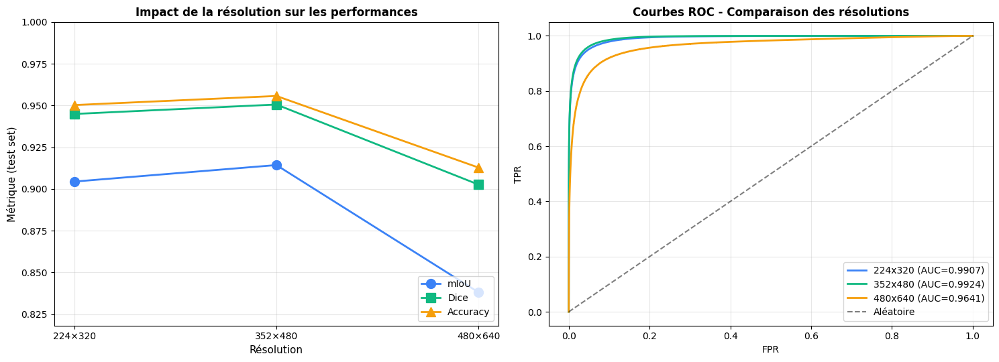

In [92]:
# === VISUALISATION DE L'IMPACT DE LA RÉSOLUTION ===

def plot_section_8_comparison(section_8_results, save_dir=None):
    """
    Graphiques montrant l'impact de la résolution sur les performances.
    """
    if not section_8_results:
        print(" Aucun résultat à afficher.")
        return

    if save_dir is None:
        save_dir = FIGURES_DIR

    # Trier par résolution (nombre de pixels)
    sorted_results = sorted(
        section_8_results.items(),
        key=lambda x: x[1]['config']['img_h'] * x[1]['config']['img_w']
    )

    fig, axes = plt.subplots(1, 2, figsize=(15, 5.5))

    # === Graphique 1 : mIoU vs résolution ===
    resolutions = []
    pixel_counts = []
    miou_vals = []
    acc_vals = []
    dice_vals = []

    for name, meta in sorted_results:
        res = f"{meta['config']['img_h']}x{meta['config']['img_w']}"
        pixels = meta['config']['img_h'] * meta['config']['img_w']
        resolutions.append(res)
        pixel_counts.append(pixels)
        miou_vals.append(meta['test_metrics']['miou'])
        acc_vals.append(meta['test_metrics']['accuracy'])
        dice_vals.append(meta['test_metrics']['dice'])

    x_positions = range(len(resolutions))

    axes[0].plot(x_positions, miou_vals, 'o-', label='mIoU', color='#3b82f6',
                  linewidth=2, markersize=10)
    axes[0].plot(x_positions, dice_vals, 's-', label='Dice', color='#10b981',
                  linewidth=2, markersize=10)
    axes[0].plot(x_positions, acc_vals, '^-', label='Accuracy', color='#f59e0b',
                  linewidth=2, markersize=10)

    axes[0].set_xticks(x_positions)
    axes[0].set_xticklabels(resolutions)
    axes[0].set_xlabel('Résolution', fontsize=11)
    axes[0].set_ylabel('Métrique (test set)', fontsize=11)
    axes[0].set_title('Impact de la résolution sur les performances',
                       fontsize=12, fontweight='bold')
    axes[0].legend(loc='lower right')
    axes[0].grid(alpha=0.3)
    axes[0].set_ylim([min(min(miou_vals), min(dice_vals), min(acc_vals)) - 0.02, 1.0])

    # === Graphique 2 : ROC superposées ===
    colors = ['#3b82f6', '#10b981', '#f59e0b', '#ef4444']

    print("Rechargement des modèles pour générer les courbes ROC...")

    for idx, (name, meta) in enumerate(sorted_results):
        backup_path = os.path.join(SINGLESPLIT_DIR, f"{name}_best.pth")
        if not os.path.exists(backup_path):
            continue

        # Reload modèle
        model = UNet(in_channels=3, n_classes=N_CLASSES, base_channels=64).to(DEVICE)
        checkpoint = torch.load(backup_path, map_location=DEVICE)
        model.load_state_dict(checkpoint['state_dict'])
        model.eval()

        # Test loader
        test_ds = PosidoniaDataset(
            root_path=LOCAL_PATH, split="testing",
            img_h=meta['config']['img_h'], img_w=meta['config']['img_w'],
            augment=False, preprocess=meta['config'].get('preprocess'),
        )
        test_loader = DataLoader(test_ds, batch_size=meta['config'].get('batch_size', 8),
                                   shuffle=False)

        # Évaluer
        test_results = evaluate_full(model, test_loader, device=DEVICE)

        res = f"{meta['config']['img_h']}x{meta['config']['img_w']}"
        axes[1].plot(test_results['fpr'], test_results['tpr'],
                      label=f"{res} (AUC={test_results['auc_roc']:.4f})",
                      color=colors[idx % len(colors)], linewidth=2)

        print(f"   {name} traité")

        del model
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    axes[1].plot([0, 1], [0, 1], 'k--', alpha=0.5, label='Aléatoire')
    axes[1].set_xlabel('FPR')
    axes[1].set_ylabel('TPR')
    axes[1].set_title('Courbes ROC - Comparaison des résolutions',
                       fontsize=12, fontweight='bold')
    axes[1].legend(loc='lower right')
    axes[1].grid(alpha=0.3)

    plt.tight_layout()

    save_path = os.path.join(save_dir, "section_8_resolution_comparison.png")
    plt.savefig(save_path, dpi=120, bbox_inches='tight')
    print(f"\n Sauvegardé : {save_path}")
    plt.show()


# Lancer la visualisation
if section_8_results:
    plot_section_8_comparison(section_8_results)
else:
    print("Aucune expérience disponible pour la visualisation.")

**Commentaire**: La résolution 352x480 semble donner de meilleurs résultats. Nous allons donc simplement continuer avec cette résolution